# 2ND ASSIGNMENT - QUANG HUY LE

## 1. Data Understanding, Preparation, Exploration and Visualization

### 1.1. Import Libraries

In [ ]:
import pandas as pd #for data manipulation and analysis
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for model evaluation
from sklearn.metrics import precision_recall_curve, precision_recall_curve, classification_report
from sklearn.metrics import classification_report, confusion_matrix

### 1.2. Load and Inspect Data

#### 1.2.1. Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
records = pd.read_csv("/content/drive/MyDrive/LA4PSchools.csv")

#### 1.2.2. Inspect Data

In [ ]:
print(records)

       StudentID  Gender  Year_02  Kinder_Age              Disability  \
0     SN35433053    Male     2020         5.5  Disability_Non-disable   
1     SN71277215  Female     2018         5.8  Disability_Non-disable   
2     SN40883127    Male     2021         5.9  Disability_Non-disable   
3     SN93063777    Male     2021         5.7  Disability_Non-disable   
4     SN84195329    Male     2021         5.8  Disability_Non-disable   
...          ...     ...      ...         ...                     ...   
1995  SN72182891  Female     2016         4.9    Disability_Cognitive   
1996  SN69853705  Female     2021         4.6  Disability_Non-disable   
1997  SN64915269    Male     2016         5.7  Disability_Non-disable   
1998  SN70943748  Female     2021         5.4  Disability_Non-disable   
1999  SN70826435    Male     2017         5.6    Disability_Cognitive   

      NCCD-Funded  01.SES  02.SES  NumSibling  SiblingOrder  ...  \
0               0     104     104           3          

In [ ]:
records.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   StudentID                       2000 non-null   object 
 1   Gender                          2000 non-null   object 
 2   Year_02                         2000 non-null   int64  
 3   Kinder_Age                      2000 non-null   float64
 4   Disability                      2000 non-null   object 
 5   NCCD-Funded                     2000 non-null   int64  
 6   01.SES                          2000 non-null   int64  
 7   02.SES                          2000 non-null   int64  
 8   NumSibling                      2000 non-null   int64  
 9   SiblingOrder                    2000 non-null   int64  
 10  NumAbvYear9                     2000 non-null   int64  
 11  NumAbvDiploma                   2000 non-null   int64  
 12  NumProf                         20

In [ ]:
records.isnull().sum()

,0
StudentID,0
Gender,0
Year_02,0
Kinder_Age,0
Disability,0
NCCD-Funded,0
01.SES,0
02.SES,0
NumSibling,0
SiblingOrder,0


In [ ]:
records.describe()

,Year_02,Kinder_Age,NCCD-Funded,01.SES,02.SES,NumSibling,SiblingOrder,NumAbvYear9,NumAbvDiploma,NumProf,...,WritingVocab-01-SOY,HRSIW-01-SOY,Counting-01,Counting-02,Place Value-01,Place Value-02,Addition and Subtraction-01,Addition and Subtraction-02,Multiplication and Division-01,Multiplication and Division-02
count,2000.000000,2000.000000,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,2018.640000,5.276400,0.089000,102.9415,102.117500,2.356500,1.748500,1.564000,0.886500,0.766500,...,22.018500,30.508000,1.758000,2.850500,1.028500,1.681500,1.290500,2.257500,1.075500,1.797500
std,1.664568,0.348129,0.284815,9.3859,9.150167,0.993932,0.865229,0.725374,0.837836,0.811977,...,12.679098,10.020686,0.935881,1.072719,0.529932,0.639736,0.935172,1.155795,0.837944,0.771875
min,2016.000000,4.500000,0.000000,78.0000,78.000000,1.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,-3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2017.000000,5.000000,0.000000,95.0000,95.000000,2.000000,1.000000,1.000000,0.000000,0.000000,...,13.000000,25.000000,1.000000,2.000000,1.000000,1.000000,1.000000,2.000000,0.000000,2.000000
50%,2018.000000,5.300000,0.000000,101.0000,101.000000,2.000000,2.000000,2.000000,1.000000,1.000000,...,20.000000,32.000000,2.000000,3.000000,1.000000,2.000000,1.000000,2.000000,1.000000,2.000000
75%,2020.000000,5.500000,0.000000,113.0000,109.000000,3.000000,2.000000,2.000000,2.000000,1.000000,...,29.000000,37.000000,2.000000,4.000000,1.000000,2.000000,2.000000,3.000000,2.000000,2.000000
max,2021.000000,6.500000,1.000000,120.0000,120.000000,7.000000,6.000000,3.000000,2.000000,2.000000,...,95.000000,58.000000,5.000000,6.000000,4.000000,5.000000,5.000000,6.000000,4.000000,5.000000


In [ ]:
# Calculate the median of 'NumAbvYear9'
median_value = records['NumAbvYear9'].median()

# Replace values greater than 2 with the median
records.loc[records['NumAbvYear9'] > 2, 'NumAbvYear9'] = median_value

In [ ]:
#Drop the row of Student ID of SN70827296
records = records[records['StudentID'] != 'SN70827296']

In [ ]:
# Columns to replace negative values with 0
columns_to_replace = [
    'Clay-01-SOY', 'Clay-01-EOY', 'TextLevel-01-SOY',
    'TextLevel-01-MOY', 'TextLevel-01-EOY', 'TextLevel-02-SOY',
    'TextLevel-02-MOY', 'TextLevel-02-EOY', 'WritingVocab-01-SOY',
    'HRSIW-01-SOY'
]

# Replace negative values with 0
records[columns_to_replace] = records[columns_to_replace].clip(lower=0)

In [ ]:
records = records.drop(['StudentID'], axis=1)
records.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1999 entries, 0 to 1999
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          1999 non-null   object 
 1   Year_02                         1999 non-null   int64  
 2   Kinder_Age                      1999 non-null   float64
 3   Disability                      1999 non-null   object 
 4   NCCD-Funded                     1999 non-null   int64  
 5   01.SES                          1999 non-null   int64  
 6   02.SES                          1999 non-null   int64  
 7   NumSibling                      1999 non-null   int64  
 8   SiblingOrder                    1999 non-null   int64  
 9   NumAbvYear9                     1999 non-null   int64  
 10  NumAbvDiploma                   1999 non-null   int64  
 11  NumProf                         1999 non-null   int64  
 12  Burt-01-SOY                     1999 no

In [ ]:
#Convert categorical variables to numerical

# Convert Year3_Writing_At_Risk
def coding_Year3_Writing_At_Risk(x):
    if x == True: return 1
    if x == False: return 0

records['year3_writing_at_risk'] = records['Year3_Writing_At_Risk'].apply(coding_Year3_Writing_At_Risk)

In [ ]:
# Convert Gender
def coding_Gender(x):
    if x == 'Male': return 1
    if x == 'Female': return 0

records['gender'] = records['Gender'].apply(coding_Gender)

In [ ]:
#Convert Disability using dummy encoding
disability_dummies = pd.get_dummies(records['Disability'], drop_first=False)
disability_dummies = disability_dummies.applymap(int)
records = pd.concat([records, disability_dummies], axis=1)

<ipython-input-219-6e67684a54a4>:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  disability_dummies = disability_dummies.applymap(int)


In [ ]:
# Display sample rows from the modified DataFrame
print(records.sample(10))

      Gender  Year_02  Kinder_Age              Disability  NCCD-Funded  \
539     Male     2017         5.1  Disability_Non-disable            0   
225   Female     2021         4.9  Disability_Non-disable            0   
343   Female     2020         5.6  Disability_Non-disable            0   
267     Male     2021         5.6    Disability_Cognitive            0   
177   Female     2017         5.2  Disability_Non-disable            0   
498   Female     2017         5.7  Disability_Non-disable            0   
436     Male     2021         5.0  Disability_Non-disable            0   
1179  Female     2020         5.0  Disability_Non-disable            0   
1333  Female     2020         5.6  Disability_Non-disable            0   
1750    Male     2018         4.8  Disability_Non-disable            0   

      01.SES  02.SES  NumSibling  SiblingOrder  NumAbvYear9  ...  \
539      114     114           4             2            2  ...   
225      113     105           2             2   

In [ ]:
records.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1999 entries, 0 to 1999
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          1999 non-null   object 
 1   Year_02                         1999 non-null   int64  
 2   Kinder_Age                      1999 non-null   float64
 3   Disability                      1999 non-null   object 
 4   NCCD-Funded                     1999 non-null   int64  
 5   01.SES                          1999 non-null   int64  
 6   02.SES                          1999 non-null   int64  
 7   NumSibling                      1999 non-null   int64  
 8   SiblingOrder                    1999 non-null   int64  
 9   NumAbvYear9                     1999 non-null   int64  
 10  NumAbvDiploma                   1999 non-null   int64  
 11  NumProf                         1999 non-null   int64  
 12  Burt-01-SOY                     1999 no

### 1.3. Conduct Exploratory Data Analysis

#### 1.3.1. Univariate Analysis

##### a. Categorical variables

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<Axes: xlabel='Year3_Writing_At_Risk', ylabel='count'>

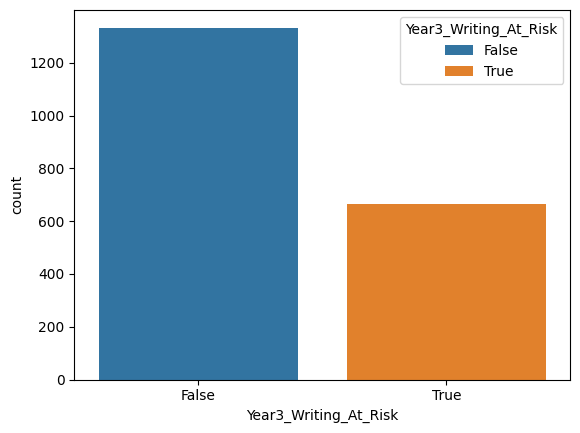

In [ ]:
#Writing At Risk
sns.countplot(data=records, x='Year3_Writing_At_Risk', hue='Year3_Writing_At_Risk')

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<Axes: xlabel='Gender', ylabel='count'>

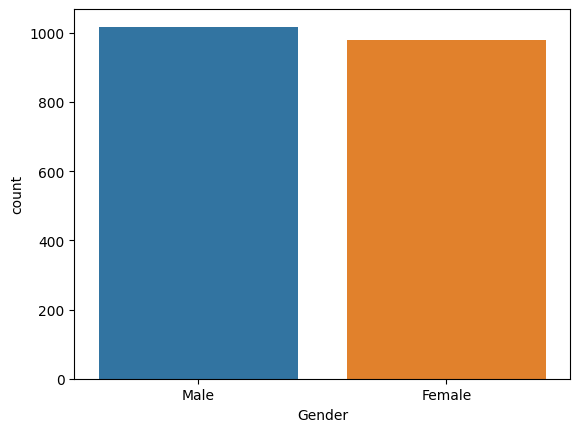

In [ ]:
#Gender
sns.countplot(data=records, x='Gender', hue='Gender')

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When 

<Axes: xlabel='Disability', ylabel='count'>

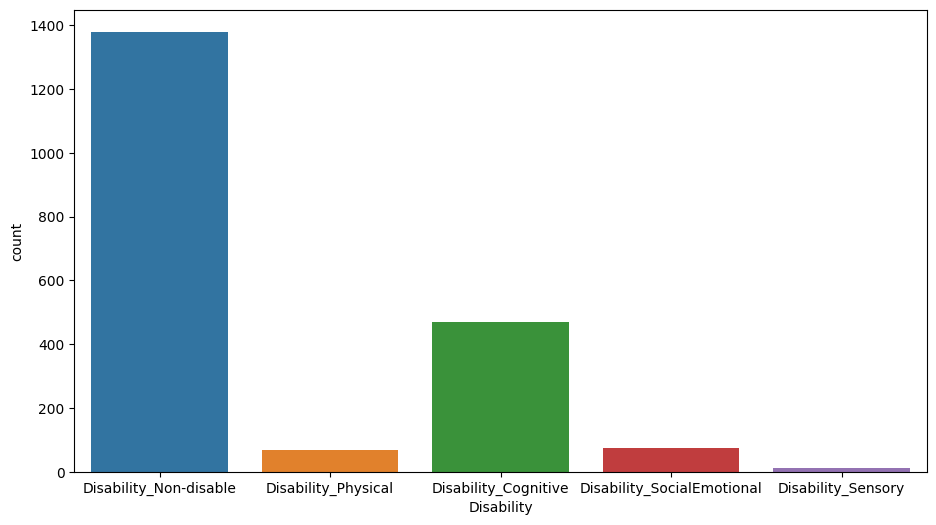

In [ ]:
#Disability
plt.figure(figsize=(11, 6))
sns.countplot(data=records, x='Disability', hue='Disability')

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When 

<Axes: xlabel='Year_02', ylabel='count'>

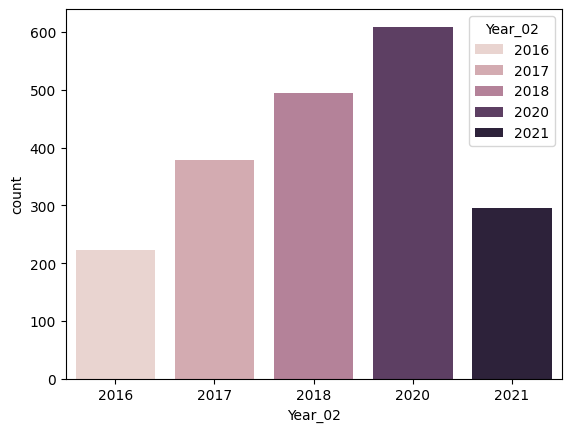

In [ ]:
#Year
sns.countplot(data=records, x='Year_02', hue='Year_02')

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When 

<Axes: xlabel='SiblingOrder', ylabel='count'>

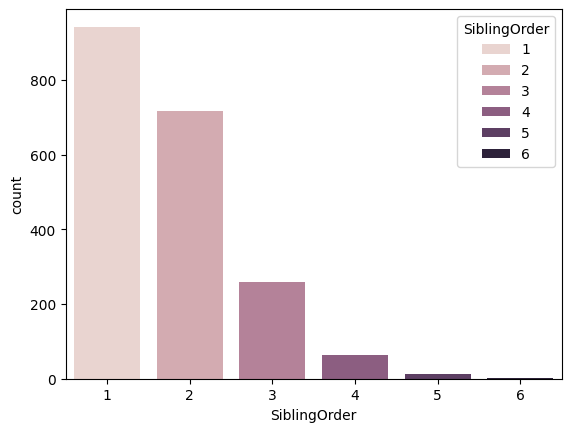

In [ ]:
#Sibling Order
sns.countplot(data=records, x='SiblingOrder', hue='SiblingOrder')

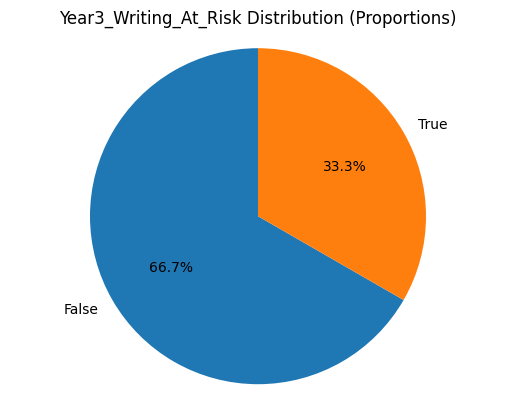

In [ ]:
#Pie Chart for Writing At Risk
# Calculate proportions
risk_proportion = records['Year3_Writing_At_Risk'].value_counts(normalize=True)

# Create pie chart
plt.pie(risk_proportion, labels=risk_proportion.index, autopct='%1.1f%%', startangle=90)

# Add title
plt.title('Year3_Writing_At_Risk Distribution (Proportions)')

# Ensure circle's proportion
plt.axis('equal')

# Display chart
plt.show()

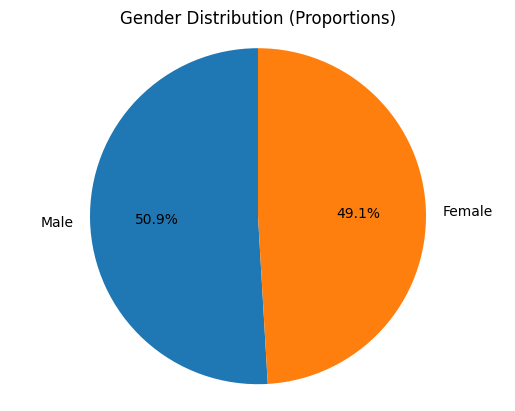

In [ ]:
#Pie Chart for Gender
# Calculate proportions
gender_proportion = records['Gender'].value_counts(normalize=True)

# Create pie chart
plt.pie(gender_proportion, labels=gender_proportion.index, autopct='%1.1f%%', startangle=90)

# Add title
plt.title('Gender Distribution (Proportions)')

# Ensure circle's proportion
plt.axis('equal')

# Display chart
plt.show()

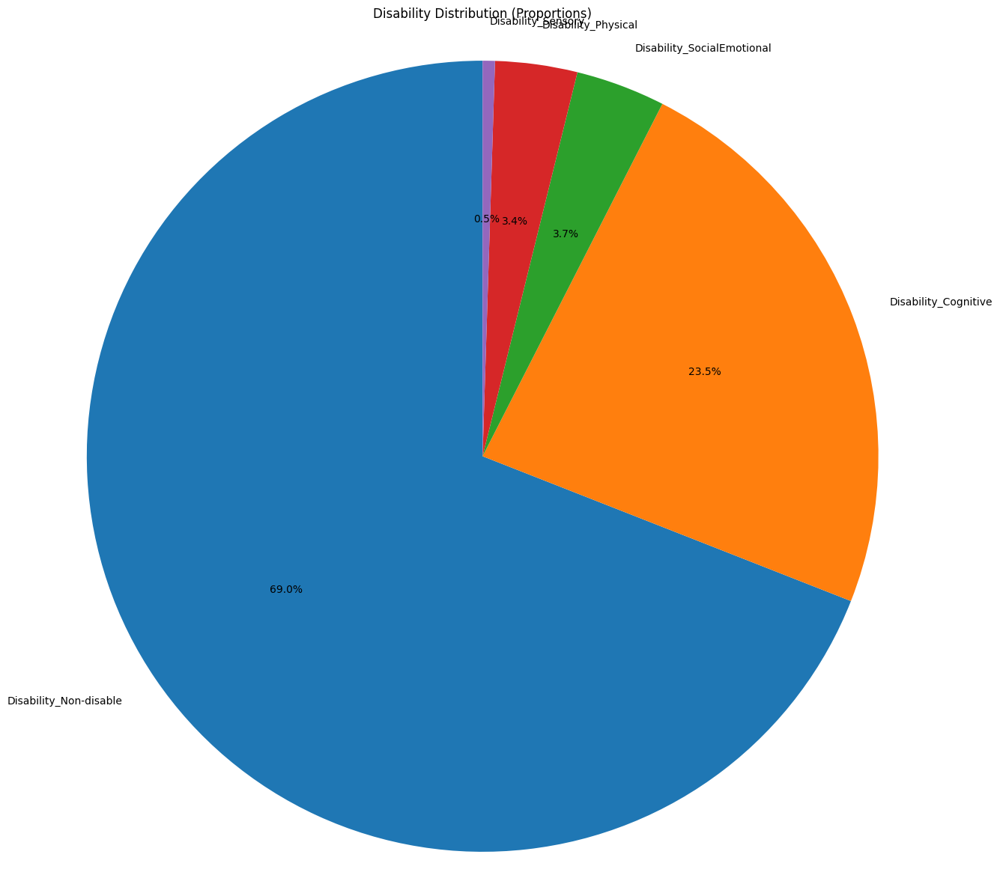

In [ ]:
#Pie Chart for Disability
# Calculate proportions
disability_proportion = records['Disability'].value_counts(normalize=True)

# Create pie chart
plt.figure(figsize=(15, 15))
plt.pie(disability_proportion, labels=disability_proportion.index, autopct='%1.1f%%', startangle=90)

# Add title
plt.title('Disability Distribution (Proportions)')

# Ensure circle's proportion
plt.axis('equal')

# Display chart
plt.show()

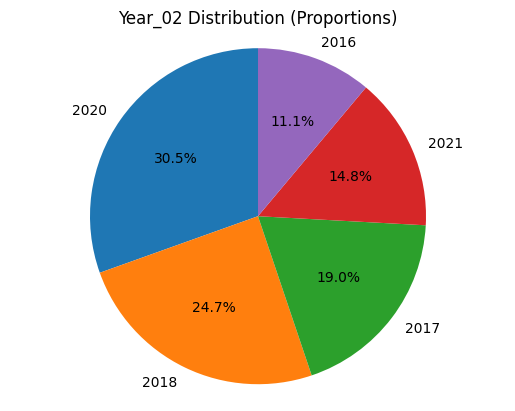

In [ ]:
#Pie Chart for Year
# Calculate proportions
year_02_proportion = records['Year_02'].value_counts(normalize=True)

# Create pie chart
plt.pie(year_02_proportion, labels=year_02_proportion.index, autopct='%1.1f%%', startangle=90)

# Add title
plt.title('Year_02 Distribution (Proportions)')

# Ensure circle's proportion
plt.axis('equal')

# Display chart
plt.show()

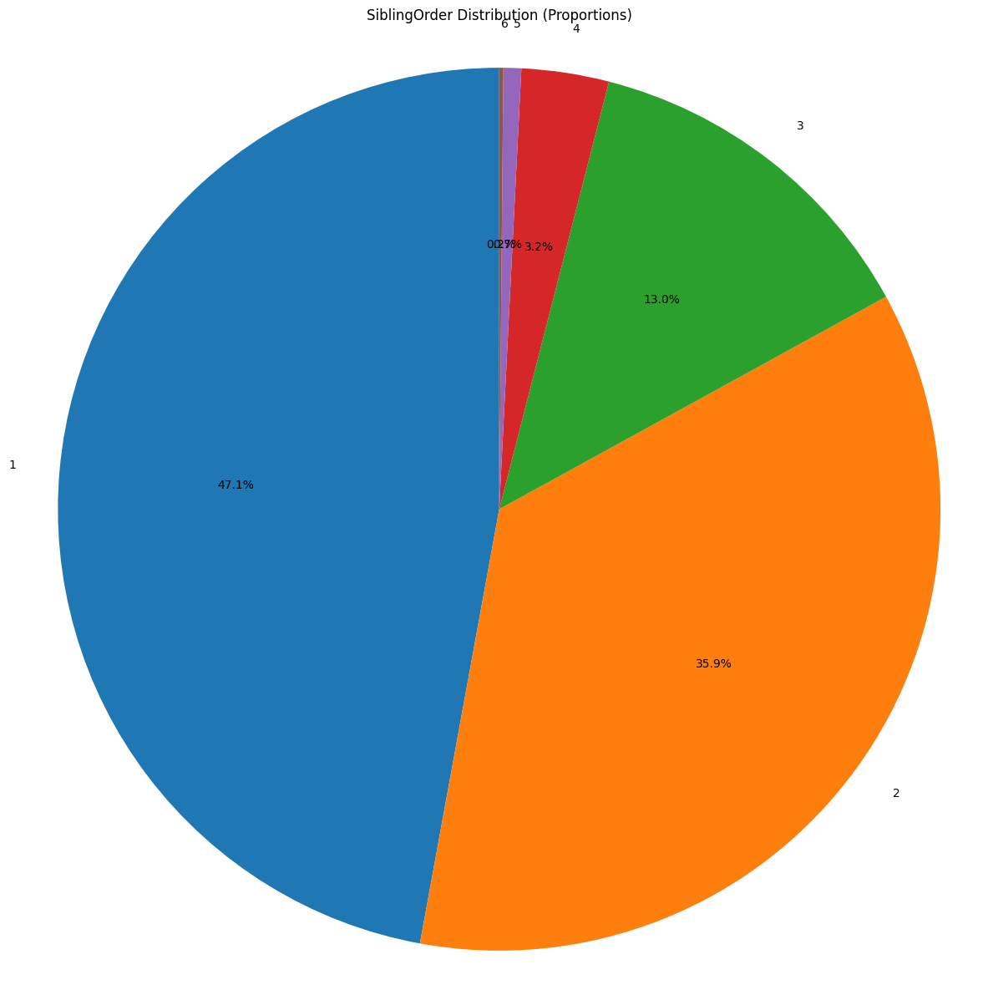

In [ ]:
#Pie Chart for Sibling Order
# Calculate proportions
siblingorder_proportion = records['SiblingOrder'].value_counts(normalize=True)

# Create pie chart
plt.figure(figsize=(15, 15))
plt.pie(siblingorder_proportion, labels=siblingorder_proportion.index, autopct='%1.1f%%', startangle=90)

# Add title
plt.title('SiblingOrder Distribution (Proportions)')

# Ensure circle's proportion
plt.axis('equal')

# Display chart
plt.show()

In [ ]:
#Year 3_Writing_At_Risk counts
records['Year3_Writing_At_Risk'].value_counts()

,count
Year3_Writing_At_Risk,
False,1333
True,666


In [ ]:
#Gender counts
records['Gender'].value_counts()

,count
Gender,
Male,1018
Female,981


In [ ]:
#Disability counts
records['Disability'].value_counts()

,count
Disability,
Disability_Non-disable,1380
Disability_Cognitive,469
Disability_SocialEmotional,73
Disability_Physical,67
Disability_Sensory,10


In [ ]:
#Year counts
records['Year_02'].value_counts()

,count
Year_02,
2020,609
2018,494
2017,379
2021,295
2016,222


In [ ]:
#Sibing Order counts
records['SiblingOrder'].value_counts()

,count
SiblingOrder,
1,942
2,717
3,260
4,64
5,13
6,3


In [ ]:
#Year3_Writing_At_Risk proportion
records['Year3_Writing_At_Risk'].value_counts(normalize=True).round(4)

,proportion
Year3_Writing_At_Risk,
False,0.6668
True,0.3332


In [ ]:
#Gender proportion
records['Gender'].value_counts(normalize=True).round(4)

,proportion
Gender,
Male,0.5093
Female,0.4907


In [ ]:
#Disability Proportion
records['Disability'].value_counts(normalize=True).round(4)

,proportion
Disability,
Disability_Non-disable,0.6903
Disability_Cognitive,0.2346
Disability_SocialEmotional,0.0365
Disability_Physical,0.0335
Disability_Sensory,0.0050


In [ ]:
#Year_02 proportion
records['Year_02'].value_counts(normalize=True).round(4)

,proportion
Year_02,
2020,0.3047
2018,0.2471
2017,0.1896
2021,0.1476
2016,0.1111


In [ ]:
#Sibling Order proportion
records['SiblingOrder'].value_counts(normalize=True).round(4)

,proportion
SiblingOrder,
1,0.4712
2,0.3587
3,0.1301
4,0.0320
5,0.0065
6,0.0015


In [ ]:
#Year3_Writing_At_Risk Describe
records['Year3_Writing_At_Risk'].describe()

,Year3_Writing_At_Risk
count,1999
unique,2
top,False
freq,1333


In [ ]:
#Gender Describe
records['Gender'].describe()

,Gender
count,1999
unique,2
top,Male
freq,1018


In [ ]:
#Disability Describe
records['Disability'].describe()

,Disability
count,1999
unique,5
top,Disability_Non-disable
freq,1380


In [ ]:
#Year_02 Describe
records['Year_02'].describe()

,Year_02
count,1999.000000
mean,2018.640320
std,1.664923
min,2016.000000
25%,2017.000000
50%,2018.000000
75%,2020.000000
max,2021.000000


In [ ]:
#Sibling Order Describe
records['SiblingOrder'].describe()

,SiblingOrder
count,1999.000000
mean,1.748374
std,0.865428
min,1.000000
25%,1.000000
50%,2.000000
75%,2.000000
max,6.000000


##### b. Numerical variables

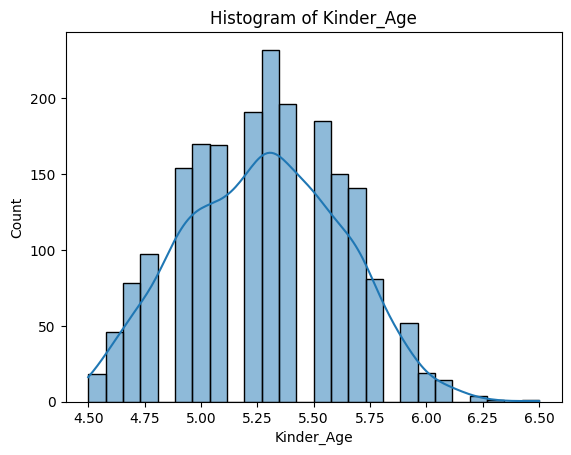

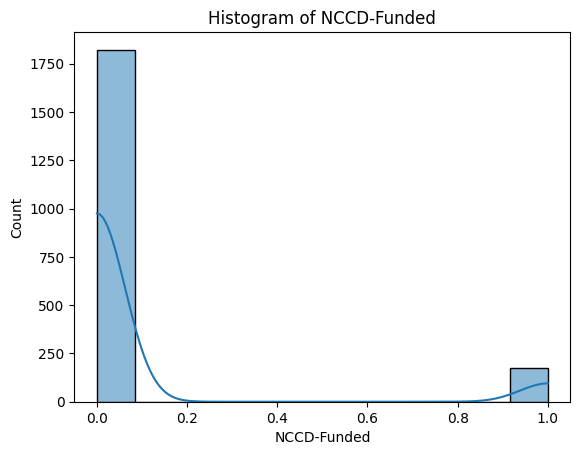

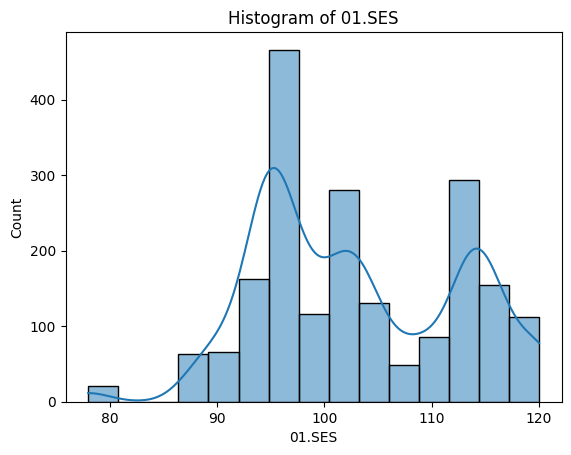

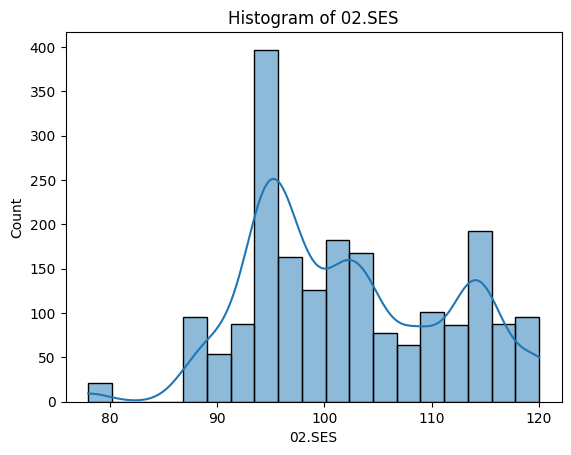

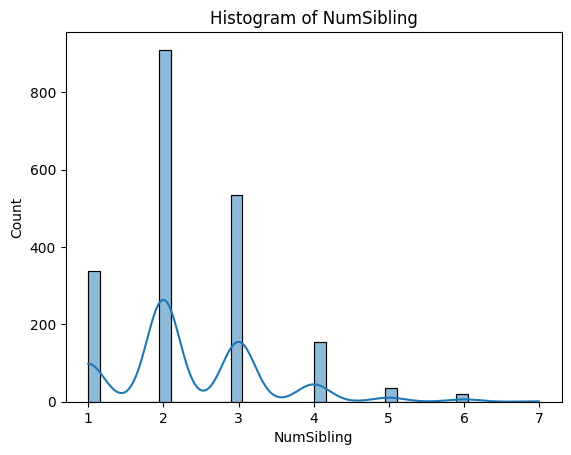

...

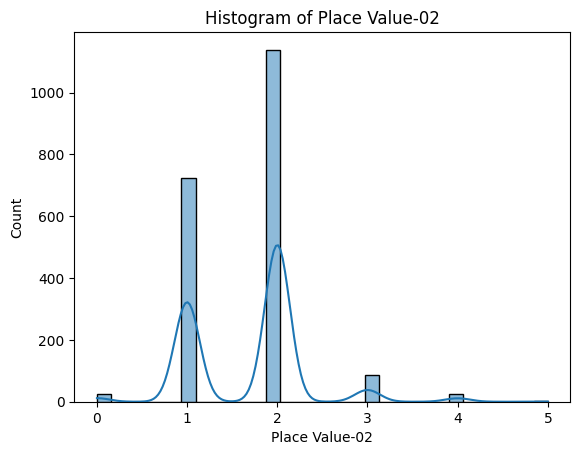

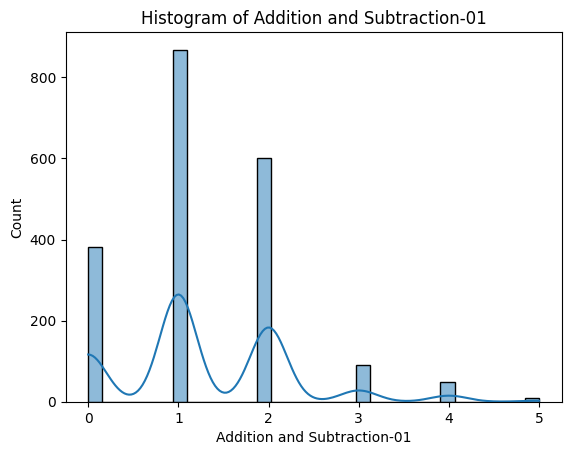

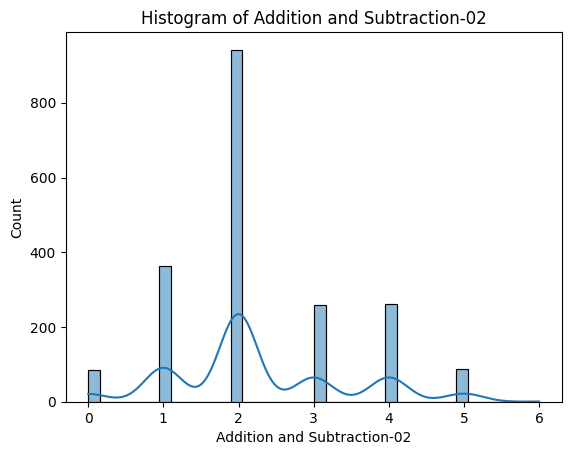

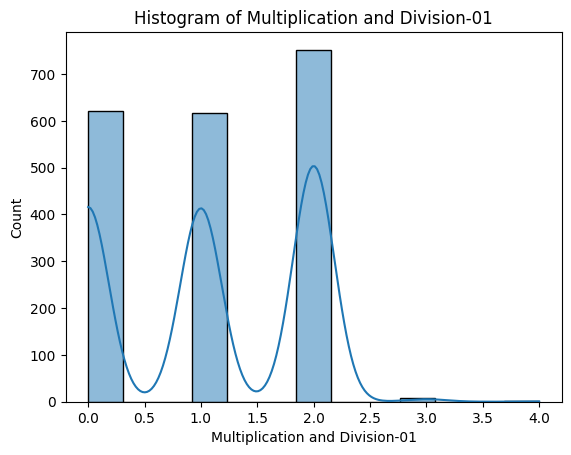

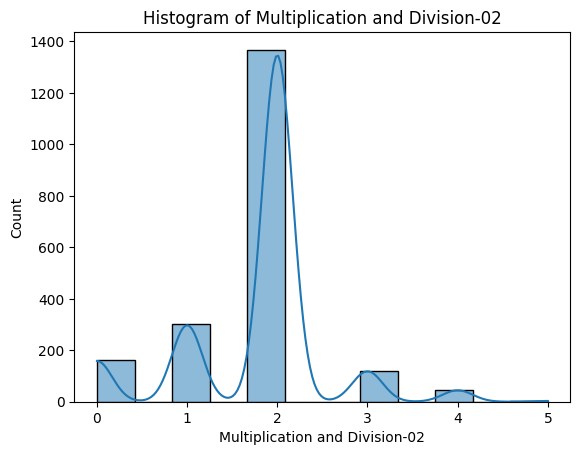

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


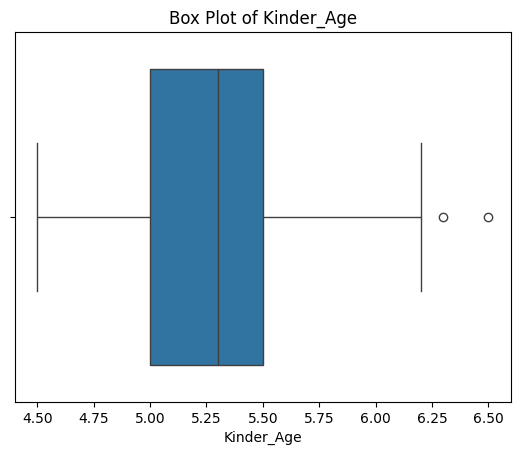

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


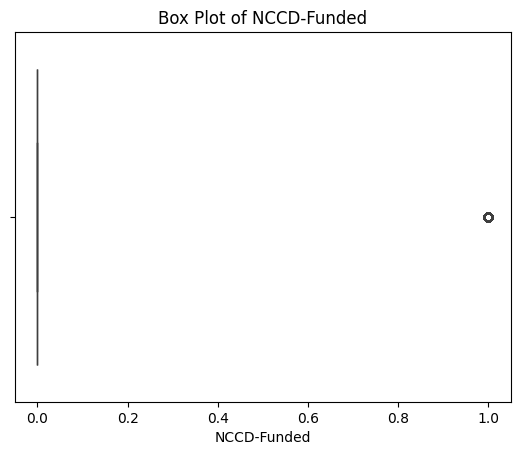

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


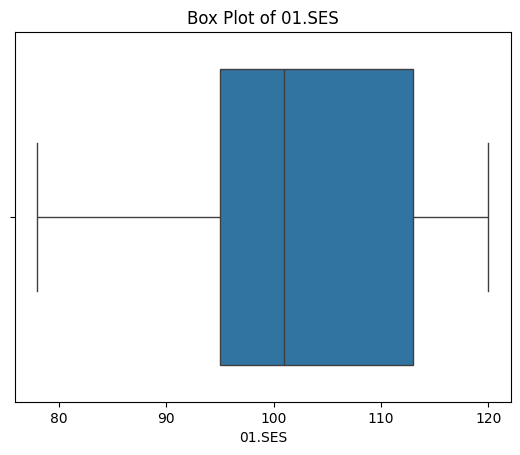

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


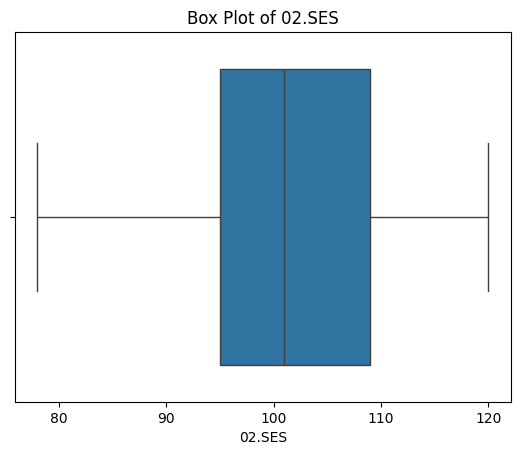

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


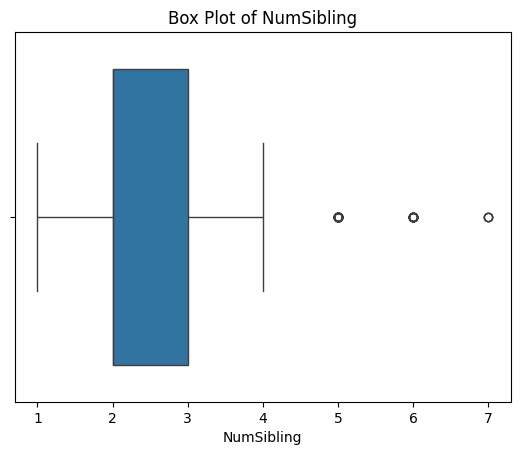

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


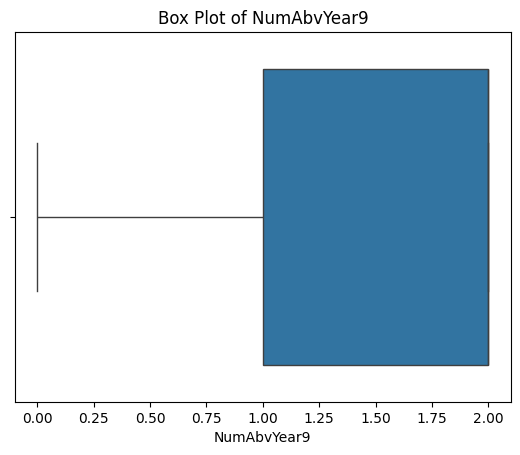

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


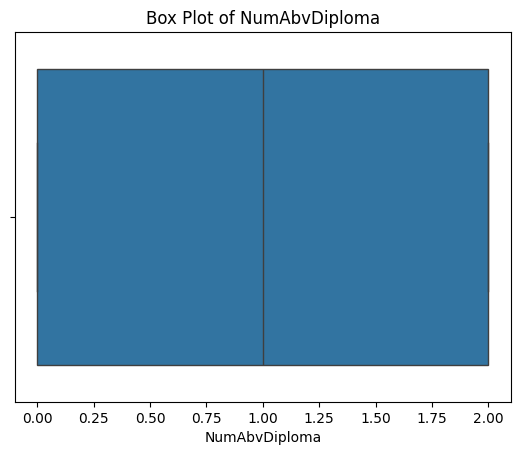

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


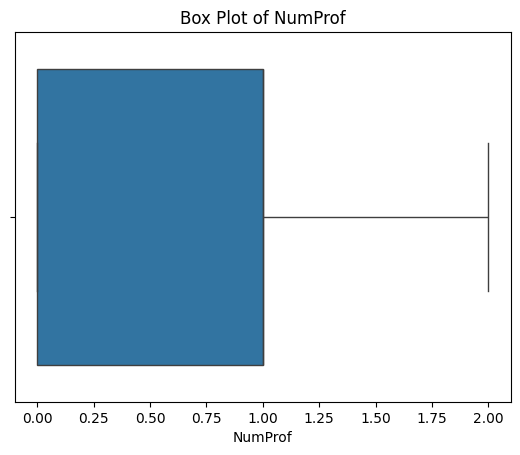

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


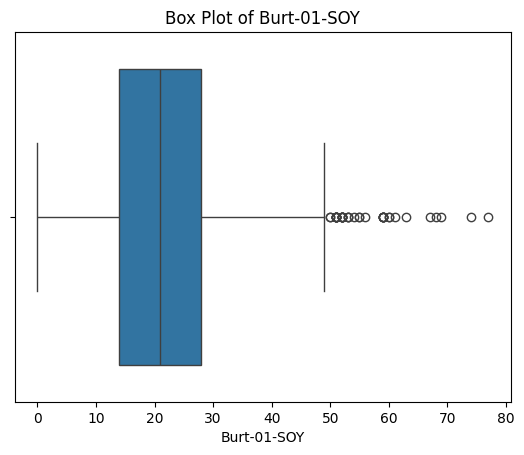

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


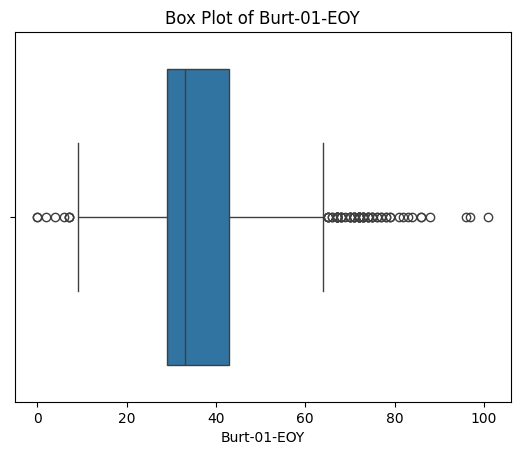

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


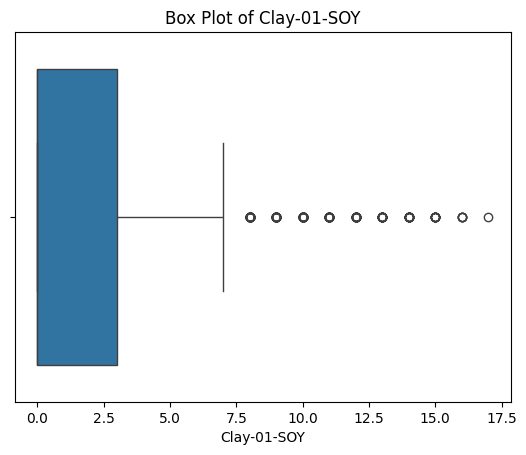

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


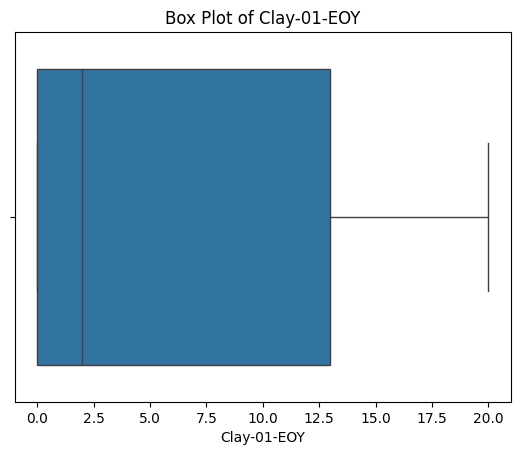

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


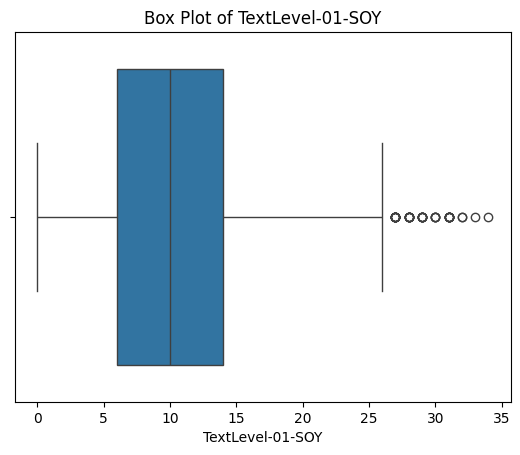

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


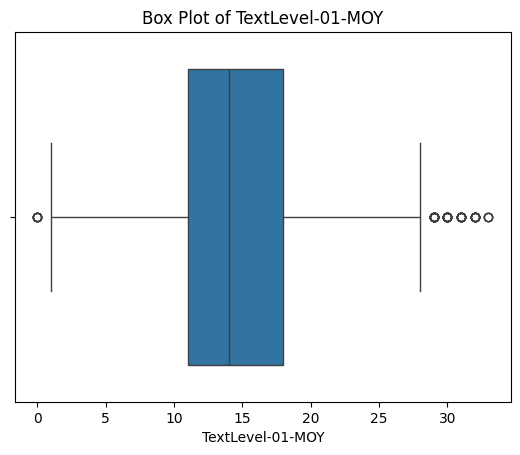

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


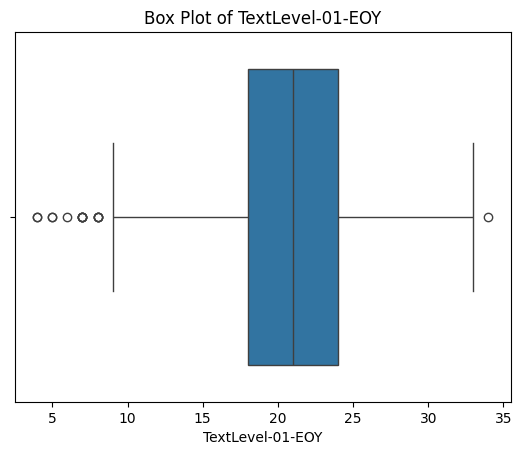

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


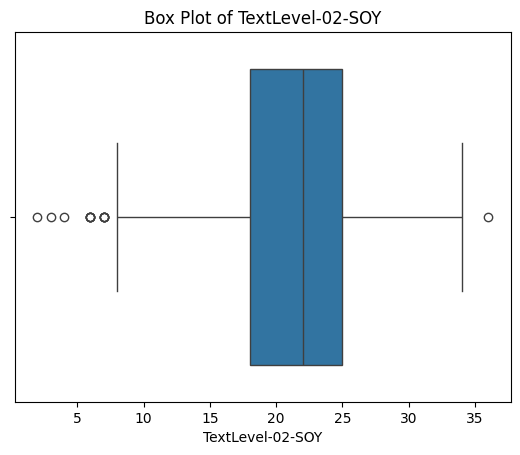

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


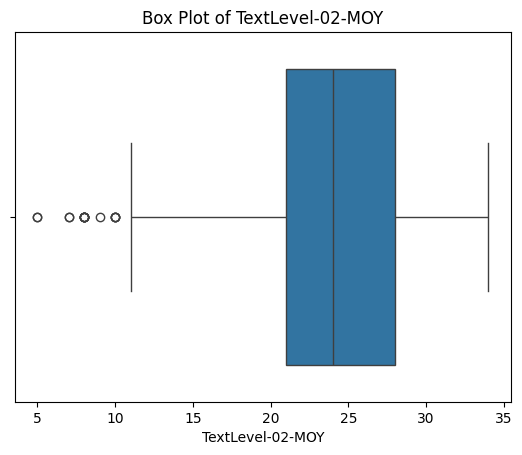

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


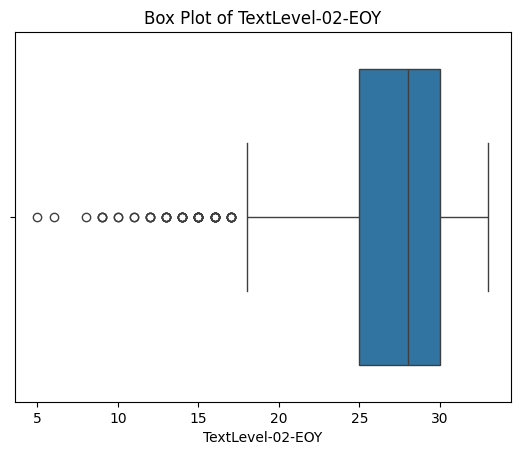

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


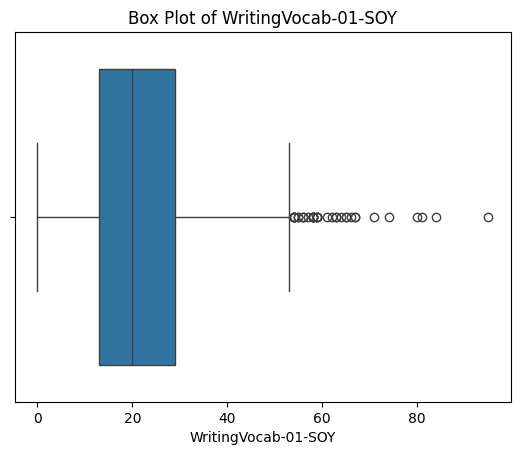

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


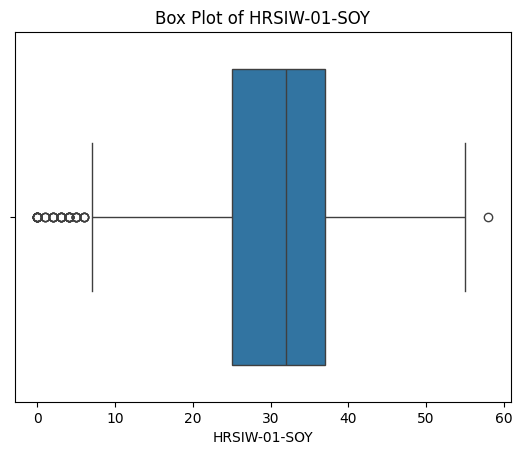

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


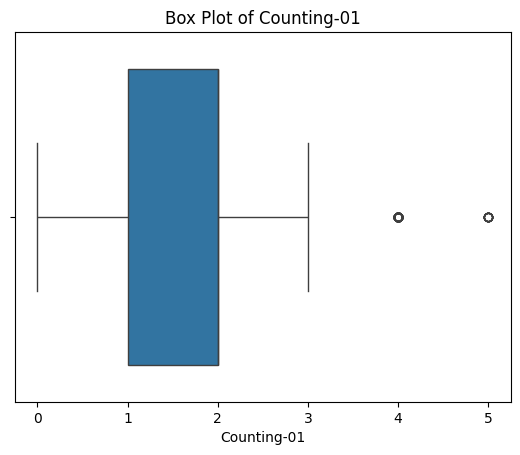

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


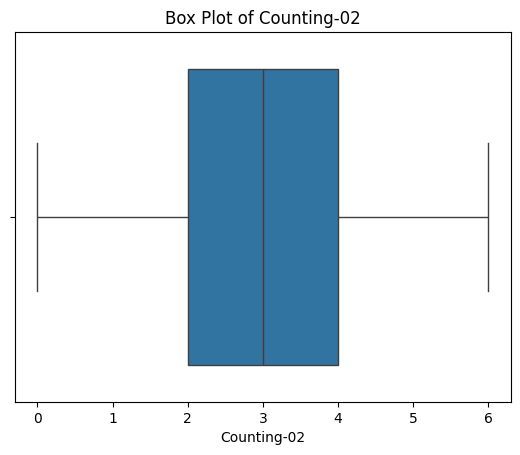

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


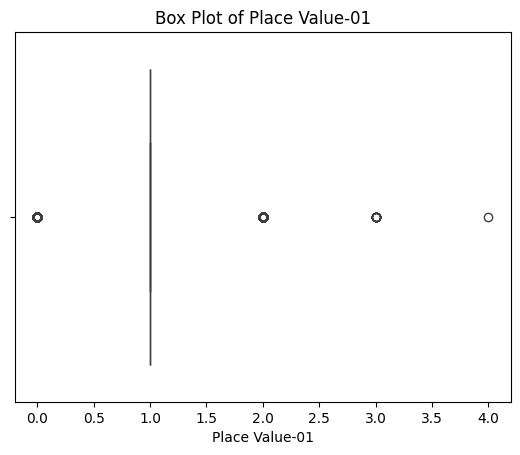

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


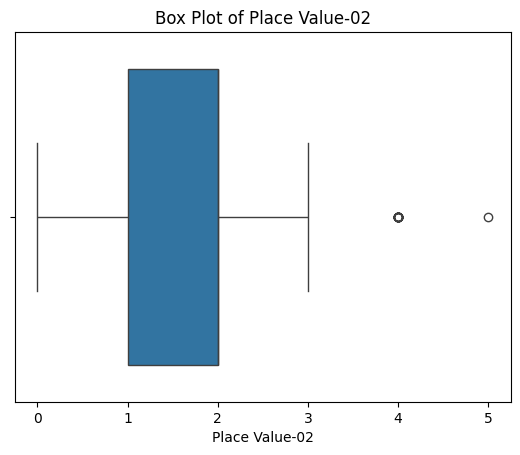

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


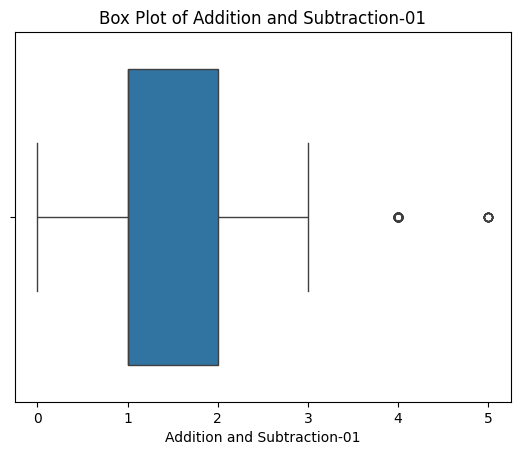

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


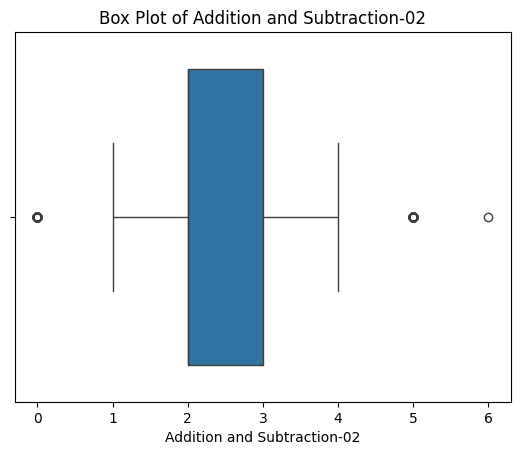

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


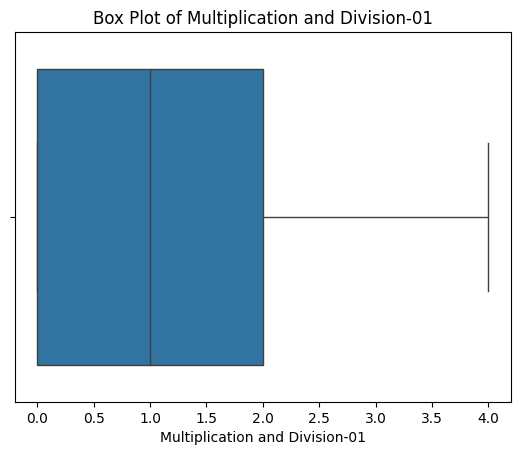

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


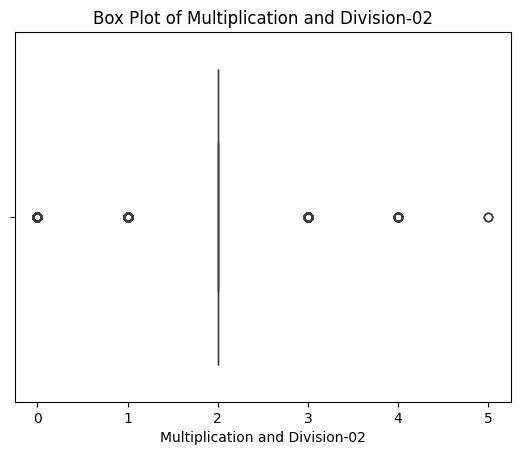

In [ ]:
#Get numerical variables
numerical_variables = ['Kinder_Age', 'NCCD-Funded', '01.SES', '02.SES', 'NumSibling',
    'NumAbvYear9', 'NumAbvDiploma', 'NumProf', 'Burt-01-SOY', 'Burt-01-EOY',
    'Clay-01-SOY', 'Clay-01-EOY', 'TextLevel-01-SOY', 'TextLevel-01-MOY',
    'TextLevel-01-EOY', 'TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY',
    'WritingVocab-01-SOY', 'HRSIW-01-SOY', 'Counting-01', 'Counting-02',
    'Place Value-01', 'Place Value-02', 'Addition and Subtraction-01',
    'Addition and Subtraction-02', 'Multiplication and Division-01',
    'Multiplication and Division-02']

#Histogram for numerical variables
for variable in numerical_variables:
    sns.histplot(data=records, x=variable, kde=True)
    plt.title(f"Histogram of {variable}")
    plt.show()

#Box Plot for numerical variables
for variable in numerical_variables:
    sns.boxplot(data=records, x=variable)
    plt.title(f"Box Plot of {variable}")
    plt.show()

#### 1.3.2. Bivariate Analysis

##### a. Categoriccal variables

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


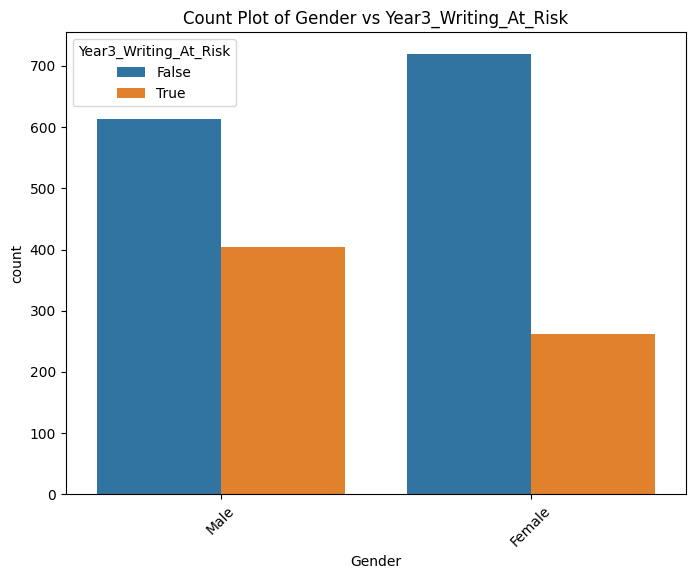

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


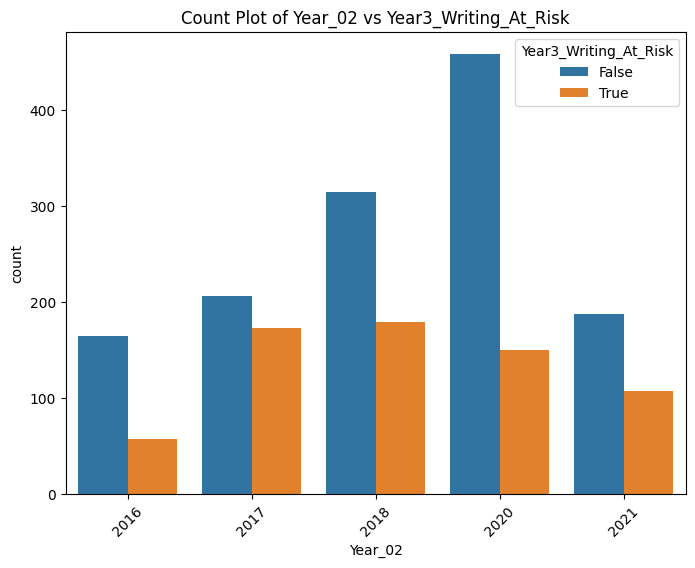

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


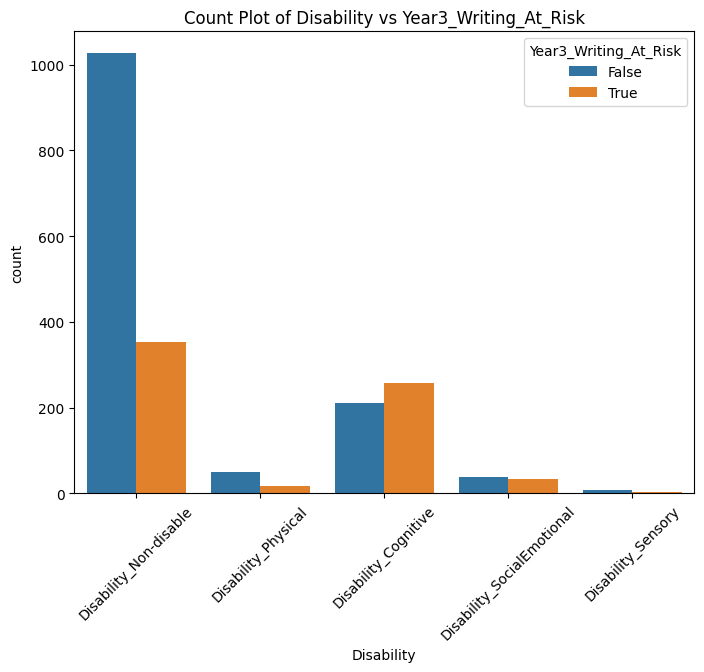

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


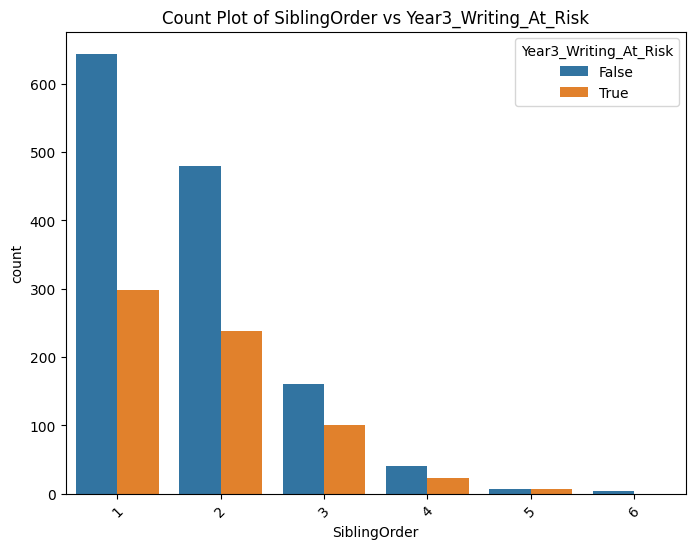

In [ ]:
#Get categorical variables
categorical_variables = ['Gender', 'Year_02',  'Disability', 'SiblingOrder']

#countplot for one categorical variable vs target variable
for variable in categorical_variables:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=variable, hue='Year3_Writing_At_Risk', data=records)
    plt.title(f'Count Plot of {variable} vs Year3_Writing_At_Risk')
    plt.xticks(rotation=45)
    plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


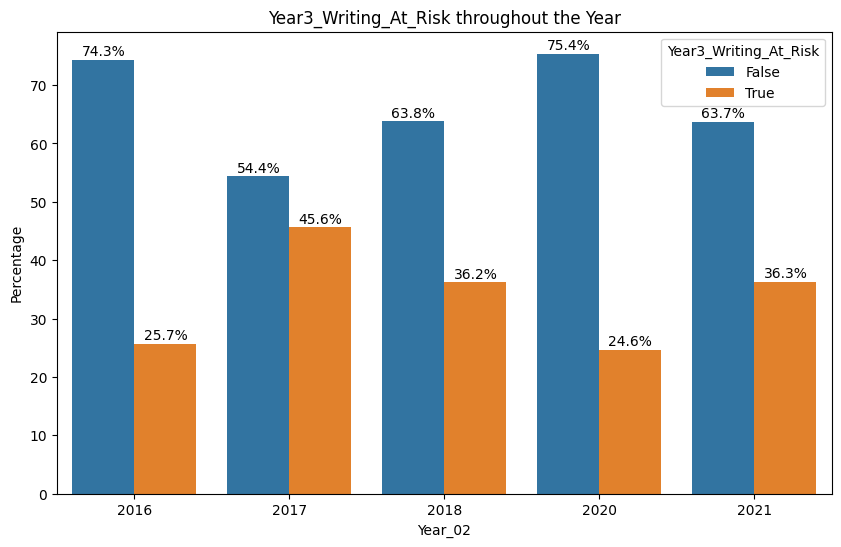

In [ ]:
df_percent = records.groupby('Year_02')['Year3_Writing_At_Risk'].value_counts(normalize=True).mul(100).rename('percentage').reset_index()

# Create the percentage plot
plt.figure(figsize=(10, 6))
bar_plot = sns.barplot(x='Year_02', y='percentage', hue='Year3_Writing_At_Risk', data=df_percent)

# Add title and labels
plt.title('Year3_Writing_At_Risk throughout the Year')
plt.xlabel('Year_02')
plt.ylabel('Percentage')

# Annotate each bar with the corresponding percentage value, skipping if the value is too small
for p in bar_plot.patches:
    if p.get_height() > 0.5:  # Only annotate bars with a height greater than 0.5%
        bar_plot.annotate(f'{p.get_height():.1f}%',
                          (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha='center', va='baseline', fontsize=10, color='black',
                          xytext=(0, 3), textcoords='offset points')

# Show the plot
plt.show()

##### b. Numerical variables

###### Boxplots of Numerical variables vs Target variable

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


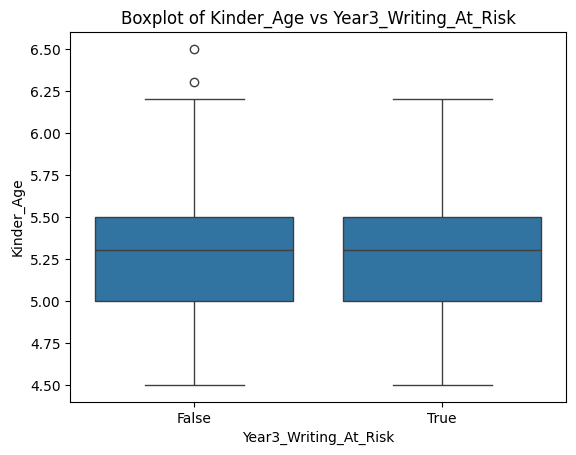

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  4.5  5.0  5.3  5.5  6.5
True                   4.5  5.0  5.3  5.5  6.2


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


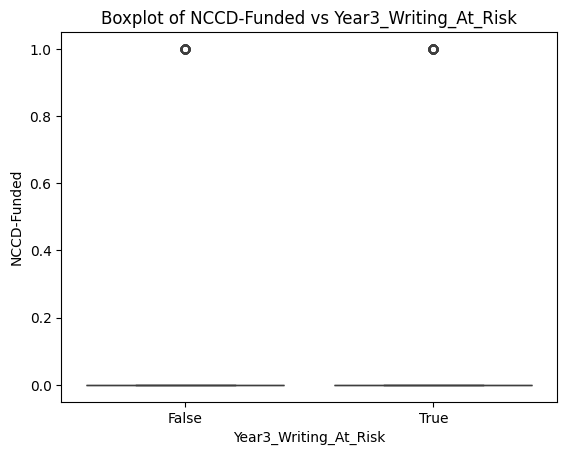

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  0.0  0.0  0.0  1.0
True                   0.0  0.0  0.0  0.0  1.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


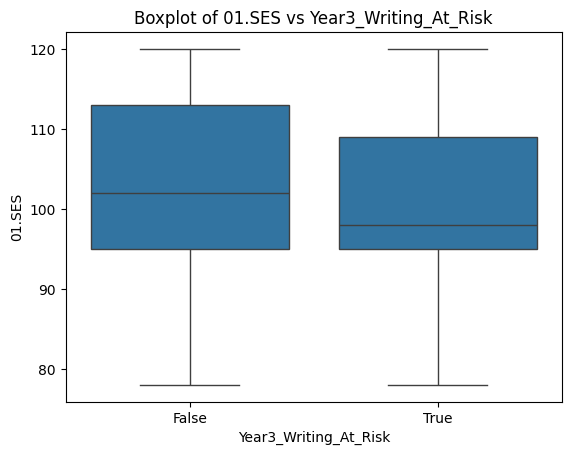

                        min   25%    50%    75%    max
Year3_Writing_At_Risk                                 
False                  78.0  95.0  102.0  113.0  120.0
True                   78.0  95.0   98.0  109.0  120.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


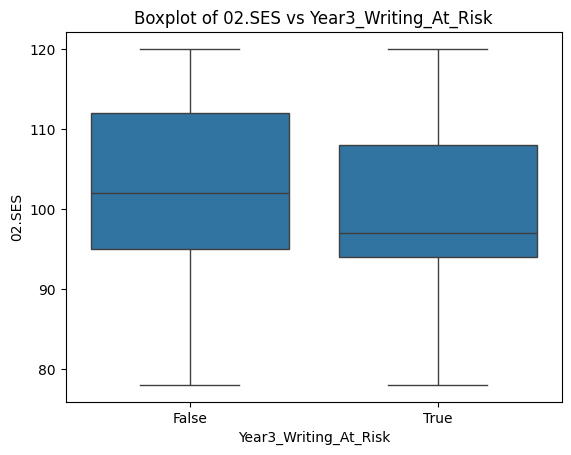

                        min   25%    50%    75%    max
Year3_Writing_At_Risk                                 
False                  78.0  95.0  102.0  112.0  120.0
True                   78.0  94.0   97.0  108.0  120.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


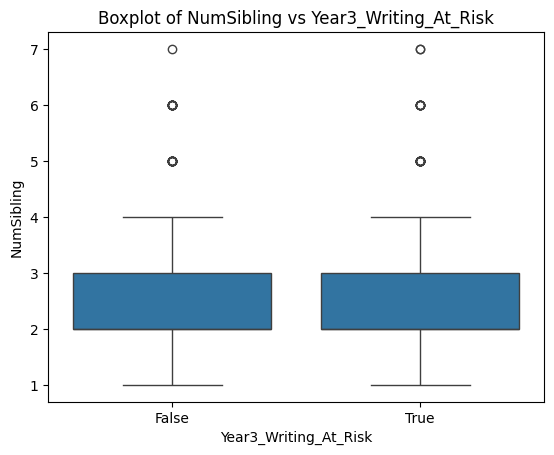

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  1.0  2.0  2.0  3.0  7.0
True                   1.0  2.0  2.0  3.0  7.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


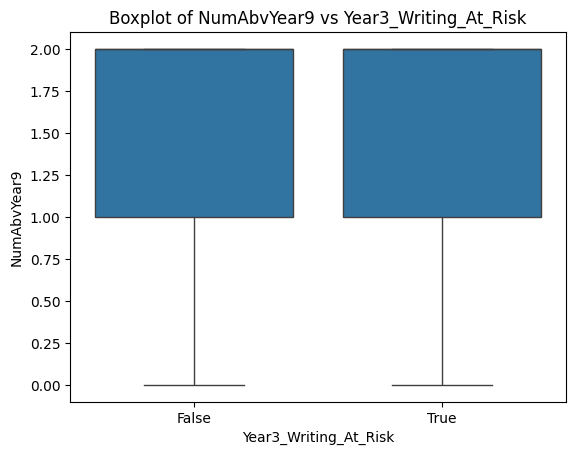

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  1.0  2.0  2.0  2.0
True                   0.0  1.0  2.0  2.0  2.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


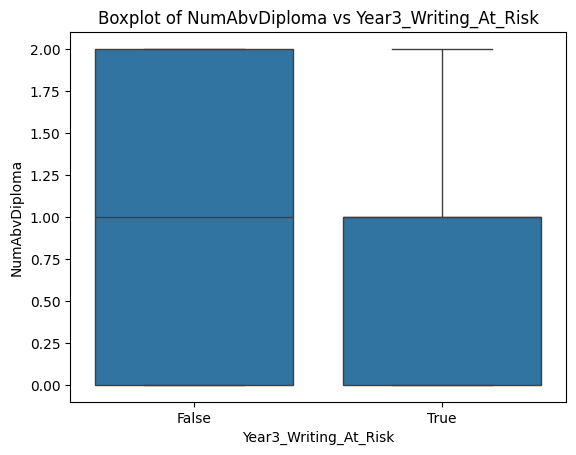

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  0.0  1.0  2.0  2.0
True                   0.0  0.0  1.0  1.0  2.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


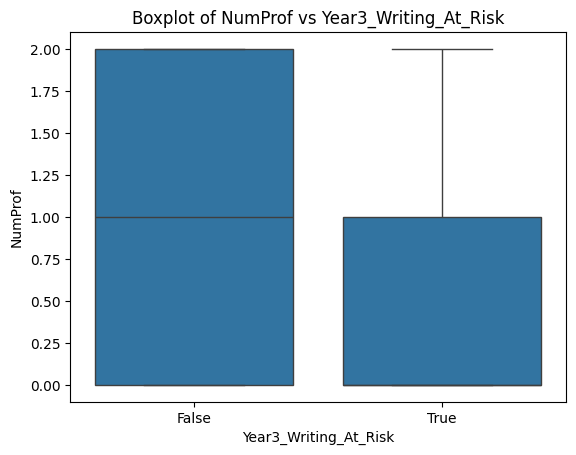

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  0.0  1.0  2.0  2.0
True                   0.0  0.0  0.0  1.0  2.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


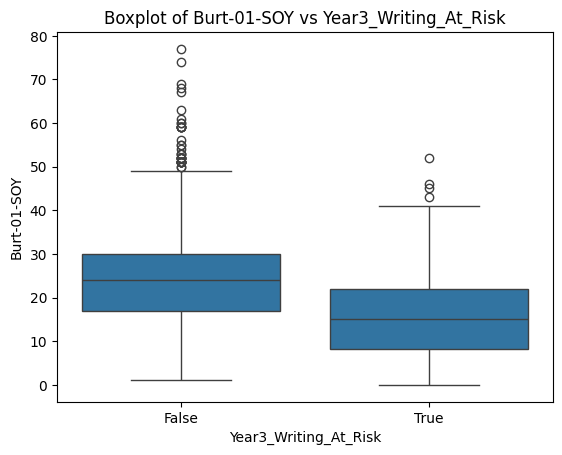

                       min    25%   50%   75%   max
Year3_Writing_At_Risk                              
False                  1.0  17.00  24.0  30.0  77.0
True                   0.0   8.25  15.0  22.0  52.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


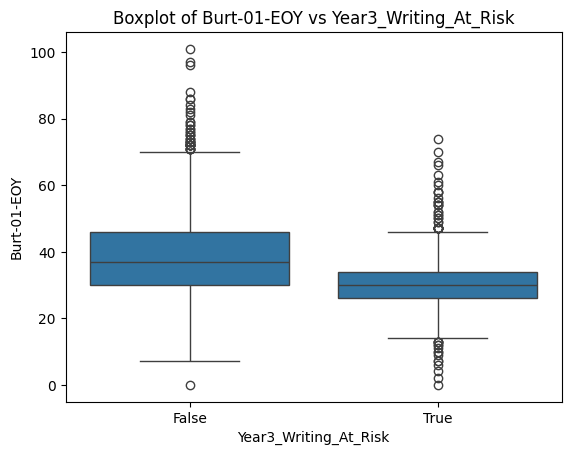

                       min   25%   50%   75%    max
Year3_Writing_At_Risk                              
False                  0.0  30.0  37.0  46.0  101.0
True                   0.0  26.0  30.0  34.0   74.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


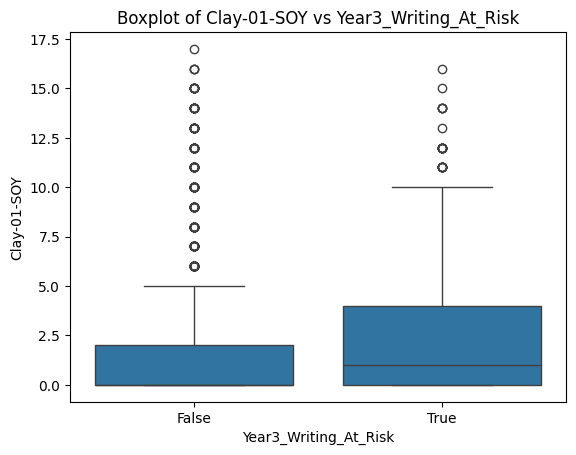

                       min  25%  50%  75%   max
Year3_Writing_At_Risk                          
False                  0.0  0.0  0.0  2.0  17.0
True                   0.0  0.0  1.0  4.0  16.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


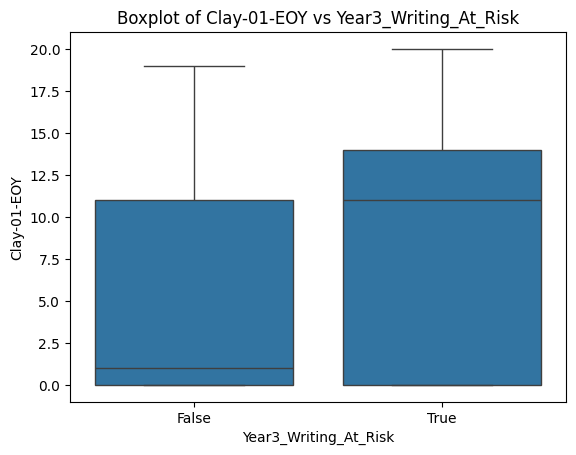

                       min  25%   50%   75%   max
Year3_Writing_At_Risk                            
False                  0.0  0.0   1.0  11.0  19.0
True                   0.0  0.0  11.0  14.0  20.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


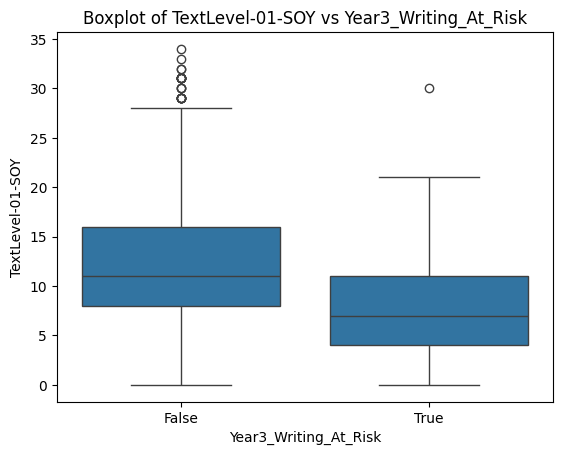

                       min  25%   50%   75%   max
Year3_Writing_At_Risk                            
False                  0.0  8.0  11.0  16.0  34.0
True                   0.0  4.0   7.0  11.0  30.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


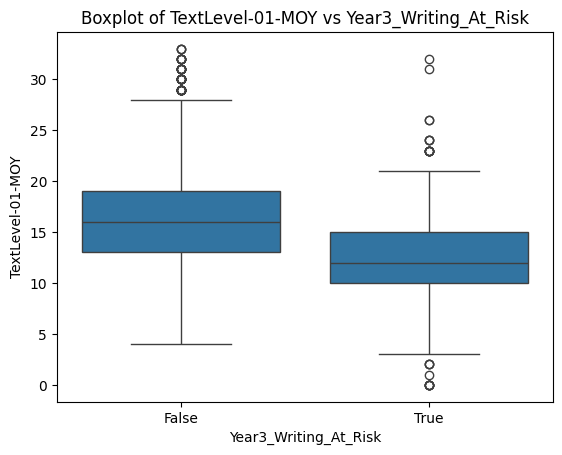

                       min   25%   50%   75%   max
Year3_Writing_At_Risk                             
False                  4.0  13.0  16.0  19.0  33.0
True                   0.0  10.0  12.0  15.0  32.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


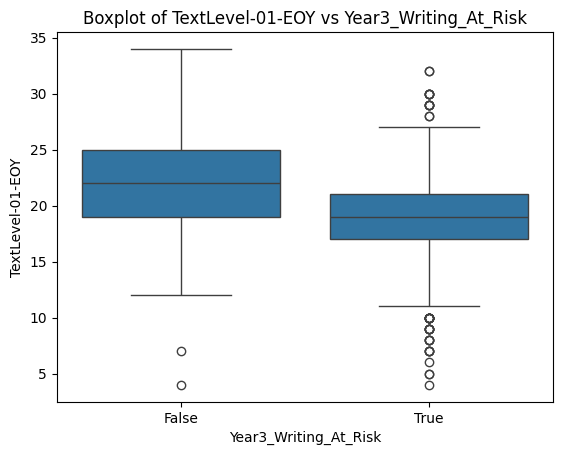

                       min   25%   50%   75%   max
Year3_Writing_At_Risk                             
False                  4.0  19.0  22.0  25.0  34.0
True                   4.0  17.0  19.0  21.0  32.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


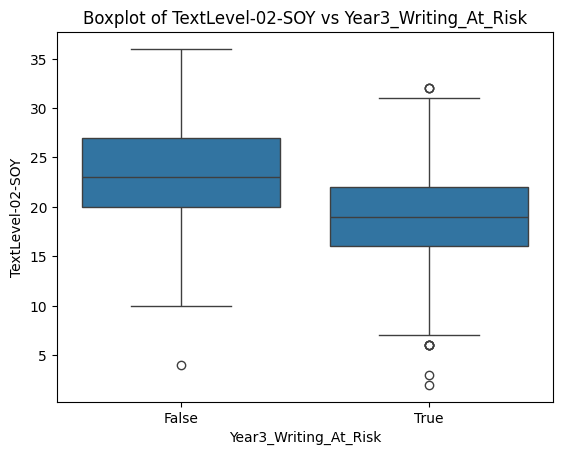

                       min   25%   50%   75%   max
Year3_Writing_At_Risk                             
False                  4.0  20.0  23.0  27.0  36.0
True                   2.0  16.0  19.0  22.0  32.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


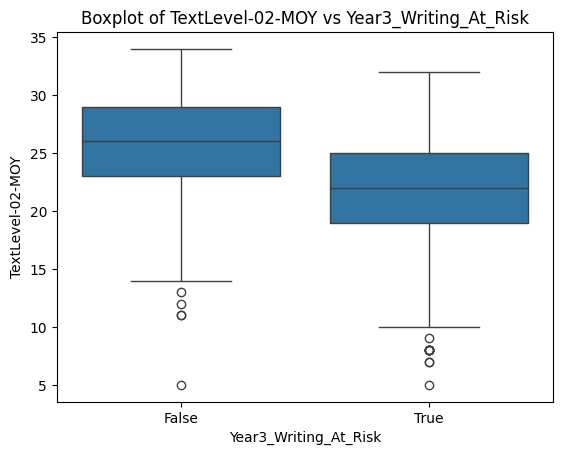

                       min   25%   50%   75%   max
Year3_Writing_At_Risk                             
False                  5.0  23.0  26.0  29.0  34.0
True                   5.0  19.0  22.0  25.0  32.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


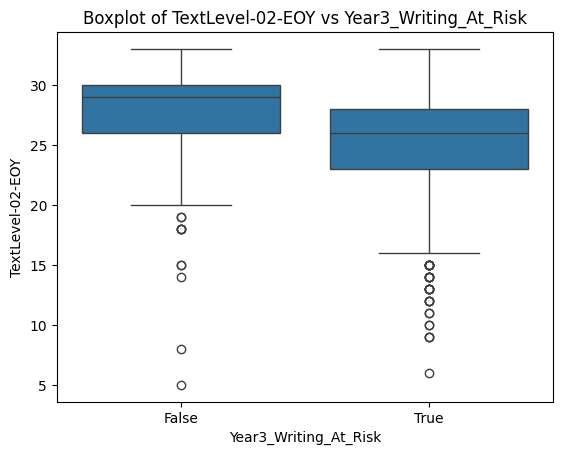

                       min   25%   50%   75%   max
Year3_Writing_At_Risk                             
False                  5.0  26.0  29.0  30.0  33.0
True                   6.0  23.0  26.0  28.0  33.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


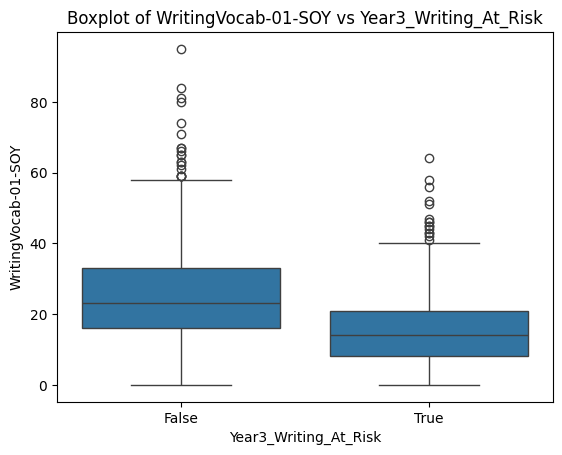

                       min   25%   50%   75%   max
Year3_Writing_At_Risk                             
False                  0.0  16.0  23.0  33.0  95.0
True                   0.0   8.0  14.0  21.0  64.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


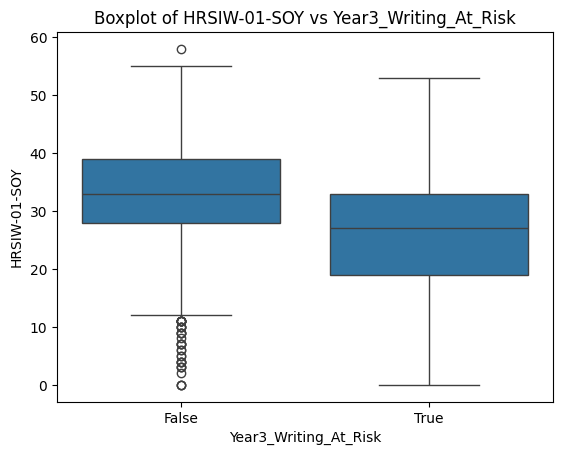

                       min   25%   50%   75%   max
Year3_Writing_At_Risk                             
False                  0.0  28.0  33.0  39.0  58.0
True                   0.0  19.0  27.0  33.0  53.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


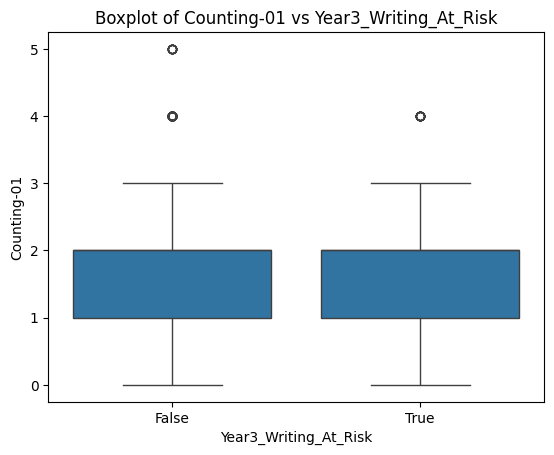

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  1.0  2.0  2.0  5.0
True                   0.0  1.0  2.0  2.0  4.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


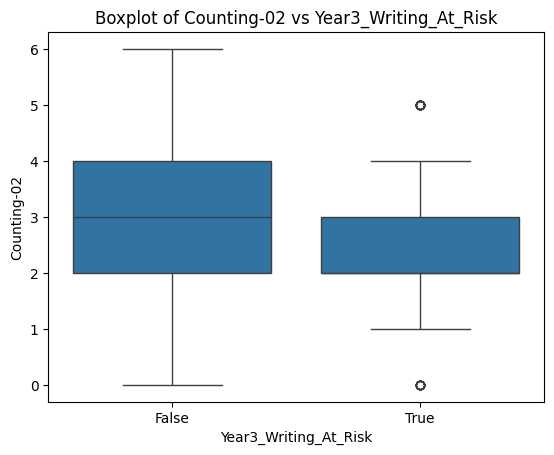

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  2.0  3.0  4.0  6.0
True                   0.0  2.0  2.0  3.0  5.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


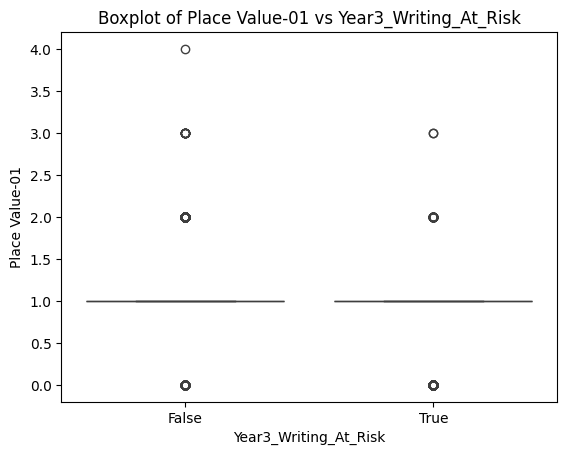

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  1.0  1.0  1.0  4.0
True                   0.0  1.0  1.0  1.0  3.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


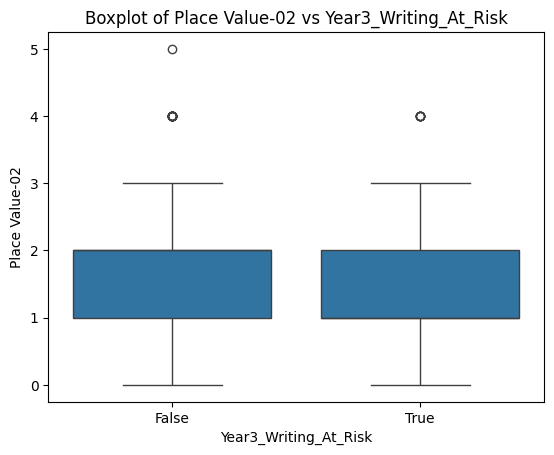

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  1.0  2.0  2.0  5.0
True                   0.0  1.0  1.0  2.0  4.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


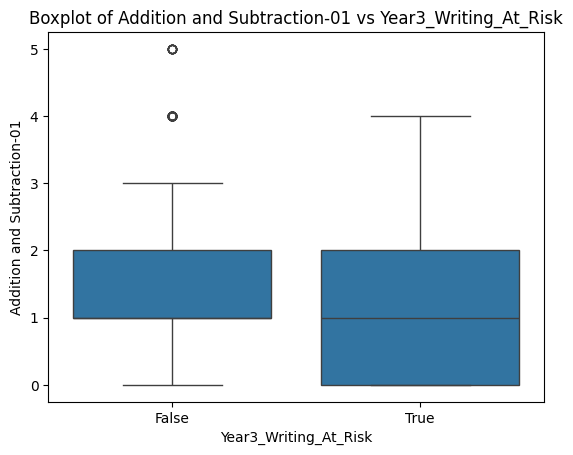

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  1.0  1.0  2.0  5.0
True                   0.0  0.0  1.0  2.0  4.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


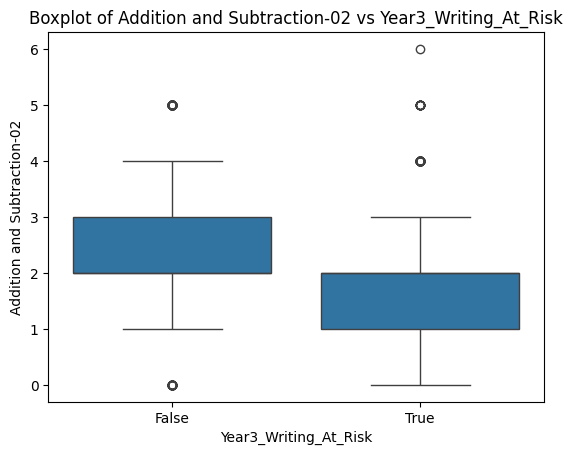

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  2.0  2.0  3.0  5.0
True                   0.0  1.0  2.0  2.0  6.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


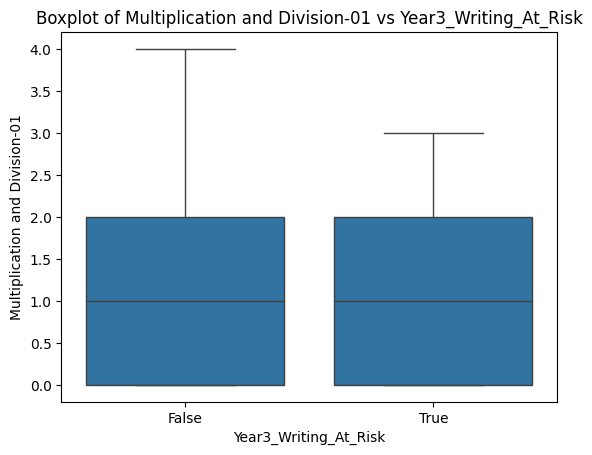

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  0.0  1.0  2.0  4.0
True                   0.0  0.0  1.0  2.0  3.0


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


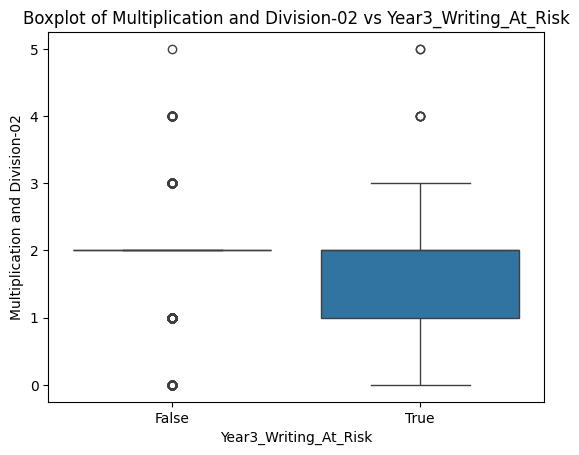

                       min  25%  50%  75%  max
Year3_Writing_At_Risk                         
False                  0.0  2.0  2.0  2.0  5.0
True                   0.0  1.0  2.0  2.0  5.0


In [ ]:
for variable in numerical_variables:
    sns.boxplot(data=records, x='Year3_Writing_At_Risk', y=variable)
    plt.title(f"Boxplot of {variable} vs Year3_Writing_At_Risk")
    plt.show()
    print(records.groupby('Year3_Writing_At_Risk')[variable].describe()[['min', '25%', '50%', '75%', 'max']])

###### Histograms of Numerical variables vs Target variable

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


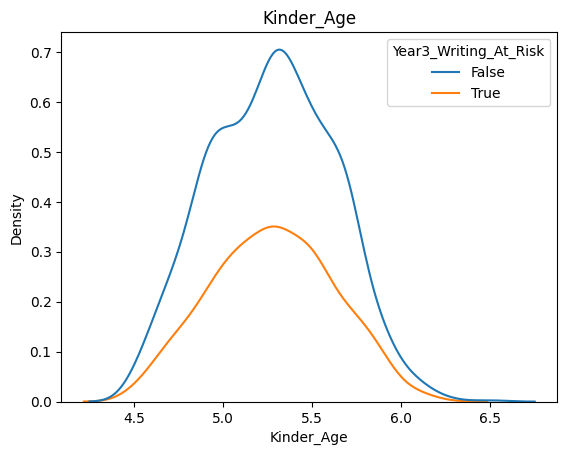

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


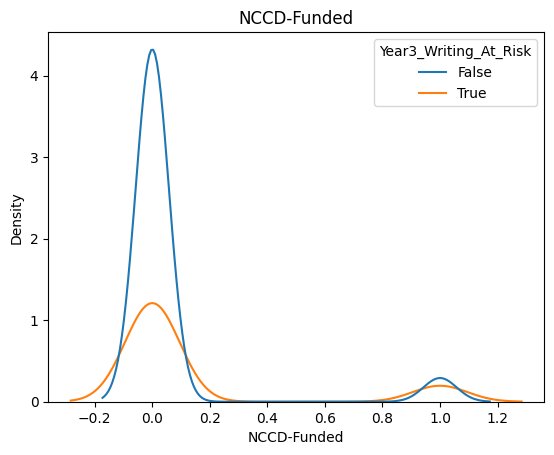

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


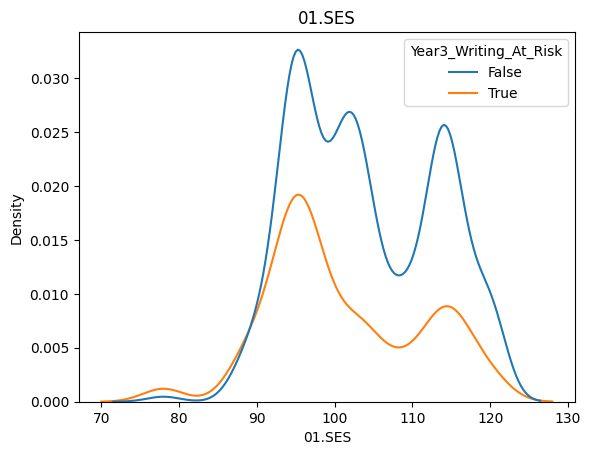

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


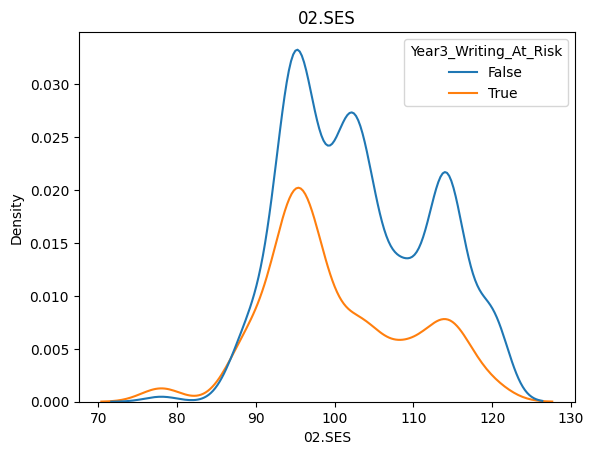

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


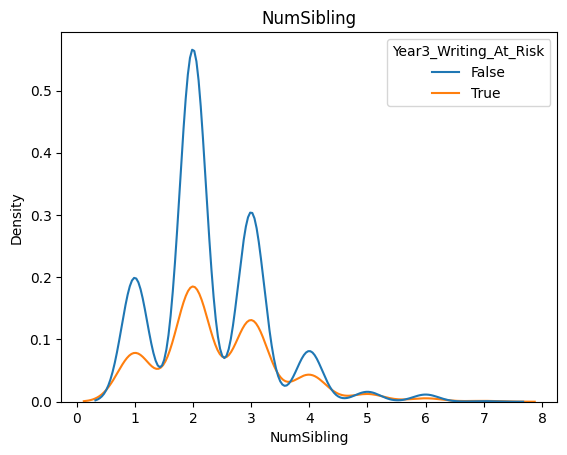

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


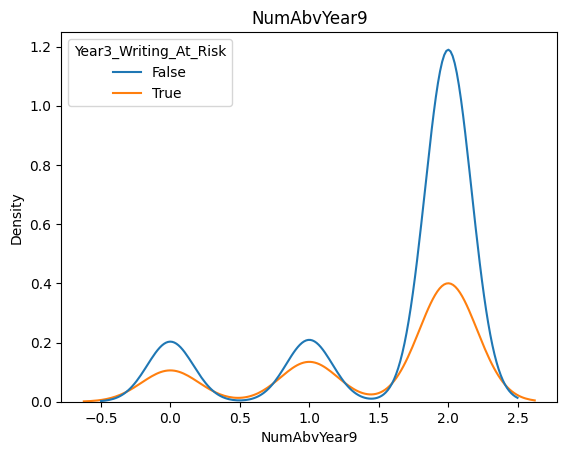

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


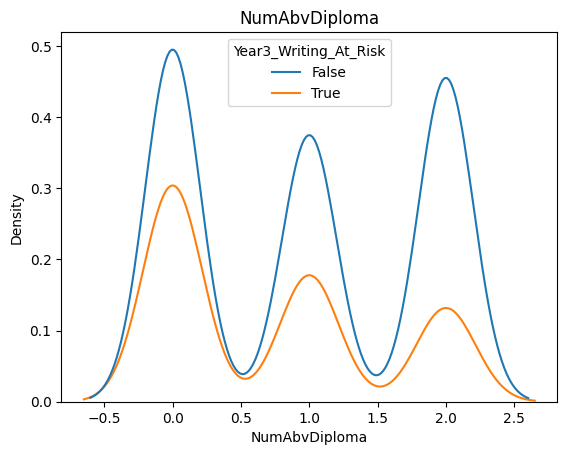

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


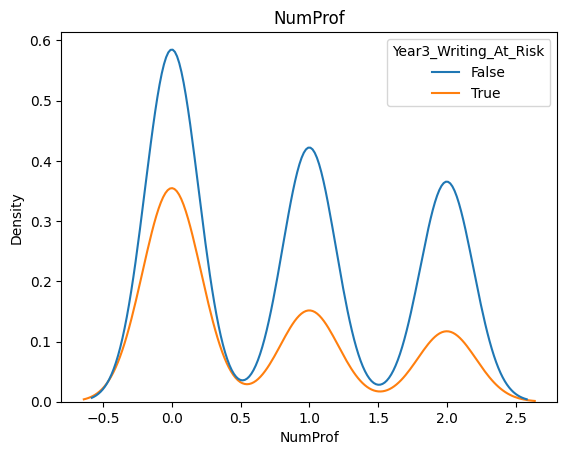

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


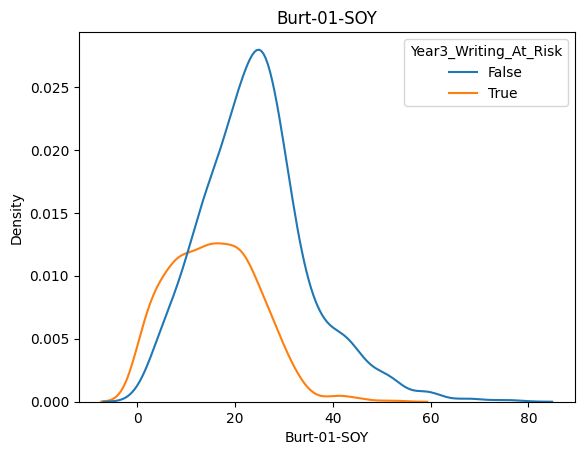

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


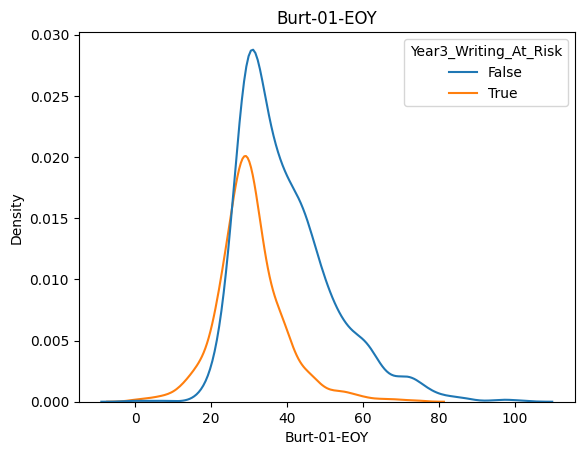

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


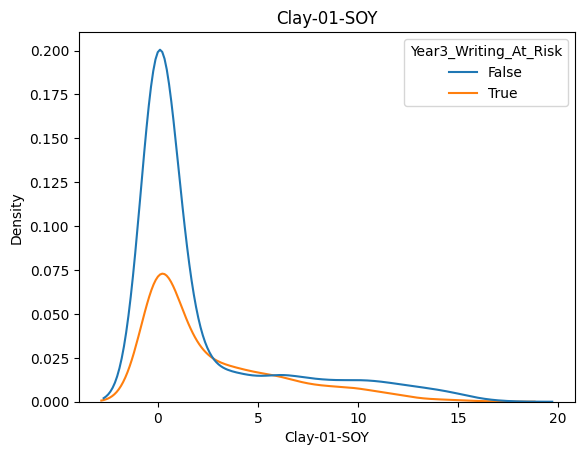

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


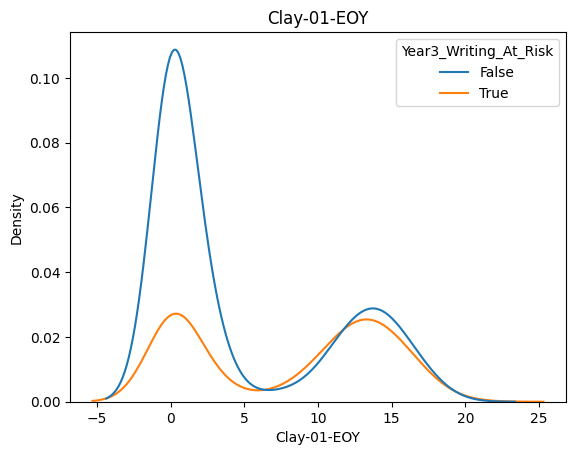

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


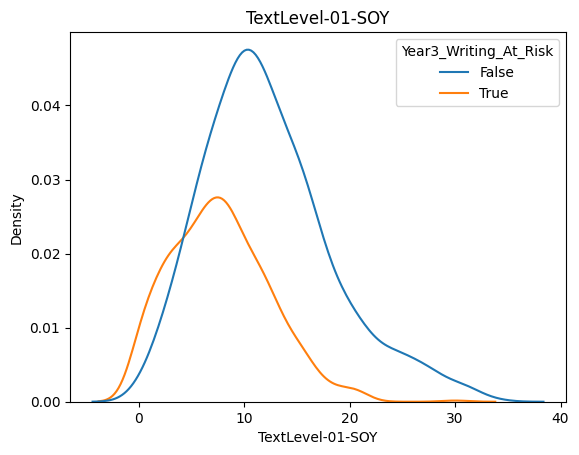

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


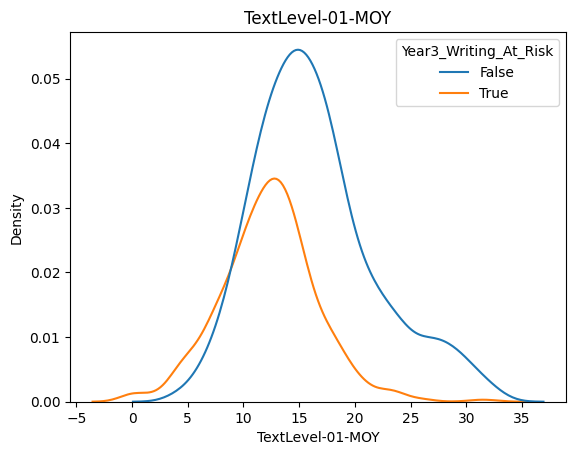

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


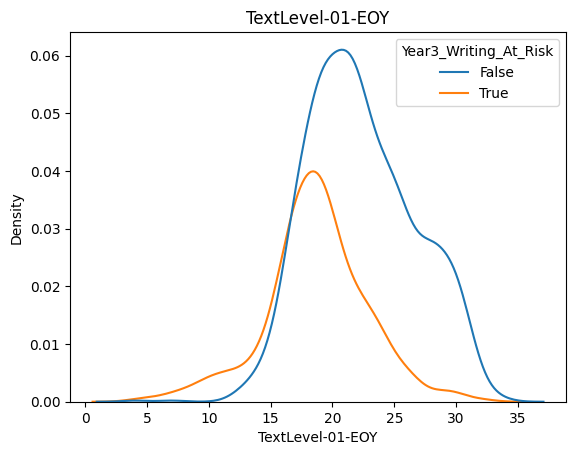

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


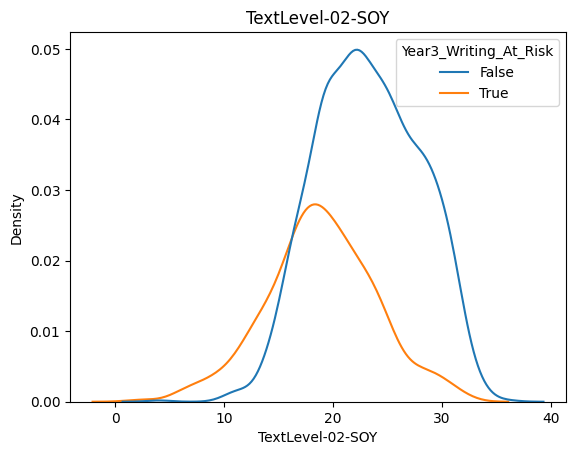

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


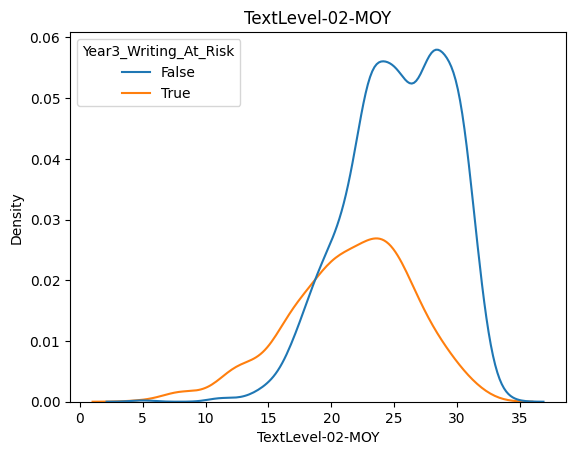

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


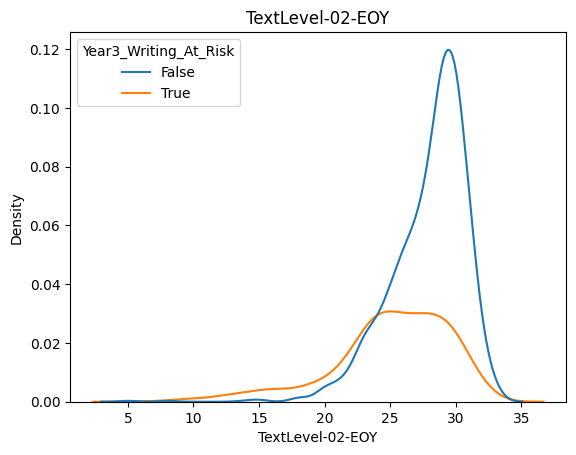

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


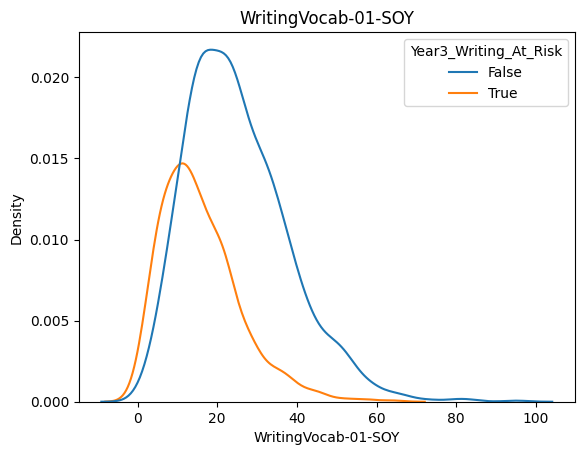

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


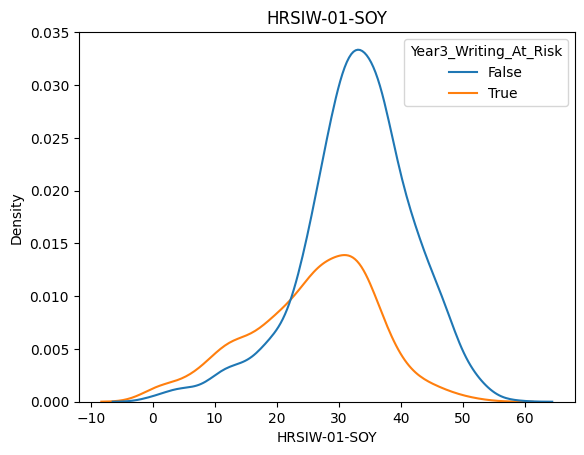

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


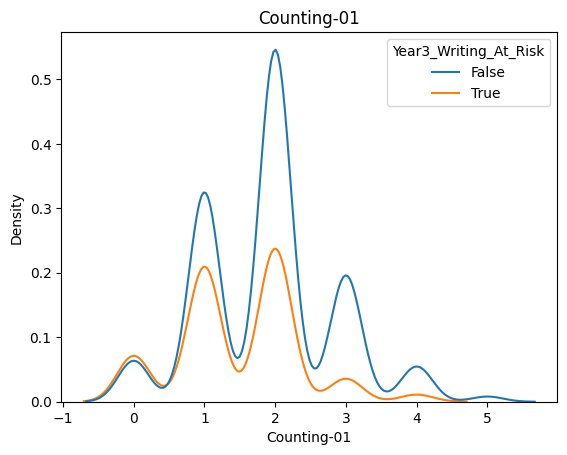

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


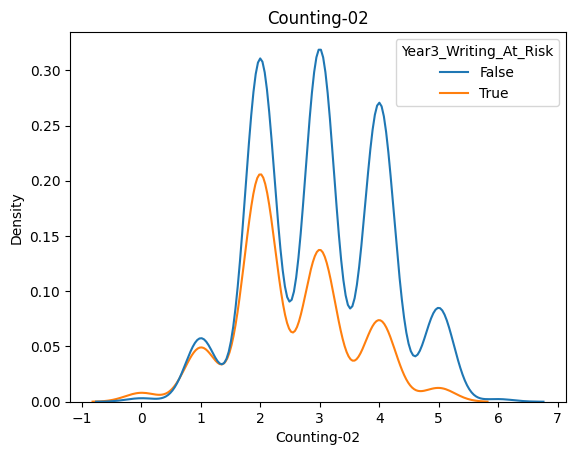

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


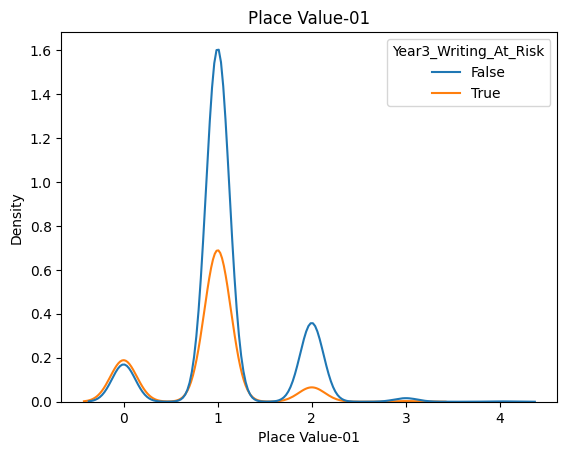

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


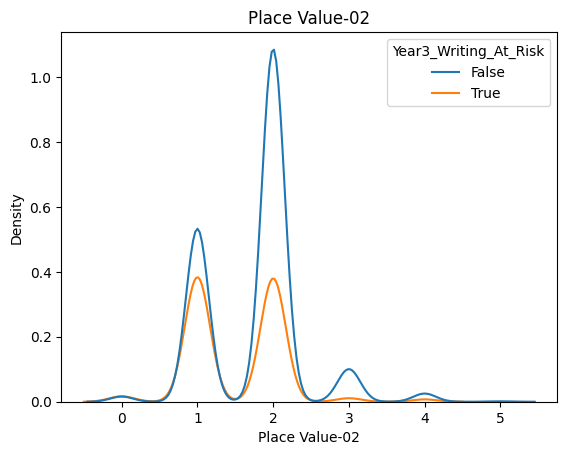

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


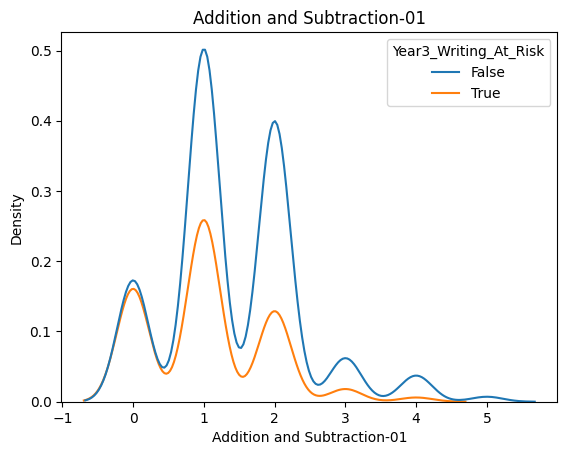

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


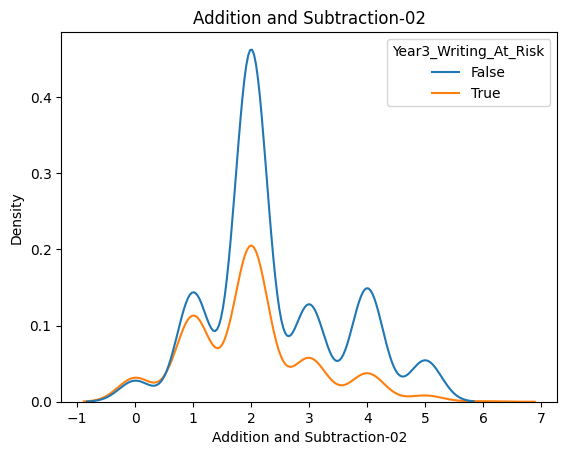

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


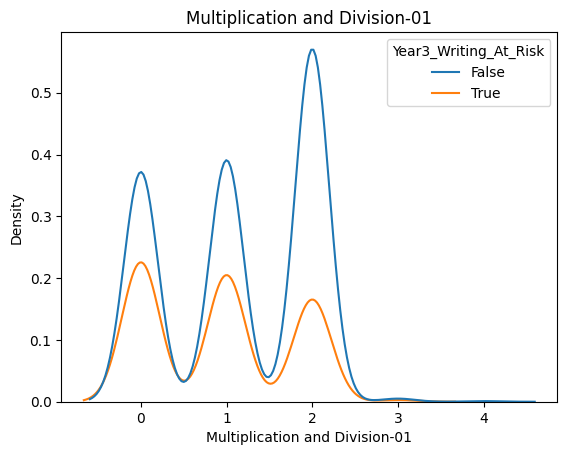

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


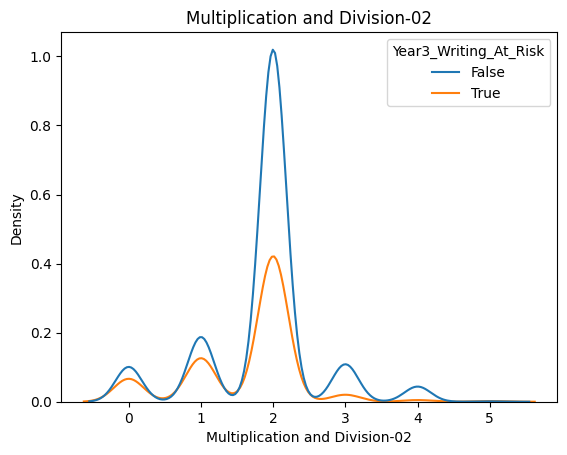

In [ ]:
for variable in numerical_variables:
    sns.kdeplot(data=records, x=variable, hue = 'Year3_Writing_At_Risk', legend=True)
    plt.title(f"{variable}")
    plt.show()

###### Regression Plots of Numerical variables vs Target variable

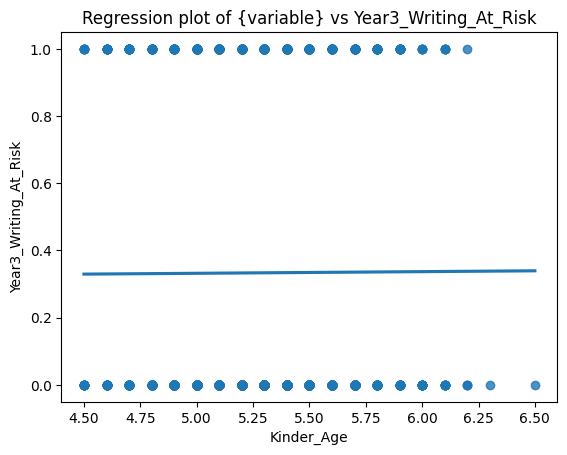

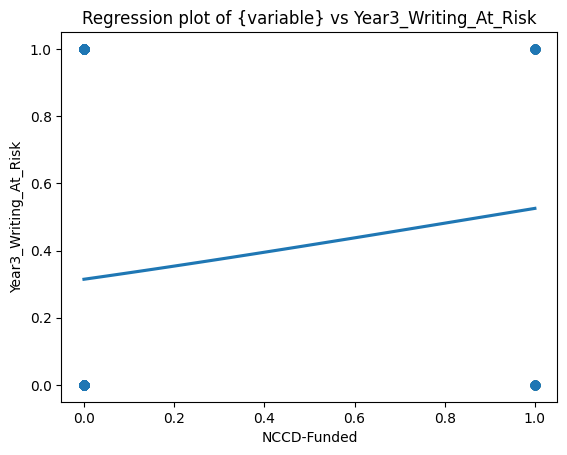

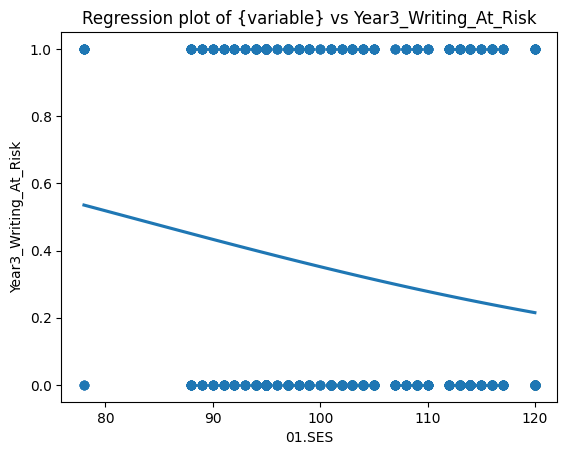

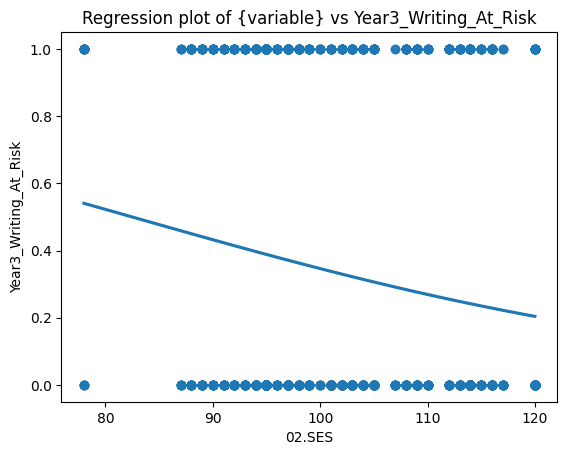

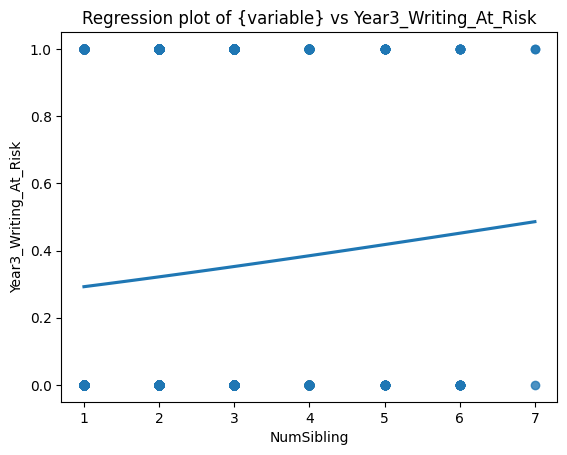

...

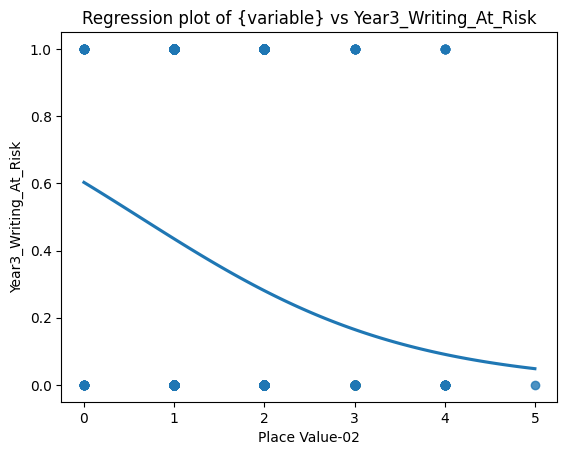

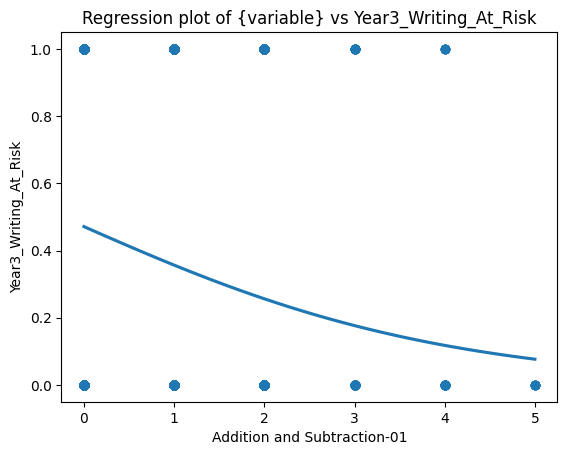

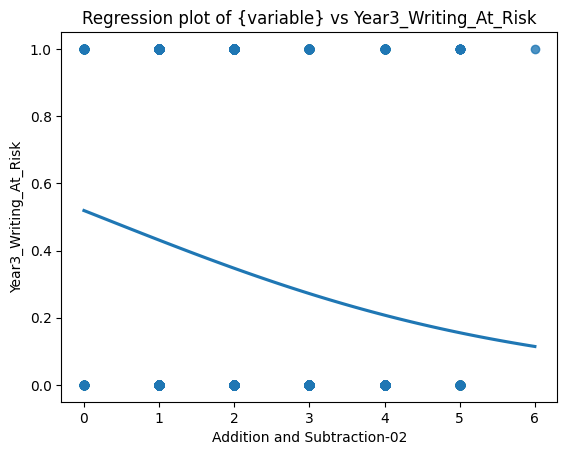

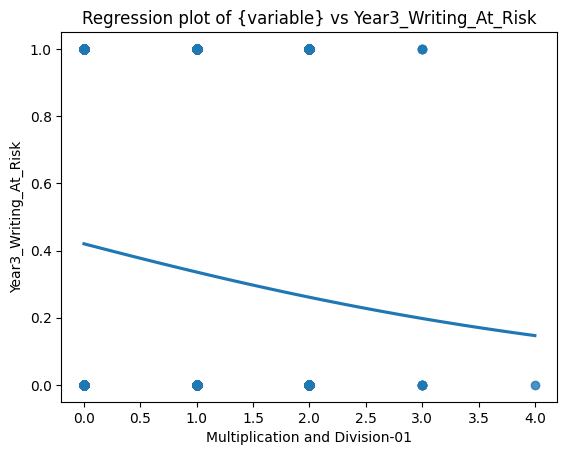

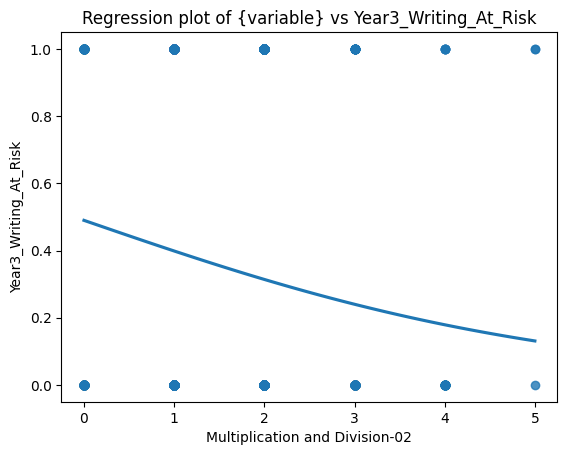

In [ ]:
for variable in numerical_variables:
    sns.regplot(data=records, x=variable, y=records['Year3_Writing_At_Risk'], logistic=True, ci=None)
    plt.title('Regression plot of {variable} vs Year3_Writing_At_Risk')
    plt.show()

#### 1.3.3. Multivariate Analysis

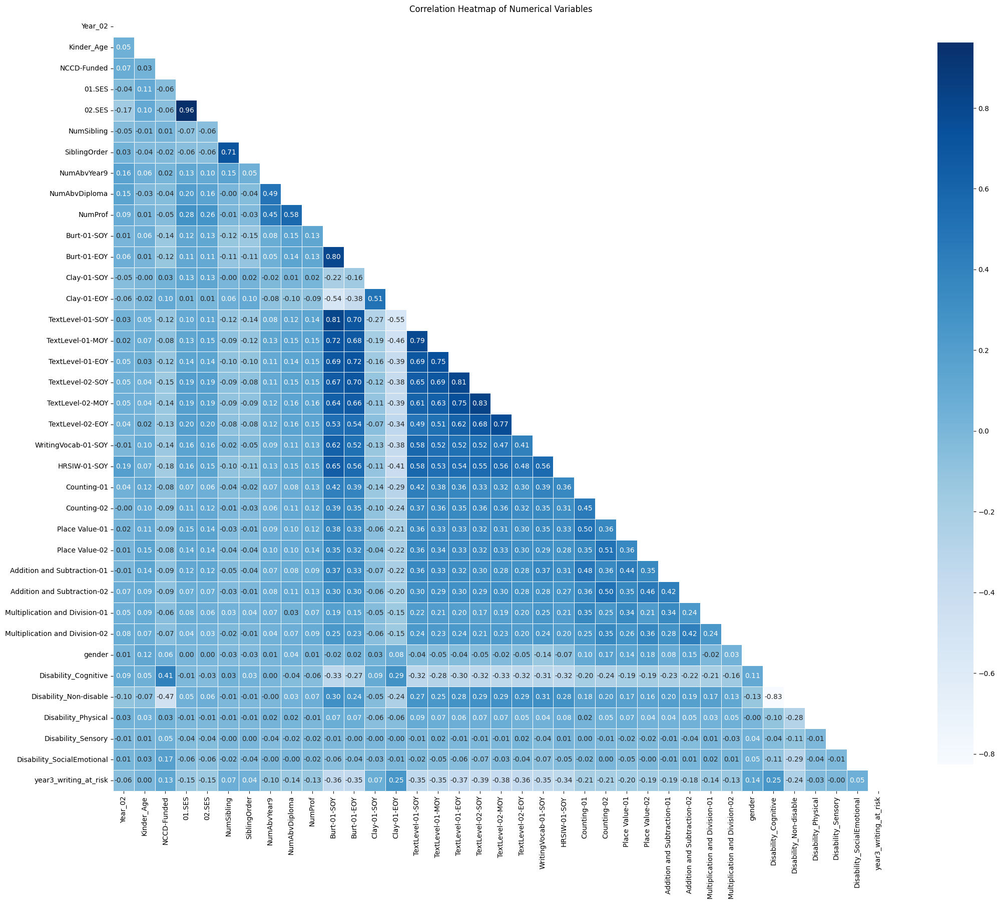

In [ ]:
# Select numerical variables
num_variables = records.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Calculate the correlation matrix for numerical variables
corr_matrix = records[num_variables].corr()

# Ensure 'Year3_Writing_At_Risk' is the exact case as in your data
if 'year3_writing_at_risk' in corr_matrix.columns:
    # Get all columns except 'Year3_Writing_At_Risk'
    columns = [col for col in corr_matrix.columns if col != 'year3_writing_at_risk']
    # Append 'Year3_Writing_At_Risk' at the end
    columns.append('year3_writing_at_risk')

    # Reorder the correlation matrix
    corr_matrix = corr_matrix[columns].loc[columns]

# Create a mask for the upper triangle of the correlation matrix
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Create the heatmap
plt.figure(figsize=(25, 25))
sns.heatmap(corr_matrix,
            mask=mask,
            square=True,
            cmap='Blues',
            annot=True,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": 0.75})

# Display the plot
plt.title('Correlation Heatmap of Numerical Variables')
plt.show()


## 2. Data2Intel's Main Concern

### 2.1. SES Background

In [ ]:
records[['01.SES', '02.SES']].describe()

,01.SES,02.SES
count,1999.000000,1999.000000
mean,102.941471,102.117059
std,9.388249,9.152435
min,78.000000,78.000000
25%,95.000000,95.000000
50%,101.000000,101.000000
75%,113.000000,109.000000
max,120.000000,120.000000


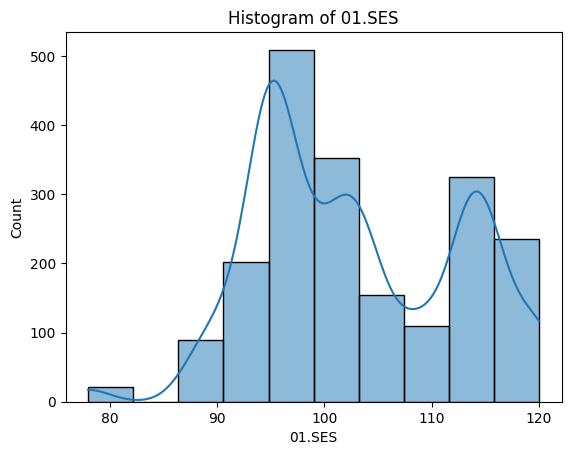

In [ ]:
#Histogram for 01.SES
sns.histplot(data=records['01.SES'], kde=True, bins=10)
plt.title(f"Histogram of 01.SES")
plt.show()

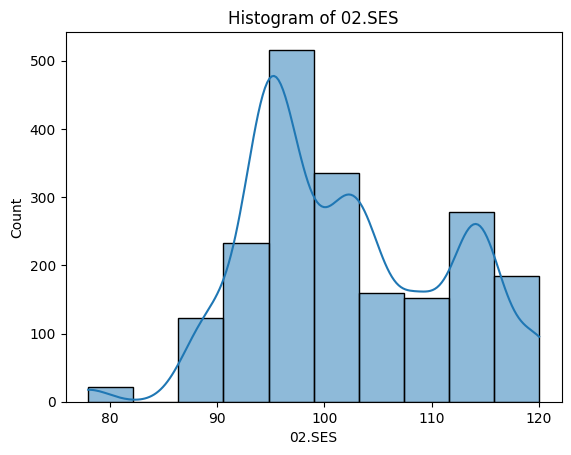

In [ ]:
#Histogram for 02.SES
sns.histplot(data=records['02.SES'], kde=True, bins=10)
plt.title(f"Histogram of 02.SES")
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

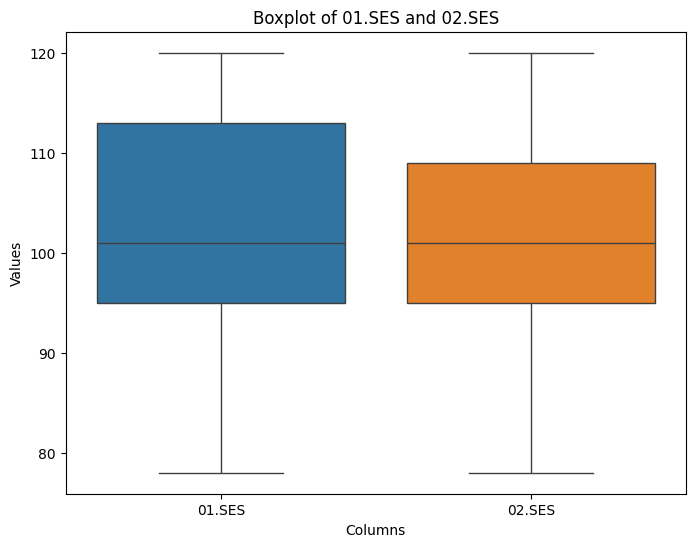

In [ ]:
# Create a DataFrame with just the two columns
data = records[['01.SES', '02.SES']]

# Draw the box plot for both columns in one frame
plt.figure(figsize=(8, 6))
sns.boxplot(data=data)

# Set the title and labels
plt.title('Boxplot of 01.SES and 02.SES')
plt.xlabel('Columns')
plt.ylabel('Values')

# Display the plot
plt.show()

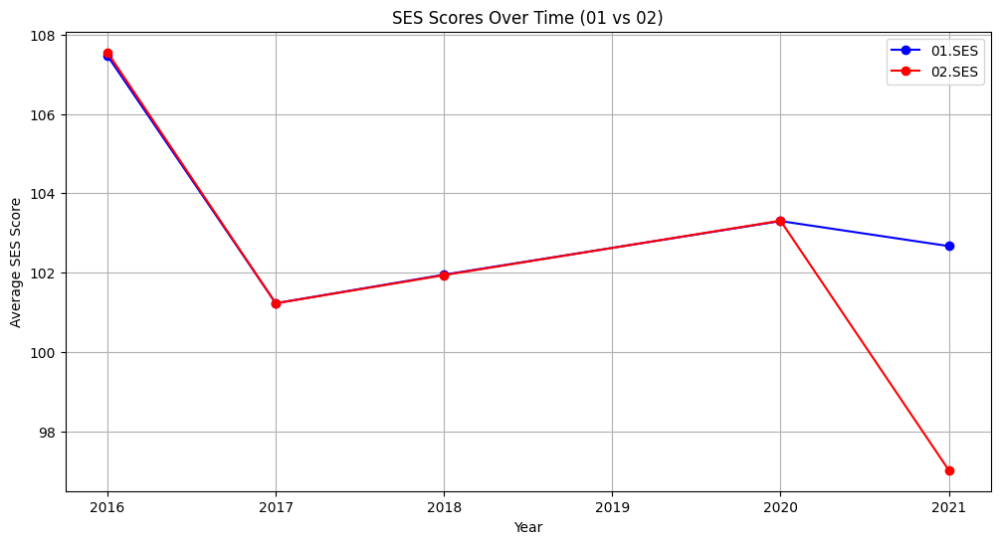

In [ ]:
# Group by 'Year_02' and calculate the mean for '01.SES' and '02.SES' for each year
SES_over_time = records.groupby('Year_02')[['01.SES', '02.SES']].mean()

# Create a line chart for both 01.SES and 02.SES over time
plt.figure(figsize=(12, 6))

# Plot 01.SES
plt.plot(SES_over_time.index, SES_over_time['01.SES'], marker='o', linestyle='-', color='b', label='01.SES')

# Plot 02.SES
plt.plot(SES_over_time.index, SES_over_time['02.SES'], marker='o', linestyle='-', color='r', label='02.SES')

# Add title and labels
plt.title('SES Scores Over Time (01 vs 02)')
plt.xlabel('Year')
plt.ylabel('Average SES Score')

# Add legend to distinguish between 01 and 02
plt.legend()

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


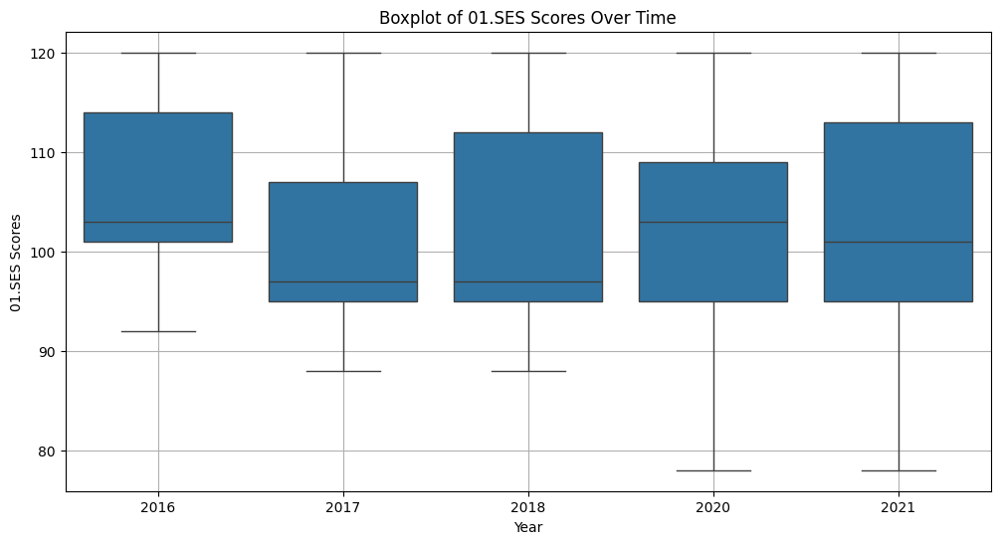

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


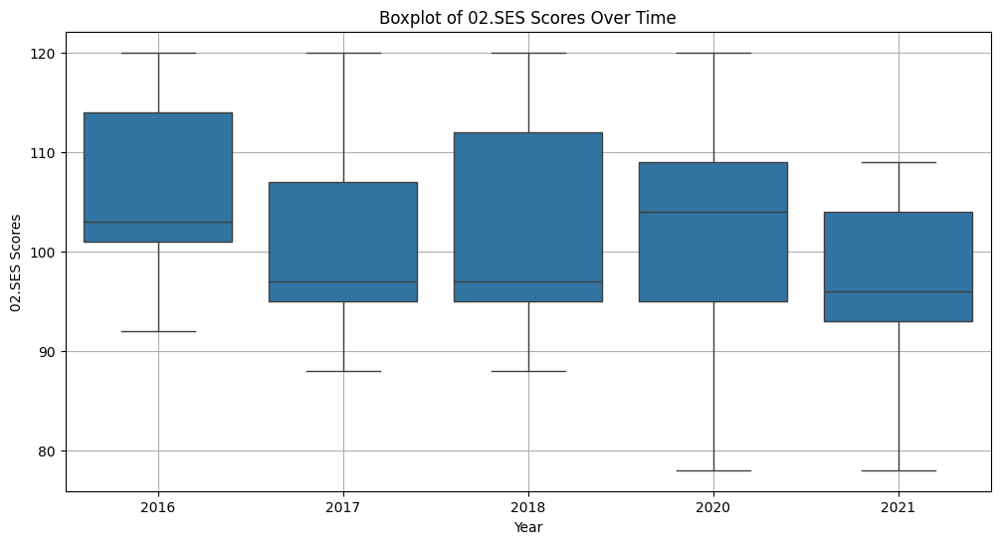

In [ ]:
# Create a DataFrame with the relevant columns for 01.SES and 02.SES
ses_data = records[['01.SES', '02.SES', 'Year_02']]

# Melt the DataFrame to have 'SES' (01.SES, 02.SES), 'Value' (SES scores), and 'Year_02'
ses_data_melted = pd.melt(ses_data, id_vars='Year_02', var_name='SES_Type', value_name='Value')

# Rename '01.SES' and '02.SES' for clarity
ses_data_melted['SES_Type'] = ses_data_melted['SES_Type'].replace({
    '01.SES': 'SES_Year_1',
    '02.SES': 'SES_Year_2'
})

# Filter the data for SES_Year_1 and SES_Year_2
ses_year1_data = ses_data_melted[ses_data_melted['SES_Type'] == 'SES_Year_1']
ses_year2_data = ses_data_melted[ses_data_melted['SES_Type'] == 'SES_Year_2']

# Create the box plot for 01.SES over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=ses_year1_data)
plt.title('Boxplot of 01.SES Scores Over Time')
plt.xlabel('Year')
plt.ylabel('01.SES Scores')
plt.grid(True)
plt.show()

# Create the box plot for 02.SES over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=ses_year2_data)
plt.title('Boxplot of 02.SES Scores Over Time')
plt.xlabel('Year')
plt.ylabel('02.SES Scores')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

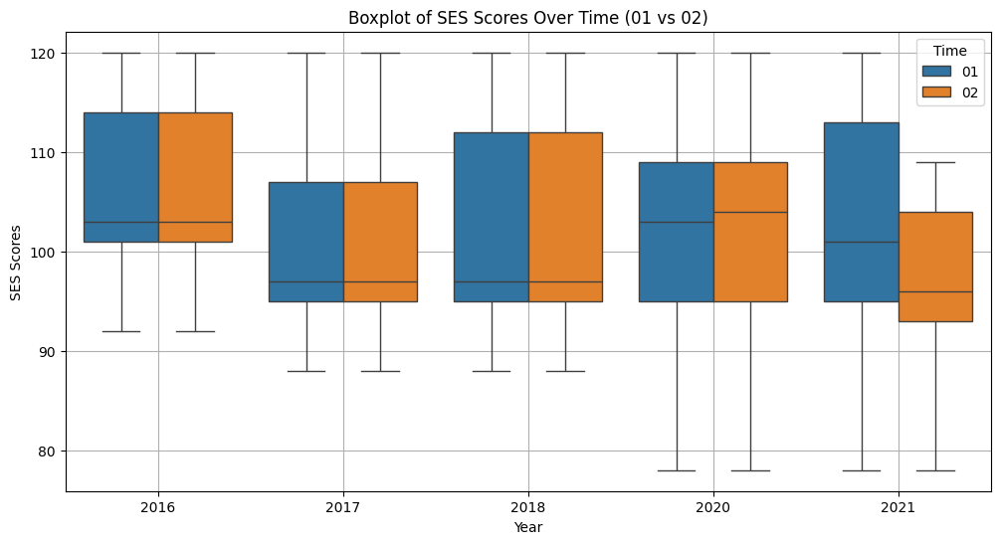

In [ ]:
# Create a DataFrame with the relevant columns for Burt
SES_01_data = records[['01.SES', '02.SES', 'Year_02']]

# Melt the DataFrame to have 'Time' (01, 02), 'Value' (SES scores), and 'Year_02'
SES_01_data_melted = pd.melt(SES_01_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename '01.SES' and '02.SES' for clarity
SES_01_data_melted['Time'] = SES_01_data_melted['Time'].replace({
    '01.SES': '01',
    '02.SES': '02'
})

# Draw the box plot for SES scores with 'Year_02' on the x-axis and 'Value' on the y-axis, with 'Time' as the hue
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', hue='Time', data=SES_01_data_melted)

# Add title and labels
plt.title('Boxplot of SES Scores Over Time (01 vs 02)')
plt.xlabel('Year')
plt.ylabel('SES Scores')

# Add legend to distinguish between 01 and 02
plt.legend(title='Time')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

### 2.2. Students' Reading Skills

In [ ]:
records[['Burt-01-SOY', 'Burt-01-EOY']].describe()

,Burt-01-SOY,Burt-01-EOY
count,1999.000000,1999.000000
mean,21.387194,36.579290
std,11.179541,12.261318
min,0.000000,0.000000
25%,14.000000,29.000000
50%,21.000000,33.000000
75%,28.000000,43.000000
max,77.000000,101.000000


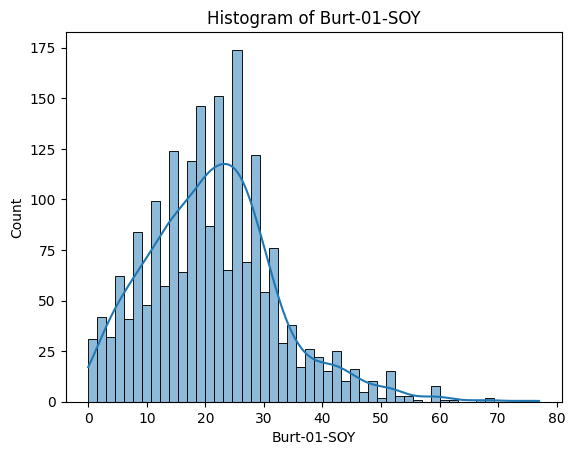

In [ ]:
#Histogram for Burt-01-SOY
sns.histplot(data=records['Burt-01-SOY'], kde=True, bins=50)
plt.title(f"Histogram of Burt-01-SOY")
plt.show()

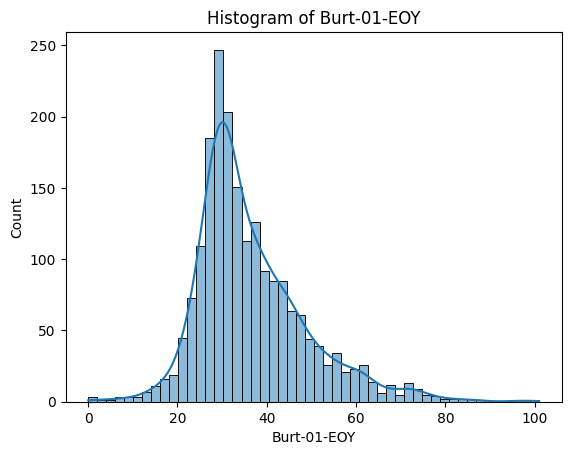

In [ ]:
#Histogram for Burt-01-EOY
sns.histplot(data=records['Burt-01-EOY'], kde=True, bins=50)
plt.title(f"Histogram of Burt-01-EOY")
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

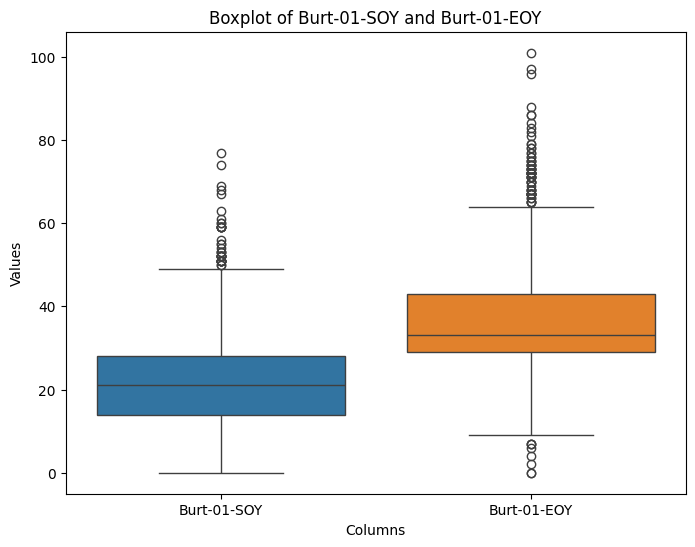

In [ ]:
# Create a DataFrame with just the two columns 'Burt-01-SOY' and 'Burt-01-EOY'
burt_data = records[['Burt-01-SOY', 'Burt-01-EOY']]

# Draw the box plot for both columns in one frame
plt.figure(figsize=(8, 6))
sns.boxplot(data=burt_data)

# Set the title and labels
plt.title('Boxplot of Burt-01-SOY and Burt-01-EOY')
plt.xlabel('Columns')
plt.ylabel('Values')

# Display the plot
plt.show()

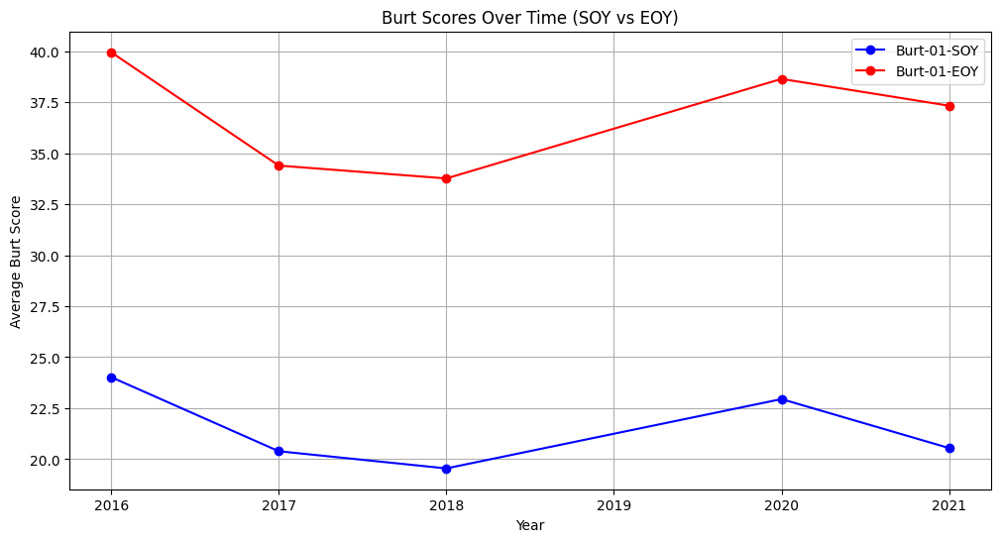

In [ ]:
# Group by 'Year_02' and calculate the mean for 'Burt-01-SOY' and 'Burt-01-EOY' for each year
burt_over_time = records.groupby('Year_02')[['Burt-01-SOY', 'Burt-01-EOY']].mean()

# Create a line chart for both Burt-01-SOY and Burt-01-EOY over time
plt.figure(figsize=(12, 6))

# Plot Burt-01-SOY
plt.plot(burt_over_time.index, burt_over_time['Burt-01-SOY'], marker='o', linestyle='-', color='b', label='Burt-01-SOY')

# Plot Burt-01-EOY
plt.plot(burt_over_time.index, burt_over_time['Burt-01-EOY'], marker='o', linestyle='-', color='r', label='Burt-01-EOY')

# Add title and labels
plt.title('Burt Scores Over Time (SOY vs EOY)')
plt.xlabel('Year')
plt.ylabel('Average Burt Score')

# Add legend to distinguish between SOY and EOY
plt.legend()

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


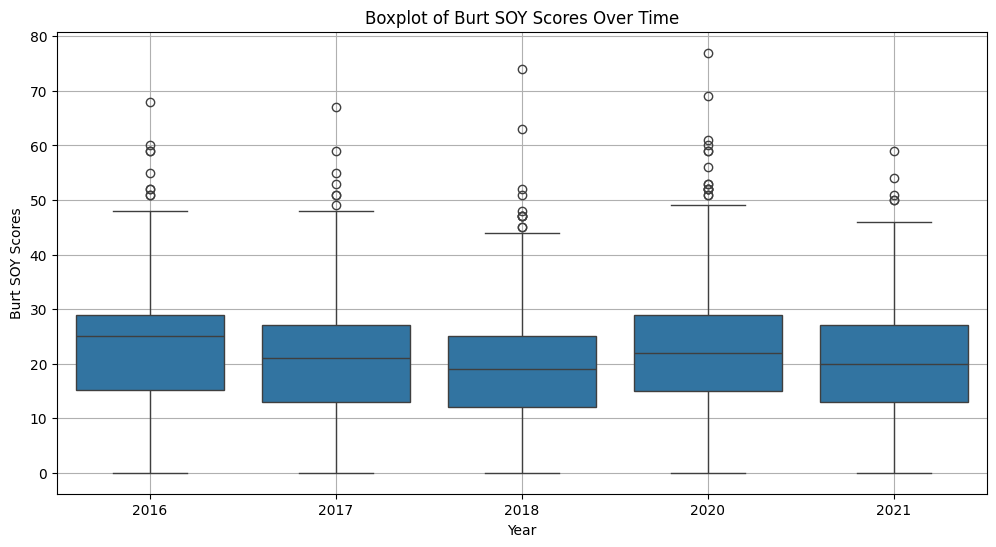

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


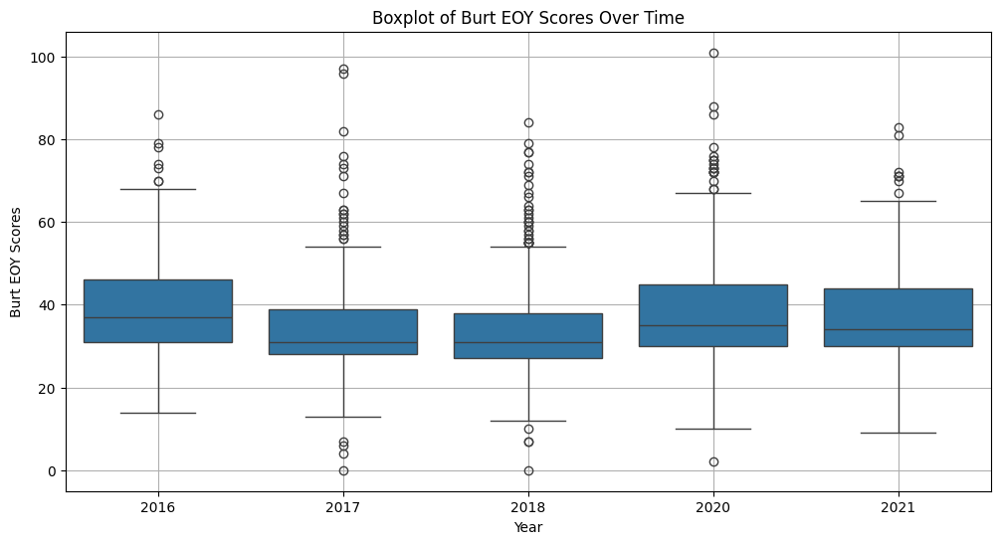

In [ ]:
# Create a DataFrame with the relevant columns for Burt
burt_01_data = records[['Burt-01-SOY', 'Burt-01-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, EOY), 'Value' (Burt scores), and 'Year_02'
burt_01_data_melted = pd.melt(burt_01_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'Burt-01-SOY' and 'Burt-01-EOY' for clarity
burt_01_data_melted['Time'] = burt_01_data_melted['Time'].replace({
    'Burt-01-SOY': 'SOY',
    'Burt-01-EOY': 'EOY'
})

# Filter the data for SOY and EOY
soy_burt_data = burt_01_data_melted[burt_01_data_melted['Time'] == 'SOY']
eoy_burt_data = burt_01_data_melted[burt_01_data_melted['Time'] == 'EOY']

# Create the box plot for SOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=soy_burt_data)
plt.title('Boxplot of Burt SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Burt SOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for EOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=eoy_burt_data)
plt.title('Boxplot of Burt EOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Burt EOY Scores')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

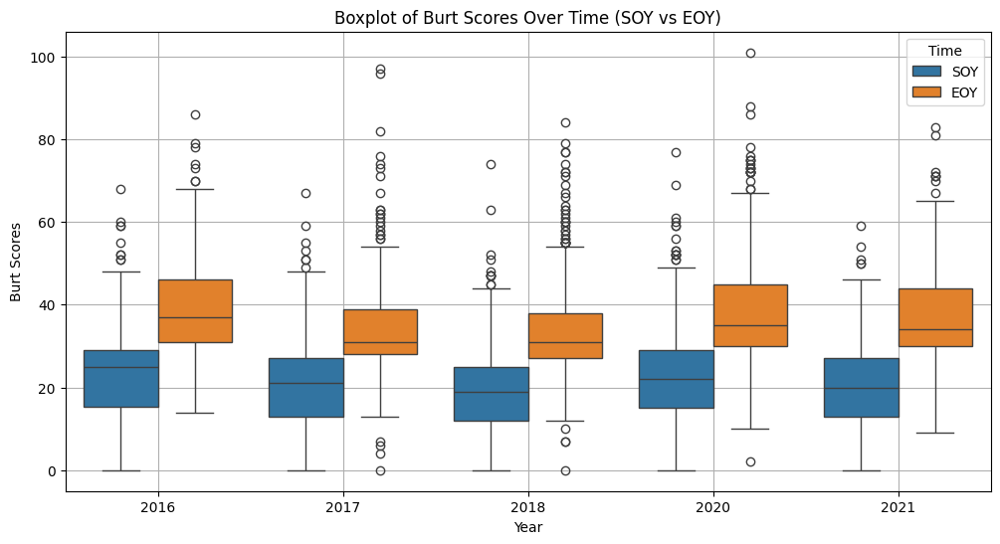

In [ ]:
# Create a DataFrame with the relevant columns for Burt
burt_01_data = records[['Burt-01-SOY', 'Burt-01-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, EOY), 'Value' (Burt scores), and 'Year_02'
burt_01_data_melted = pd.melt(burt_01_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'Burt-01-SOY' and 'Burt-01-EOY' for clarity
burt_01_data_melted['Time'] = burt_01_data_melted['Time'].replace({
    'Burt-01-SOY': 'SOY',
    'Burt-01-EOY': 'EOY'
})

# Draw the box plot for Burt scores with 'Year_02' on the x-axis and 'Value' on the y-axis, with 'Time' as the hue
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', hue='Time', data=burt_01_data_melted)

# Add title and labels
plt.title('Boxplot of Burt Scores Over Time (SOY vs EOY)')
plt.xlabel('Year')
plt.ylabel('Burt Scores')

# Add legend to distinguish between SOY and EOY
plt.legend(title='Time')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()


In [ ]:
records[['Clay-01-SOY', 'Clay-01-EOY']].describe()

,Clay-01-SOY,Clay-01-EOY
count,1999.000000,1999.000000
mean,2.300650,5.662331
std,3.699979,6.475297
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,2.000000
75%,3.000000,13.000000
max,17.000000,20.000000


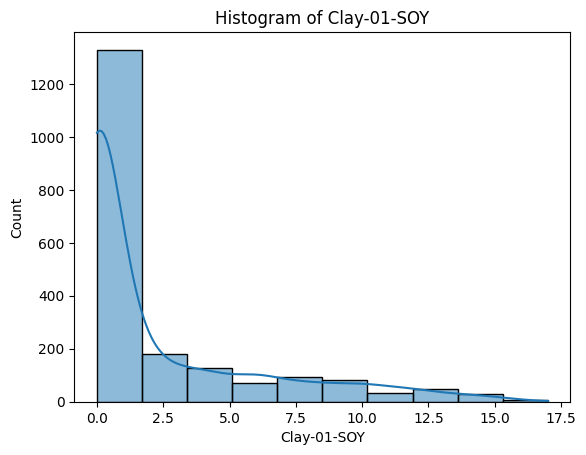

In [ ]:
#Histogram for Clay-01-SOY
sns.histplot(data=records['Clay-01-SOY'], kde=True, bins=10)
plt.title(f"Histogram of Clay-01-SOY")
plt.show()

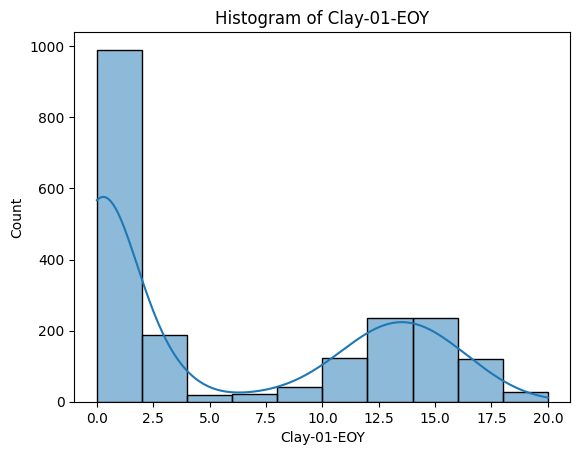

In [ ]:
#Histogram for Clay-01-EOY
sns.histplot(data=records['Clay-01-EOY'], kde=True, bins=10)
plt.title(f"Histogram of Clay-01-EOY")
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

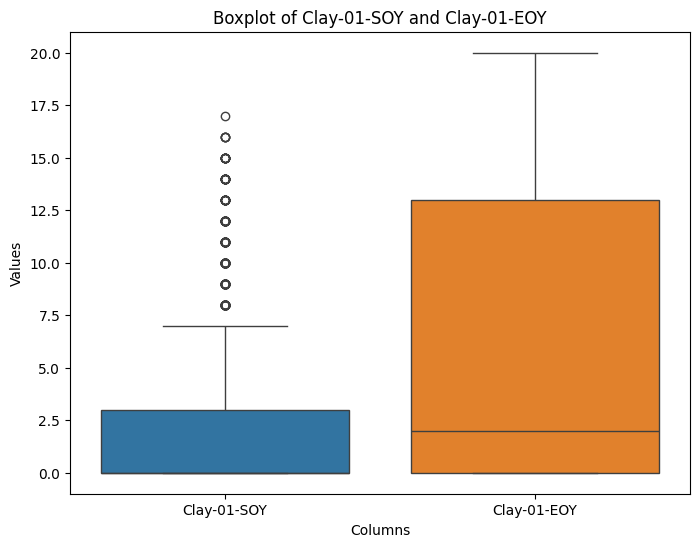

In [ ]:
# Create a DataFrame with just the two columns 'Clay-01-SOY' and 'Clay-01-EOY'
clay_data = records[['Clay-01-SOY', 'Clay-01-EOY']]

# Draw the box plot for both columns in one frame
plt.figure(figsize=(8, 6))
sns.boxplot(data=clay_data)

# Set the title and labels
plt.title('Boxplot of Clay-01-SOY and Clay-01-EOY')
plt.xlabel('Columns')
plt.ylabel('Values')

# Display the plot
plt.show()

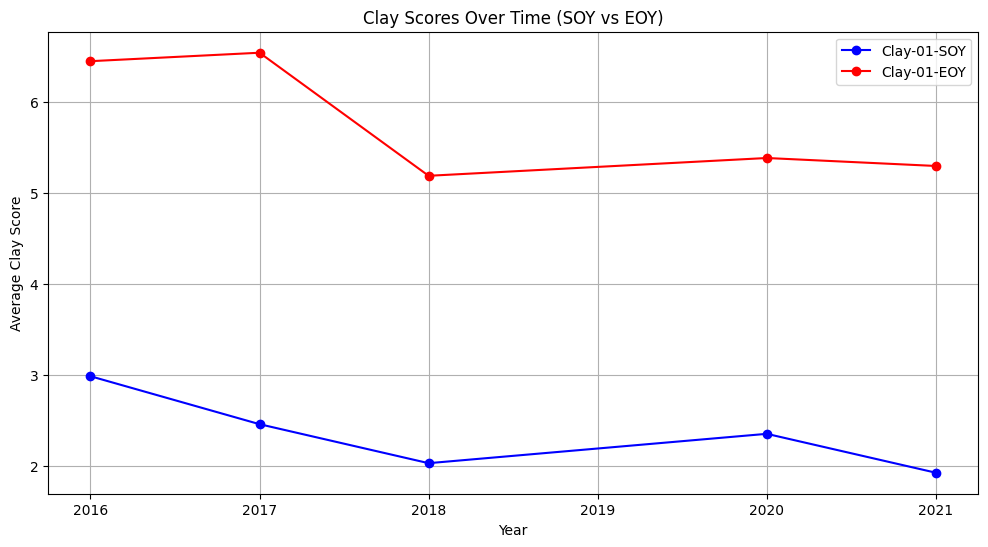

In [ ]:
# Group by 'Year_02' and calculate the mean for 'Clay-01-SOY' and 'Clay-01-EOY' for each year
clay_over_time = records.groupby('Year_02')[['Clay-01-SOY', 'Clay-01-EOY']].mean()

# Create a line chart for both Clay-01-SOY and Clay-01-EOY over time
plt.figure(figsize=(12, 6))

# Plot Clay-01-SOY
plt.plot(clay_over_time.index, clay_over_time['Clay-01-SOY'], marker='o', linestyle='-', color='b', label='Clay-01-SOY')

# Plot Clay-01-EOY
plt.plot(clay_over_time.index, clay_over_time['Clay-01-EOY'], marker='o', linestyle='-', color='r', label='Clay-01-EOY')

# Add title and labels
plt.title('Clay Scores Over Time (SOY vs EOY)')
plt.xlabel('Year')
plt.ylabel('Average Clay Score')

# Add legend to distinguish between SOY and EOY
plt.legend()

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


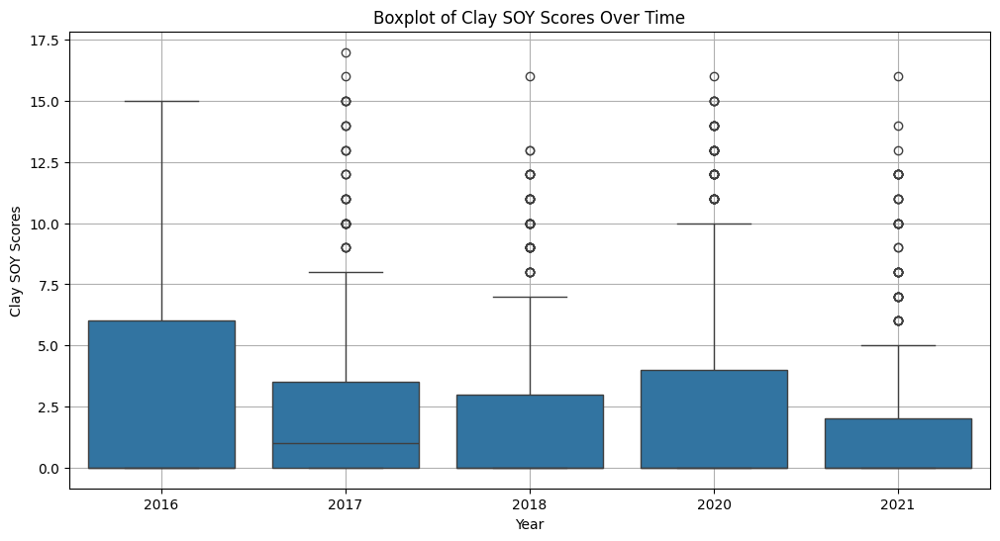

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


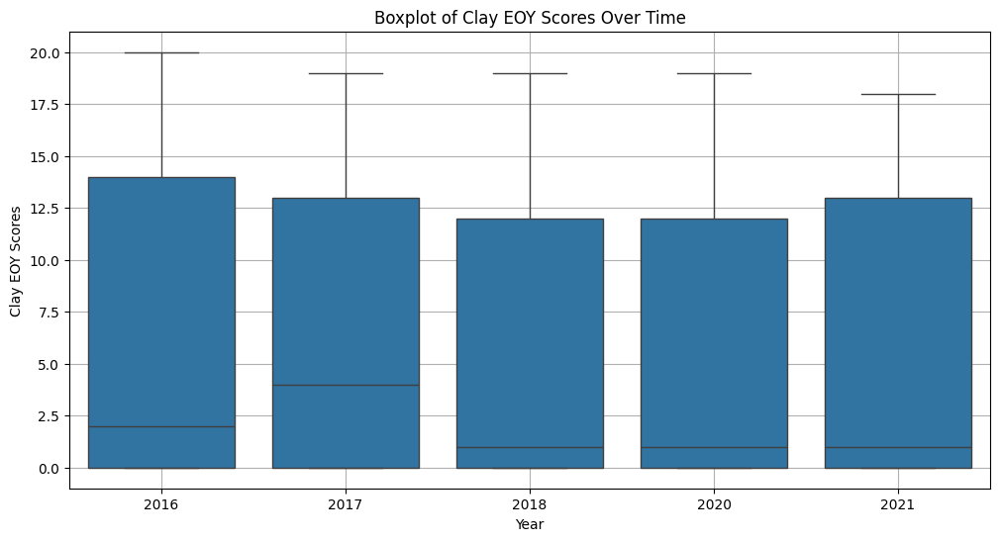

In [ ]:
# Create a DataFrame with the relevant columns for Clay
clay_01_data = records[['Clay-01-SOY', 'Clay-01-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, EOY), 'Value' (Clay scores), and 'Year_02'
clay_01_data_melted = pd.melt(clay_01_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'Clay-01-SOY' and 'Clay-01-EOY' for clarity
clay_01_data_melted['Time'] = clay_01_data_melted['Time'].replace({
    'Clay-01-SOY': 'SOY',
    'Clay-01-EOY': 'EOY'
})

# Filter the data for SOY and EOY
soy_clay_data = clay_01_data_melted[clay_01_data_melted['Time'] == 'SOY']
eoy_clay_data = clay_01_data_melted[clay_01_data_melted['Time'] == 'EOY']

# Create the box plot for SOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=soy_clay_data)
plt.title('Boxplot of Clay SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Clay SOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for EOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=eoy_clay_data)
plt.title('Boxplot of Clay EOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Clay EOY Scores')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

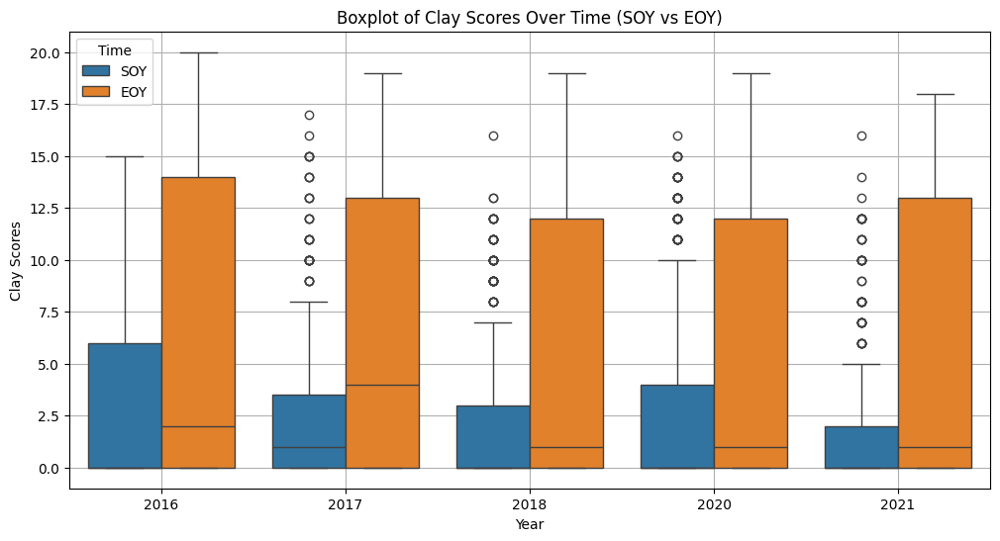

In [ ]:
# Create a DataFrame with the relevant columns for Clay
clay_01_data = records[['Clay-01-SOY', 'Clay-01-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, EOY), 'Value' (Clay scores), and 'Year_02'
clay_01_data_melted = pd.melt(clay_01_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'Clay-01-SOY' and 'Clay-01-EOY' for clarity
clay_01_data_melted['Time'] = clay_01_data_melted['Time'].replace({
    'Clay-01-SOY': 'SOY',
    'Clay-01-EOY': 'EOY'
})

# Draw the box plot for Clay scores with 'Year_02' on the x-axis and 'Value' on the y-axis, with 'Time' as the hue
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', hue='Time', data=clay_01_data_melted)

# Add title and labels
plt.title('Boxplot of Clay Scores Over Time (SOY vs EOY)')
plt.xlabel('Year')
plt.ylabel('Clay Scores')

# Add legend to distinguish between SOY and EOY
plt.legend(title='Time')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

In [ ]:
records[['TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY']].describe()

,TextLevel-01-SOY,TextLevel-01-MOY,TextLevel-01-EOY
count,1999.000000,1999.000000,1999.000000
mean,10.711356,15.005503,21.131066
std,6.082287,5.487949,4.579498
min,0.000000,0.000000,4.000000
25%,6.000000,11.000000,18.000000
50%,10.000000,14.000000,21.000000
75%,14.000000,18.000000,24.000000
max,34.000000,33.000000,34.000000


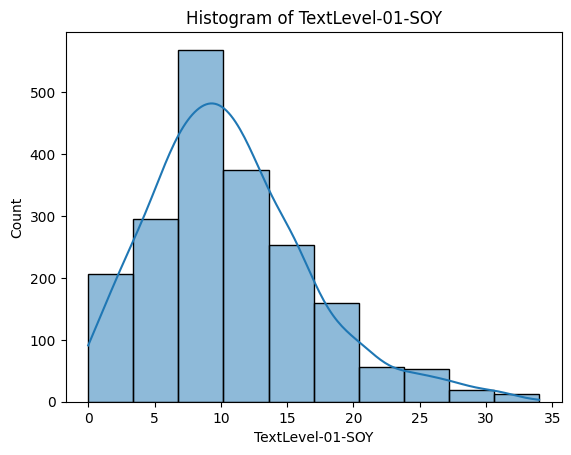

In [ ]:
#Histogram for TextLevel-01-SOY
sns.histplot(data=records['TextLevel-01-SOY'], kde=True, bins=10)
plt.title(f"Histogram of TextLevel-01-SOY")
plt.show()

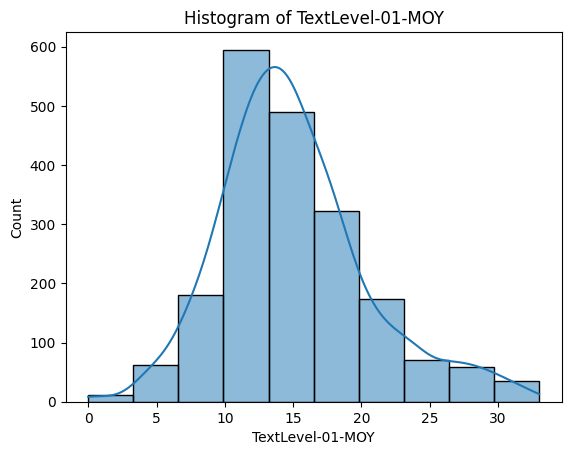

In [ ]:
#Histogram for TextLevel-01-MOY
sns.histplot(data=records['TextLevel-01-MOY'], kde=True, bins=10)
plt.title(f"Histogram of TextLevel-01-MOY")
plt.show()

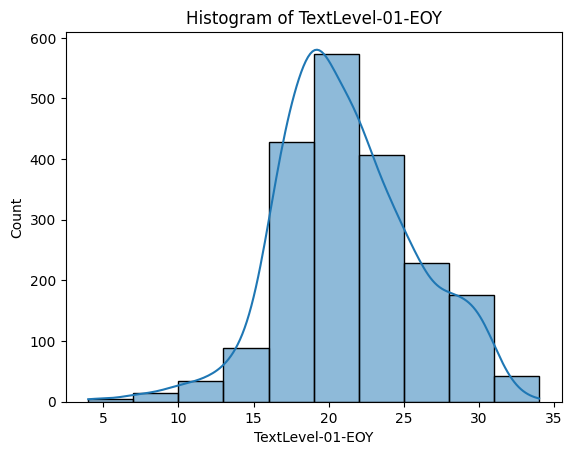

In [ ]:
#Histogram for TextLevel-01-EOY
sns.histplot(data=records['TextLevel-01-EOY'], kde=True, bins=10)
plt.title(f"Histogram of TextLevel-01-EOY")
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

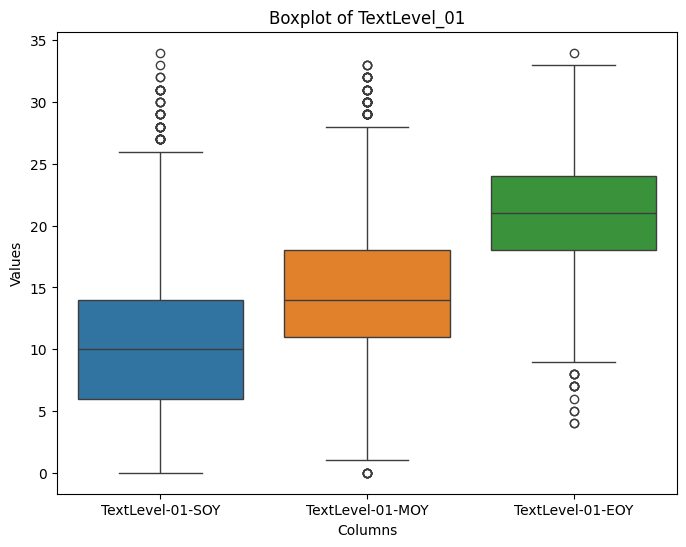

In [ ]:
# Create a DataFrame
textlevel_01_data = records[['TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY']]

# Draw the box plot for both columns in one frame
plt.figure(figsize=(8, 6))
sns.boxplot(data=textlevel_01_data)

# Set the title and labels
plt.title('Boxplot of TextLevel_01')
plt.xlabel('Columns')
plt.ylabel('Values')

# Display the plot
plt.show()

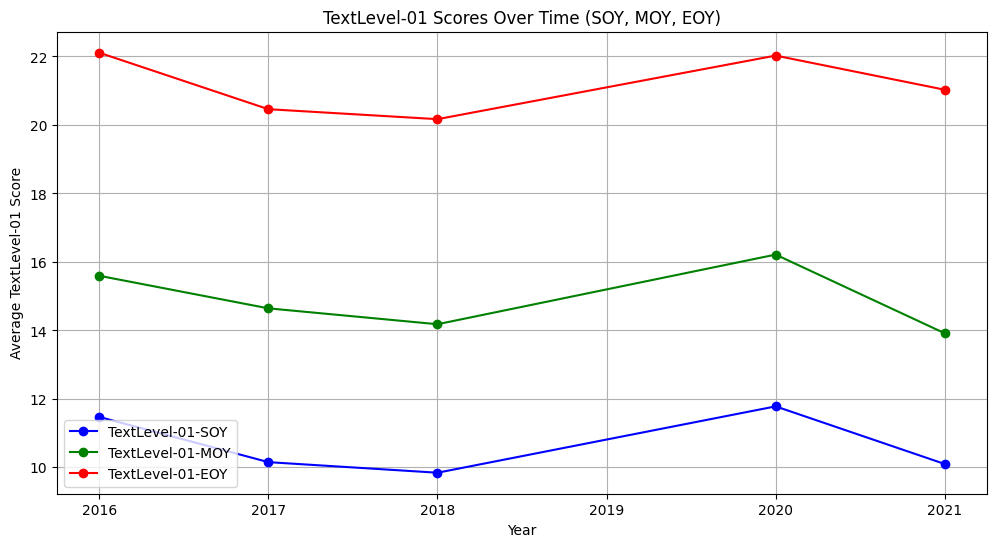

In [ ]:
# Group by 'Year_02' and calculate the mean for 'TextLevel-01-SOY', 'TextLevel-01-MOY', and 'TextLevel-01-EOY'
textlevel_01_over_time = records.groupby('Year_02')[['TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY']].mean()

# Create a line chart for TextLevel-01-SOY, TextLevel-01-MOY, and TextLevel-01-EOY over time
plt.figure(figsize=(12, 6))

# Plot TextLevel-01-SOY
plt.plot(textlevel_01_over_time.index, textlevel_01_over_time['TextLevel-01-SOY'], marker='o', linestyle='-', color='b', label='TextLevel-01-SOY')

# Plot TextLevel-01-MOY
plt.plot(textlevel_01_over_time.index, textlevel_01_over_time['TextLevel-01-MOY'], marker='o', linestyle='-', color='g', label='TextLevel-01-MOY')

# Plot TextLevel-01-EOY
plt.plot(textlevel_01_over_time.index, textlevel_01_over_time['TextLevel-01-EOY'], marker='o', linestyle='-', color='r', label='TextLevel-01-EOY')

# Add title and labels
plt.title('TextLevel-01 Scores Over Time (SOY, MOY, EOY)')
plt.xlabel('Year')
plt.ylabel('Average TextLevel-01 Score')

# Add legend to distinguish between SOY, MOY, and EOY
plt.legend()

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


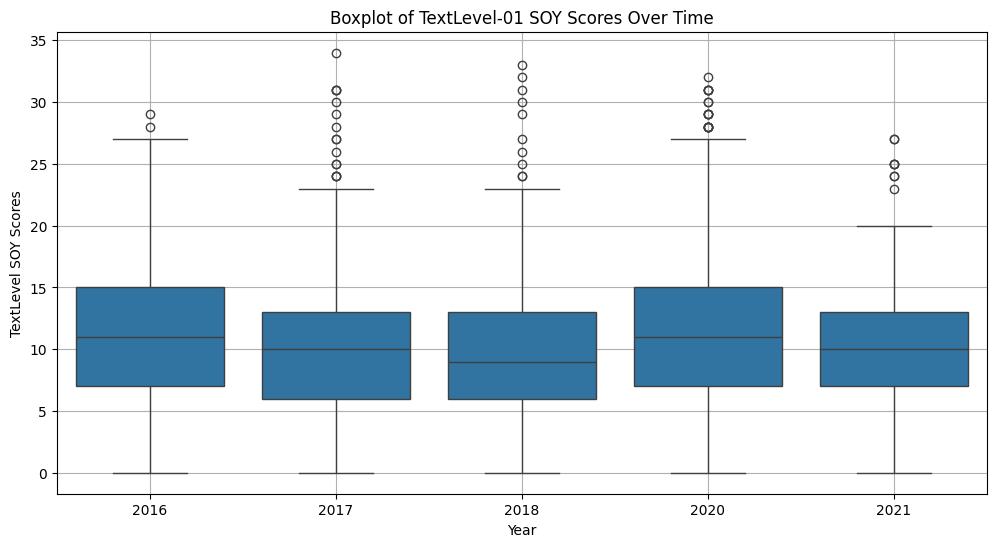

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


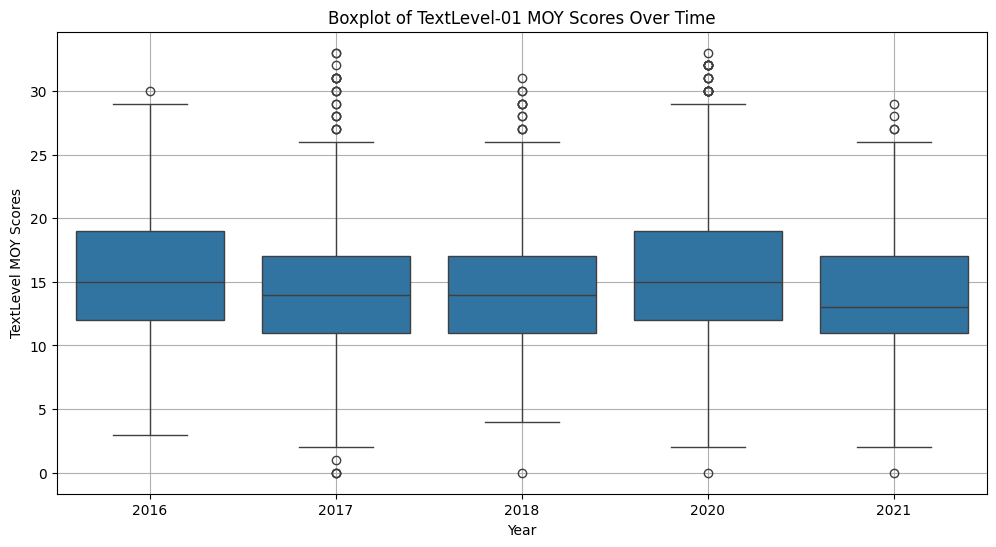

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


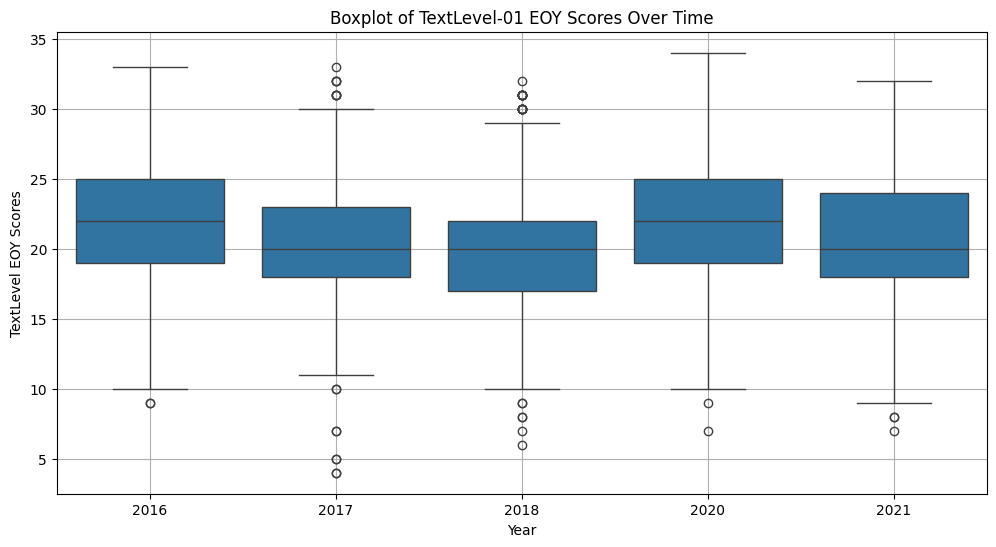

In [ ]:
# Create a DataFrame with the relevant columns
textlevel_data = records[['TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, MOY, EOY), 'Value' (TextLevel scores), and 'Year_02'
textlevel_data_melted = pd.melt(textlevel_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY' for clarity
textlevel_data_melted['Time'] = textlevel_data_melted['Time'].replace({
    'TextLevel-01-SOY': 'SOY',
    'TextLevel-01-MOY': 'MOY',
    'TextLevel-01-EOY': 'EOY'
})

# Filter the data for each time point: SOY, MOY, EOY
soy_data = textlevel_data_melted[textlevel_data_melted['Time'] == 'SOY']
moy_data = textlevel_data_melted[textlevel_data_melted['Time'] == 'MOY']
eoy_data = textlevel_data_melted[textlevel_data_melted['Time'] == 'EOY']

# Create the box plot for SOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=soy_data)
plt.title('Boxplot of TextLevel-01 SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel SOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for MOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=moy_data)
plt.title('Boxplot of TextLevel-01 MOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel MOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for EOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=eoy_data)
plt.title('Boxplot of TextLevel-01 EOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel EOY Scores')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

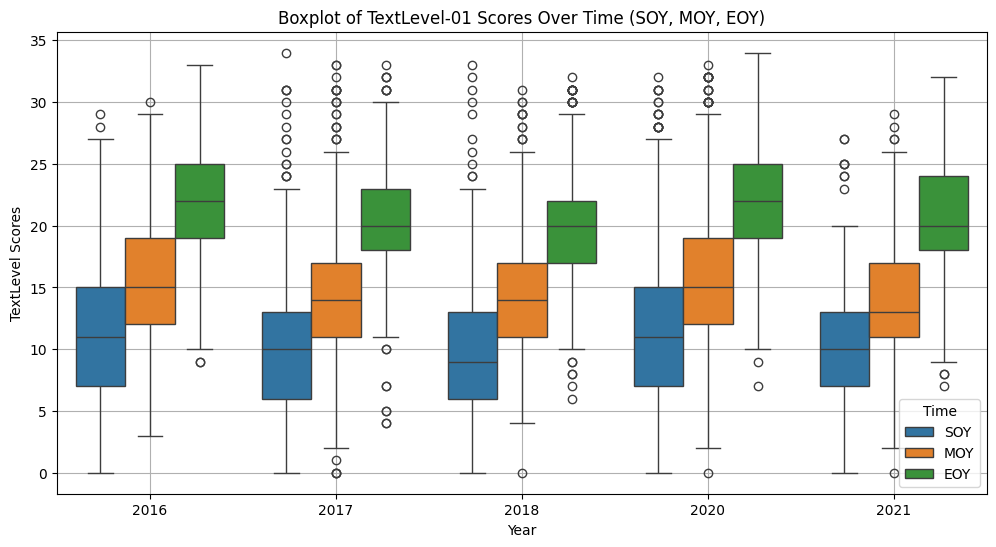

In [ ]:
# Create a DataFrame with the relevant columns
textlevel_data = records[['TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, MOY, EOY), 'Value' (TextLevel scores), and 'Year_02'
textlevel_data_melted = pd.melt(textlevel_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY' for clarity
textlevel_data_melted['Time'] = textlevel_data_melted['Time'].replace({
    'TextLevel-01-SOY': 'SOY',
    'TextLevel-01-MOY': 'MOY',
    'TextLevel-01-EOY': 'EOY'
})

# Draw the box plot with 'Year_02' on the x-axis and 'Value' on the y-axis, with 'Time' as the hue
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', hue='Time', data=textlevel_data_melted)

# Add title and labels
plt.title('Boxplot of TextLevel-01 Scores Over Time (SOY, MOY, EOY)')
plt.xlabel('Year')
plt.ylabel('TextLevel Scores')

# Add legend to distinguish between SOY, MOY, and EOY
plt.legend(title='Time')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

In [ ]:
records[['TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY']].describe()

,TextLevel-02-SOY,TextLevel-02-MOY,TextLevel-02-EOY
count,1999.000000,1999.000000,1999.000000
mean,21.789895,24.075538,26.998499
std,5.219303,4.691141,3.766256
min,2.000000,5.000000,5.000000
25%,18.000000,21.000000,25.000000
50%,22.000000,24.000000,28.000000
75%,25.000000,28.000000,30.000000
max,36.000000,34.000000,33.000000


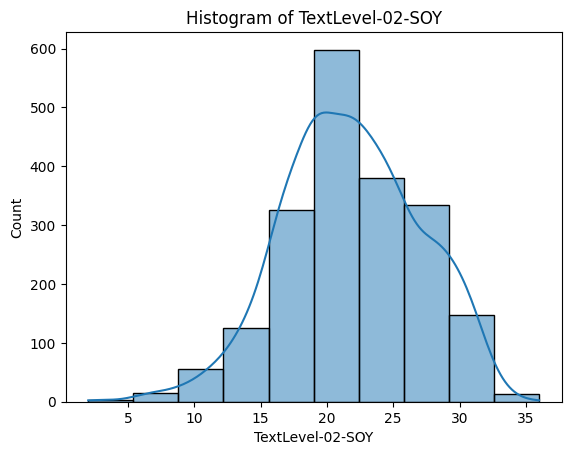

In [ ]:
#Histogram for TextLevel-02-SOY
sns.histplot(data=records['TextLevel-02-SOY'], kde=True, bins=10)
plt.title(f"Histogram of TextLevel-02-SOY")
plt.show()

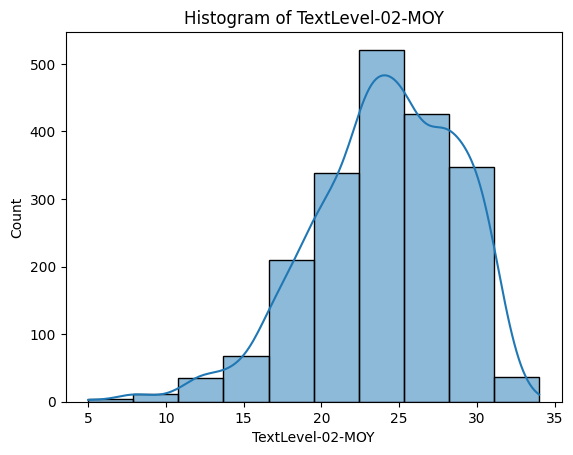

In [ ]:
#Histogram for TextLevel-02-MOY
sns.histplot(data=records['TextLevel-02-MOY'], kde=True, bins=10)
plt.title(f"Histogram of TextLevel-02-MOY")
plt.show()

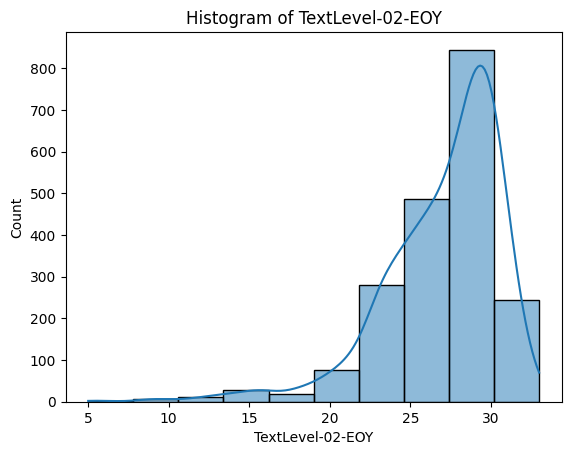

In [ ]:
#Histogram for TextLevel-02-EOY
sns.histplot(data=records['TextLevel-02-EOY'], kde=True, bins=10)
plt.title(f"Histogram of TextLevel-02-EOY")
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

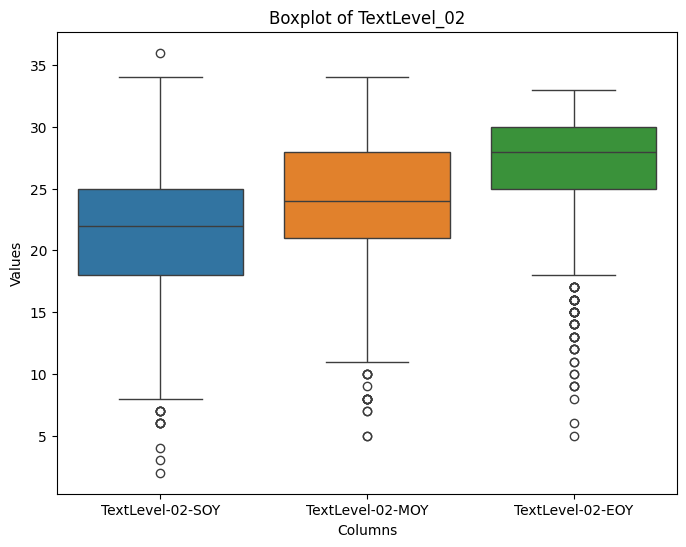

In [ ]:
# Create a DataFrame
textlevel_02_data = records[['TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY']]

# Draw the box plot for both columns in one frame
plt.figure(figsize=(8, 6))
sns.boxplot(data=textlevel_02_data)

# Set the title and labels
plt.title('Boxplot of TextLevel_02')
plt.xlabel('Columns')
plt.ylabel('Values')

# Display the plot
plt.show()

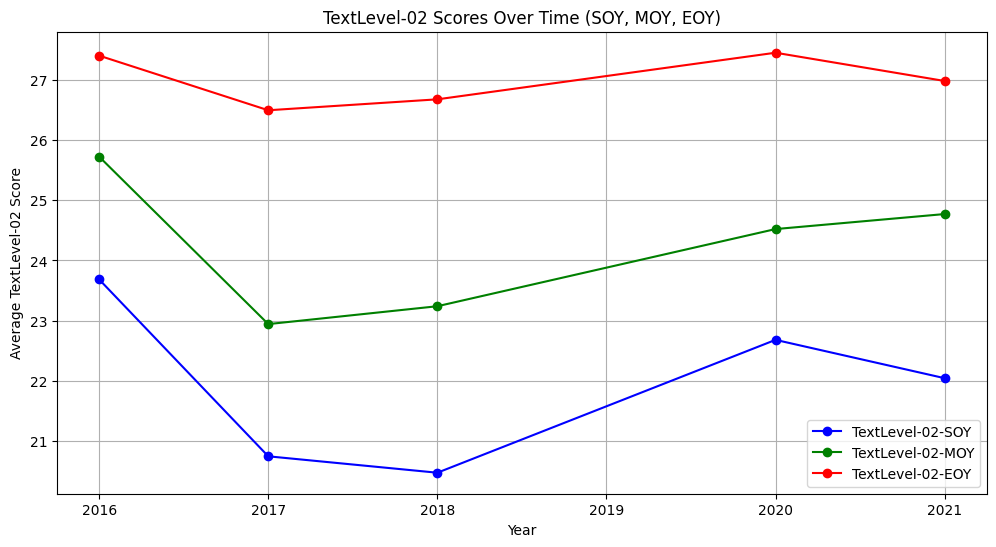

In [ ]:
# Group by 'Year_02' and calculate the mean for 'TextLevel-02-SOY', 'TextLevel-02-MOY', and 'TextLevel-02-EOY'
textlevel_02_over_time = records.groupby('Year_02')[['TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY']].mean()

# Create a line chart for TextLevel-01-SOY, TextLevel-01-MOY, and TextLevel-01-EOY over time
plt.figure(figsize=(12, 6))

# Plot TextLevel-02-SOY
plt.plot(textlevel_02_over_time.index, textlevel_02_over_time['TextLevel-02-SOY'], marker='o', linestyle='-', color='b', label='TextLevel-02-SOY')

# Plot TextLevel-02-MOY
plt.plot(textlevel_02_over_time.index, textlevel_02_over_time['TextLevel-02-MOY'], marker='o', linestyle='-', color='g', label='TextLevel-02-MOY')

# Plot TextLevel-02-EOY
plt.plot(textlevel_02_over_time.index, textlevel_02_over_time['TextLevel-02-EOY'], marker='o', linestyle='-', color='r', label='TextLevel-02-EOY')

# Add title and labels
plt.title('TextLevel-02 Scores Over Time (SOY, MOY, EOY)')
plt.xlabel('Year')
plt.ylabel('Average TextLevel-02 Score')

# Add legend to distinguish between SOY, MOY, and EOY
plt.legend()

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


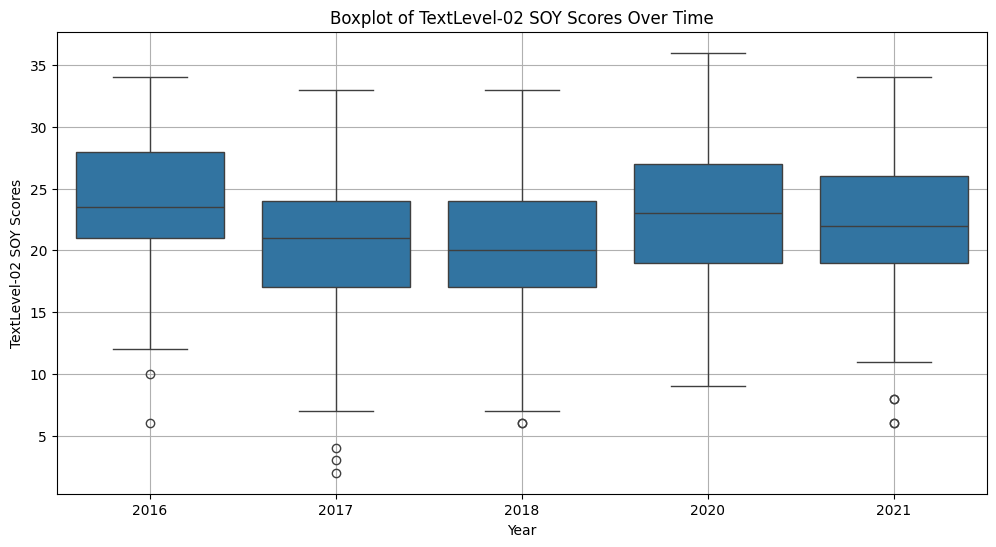

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


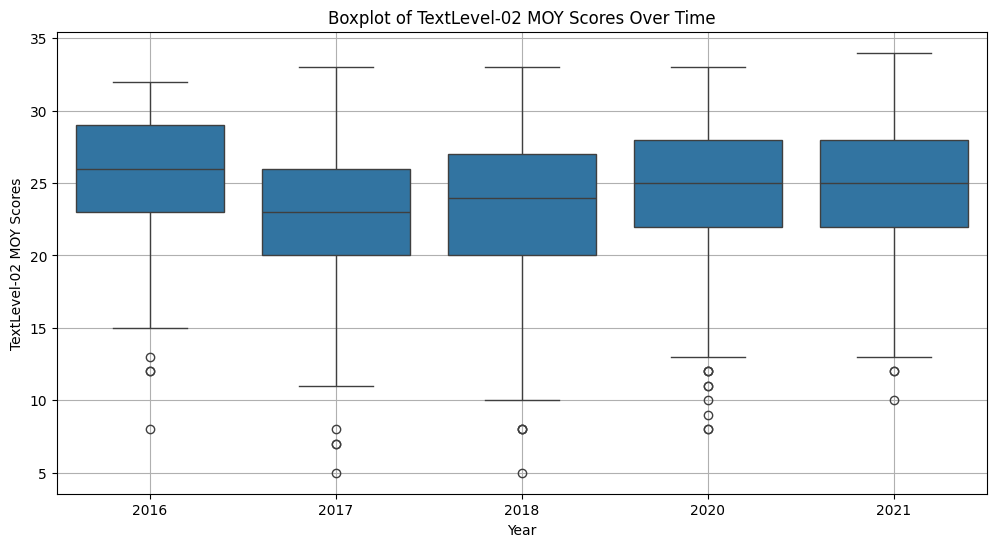

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


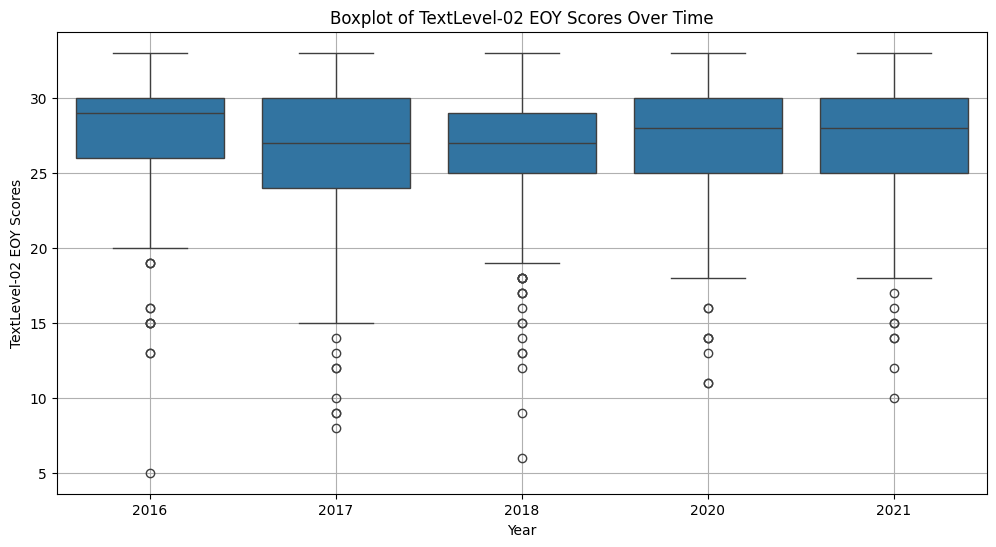

In [ ]:
# Create a DataFrame with the relevant columns for TextLevel-02
textlevel_2_data = records[['TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, MOY, EOY), 'Value' (TextLevel scores), and 'Year_02'
textlevel_2_data_melted = pd.melt(textlevel_2_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY' for clarity
textlevel_2_data_melted['Time'] = textlevel_2_data_melted['Time'].replace({
    'TextLevel-02-SOY': 'SOY',
    'TextLevel-02-MOY': 'MOY',
    'TextLevel-02-EOY': 'EOY'
})

# Filter the data for each time point: SOY, MOY, EOY
soy_data_2 = textlevel_2_data_melted[textlevel_2_data_melted['Time'] == 'SOY']
moy_data_2 = textlevel_2_data_melted[textlevel_2_data_melted['Time'] == 'MOY']
eoy_data_2 = textlevel_2_data_melted[textlevel_2_data_melted['Time'] == 'EOY']

# Create the box plot for SOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=soy_data_2)
plt.title('Boxplot of TextLevel-02 SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel-02 SOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for MOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=moy_data_2)
plt.title('Boxplot of TextLevel-02 MOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel-02 MOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for EOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=eoy_data_2)
plt.title('Boxplot of TextLevel-02 EOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel-02 EOY Scores')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

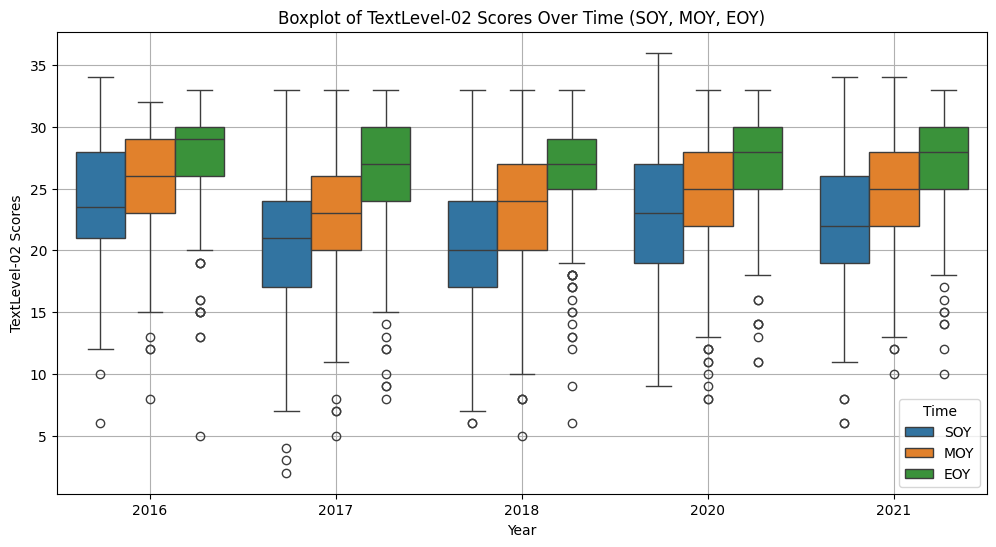

In [ ]:
# Create a DataFrame with the relevant columns
textlevel_2_data = records[['TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, MOY, EOY), 'Value' (TextLevel scores), and 'Year_02'
textlevel_2_data_melted = pd.melt(textlevel_2_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY' for clarity
textlevel_2_data_melted['Time'] = textlevel_2_data_melted['Time'].replace({
    'TextLevel-02-SOY': 'SOY',
    'TextLevel-02-MOY': 'MOY',
    'TextLevel-02-EOY': 'EOY'
})

# Draw the box plot with 'Year_02' on the x-axis and 'Value' on the y-axis, with 'Time' as the hue
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', hue='Time', data=textlevel_2_data_melted)

# Add title and labels
plt.title('Boxplot of TextLevel-02 Scores Over Time (SOY, MOY, EOY)')
plt.xlabel('Year')
plt.ylabel('TextLevel-02 Scores')

# Add legend to distinguish between SOY, MOY, and EOY
plt.legend(title='Time')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()


### 2.3. Students' Writing Skills at The Start of Year 1

In [ ]:
records[['WritingVocab-01-SOY']].describe()

,WritingVocab-01-SOY
count,1999.000000
mean,22.018509
std,12.682271
min,0.000000
25%,13.000000
50%,20.000000
75%,29.000000
max,95.000000


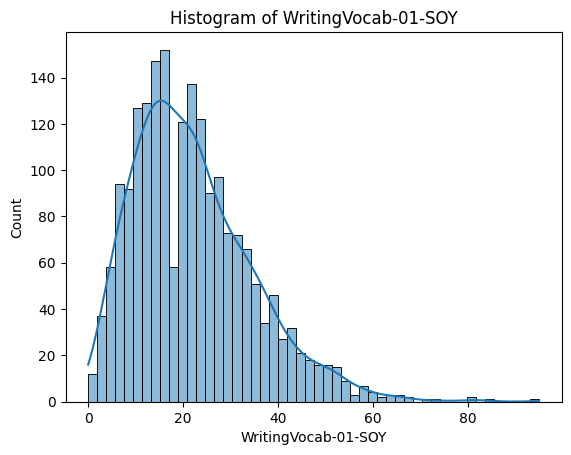

In [ ]:
#Histogram for WritingVocab-01-SOY
sns.histplot(data=records['WritingVocab-01-SOY'], kde=True, bins=50)
plt.title(f"Histogram of WritingVocab-01-SOY")
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


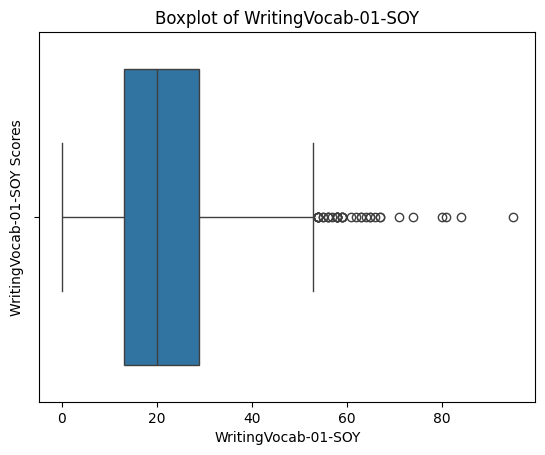

In [ ]:
#Boxplot for WritingVocab-01-SOY
sns.boxplot(x=records['WritingVocab-01-SOY'])
plt.title('Boxplot of WritingVocab-01-SOY')
plt.ylabel('WritingVocab-01-SOY Scores')
plt.show()


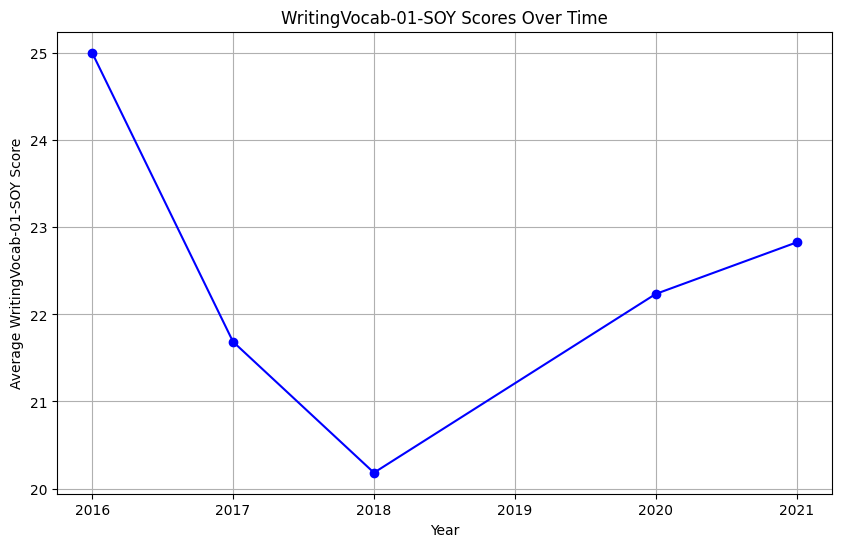

In [ ]:
# Group by 'Year_02' and calculate the mean for 'WritingVocab-01-SOY'
writing_vocab_over_time = records.groupby('Year_02')['WritingVocab-01-SOY'].mean()

# Create a line chart for WritingVocab-01-SOY over time
plt.figure(figsize=(10, 6))

# Plot the data
plt.plot(writing_vocab_over_time.index, writing_vocab_over_time, marker='o', linestyle='-', color='b', label='WritingVocab-01-SOY')

# Add title and labels
plt.title('WritingVocab-01-SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Average WritingVocab-01-SOY Score')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


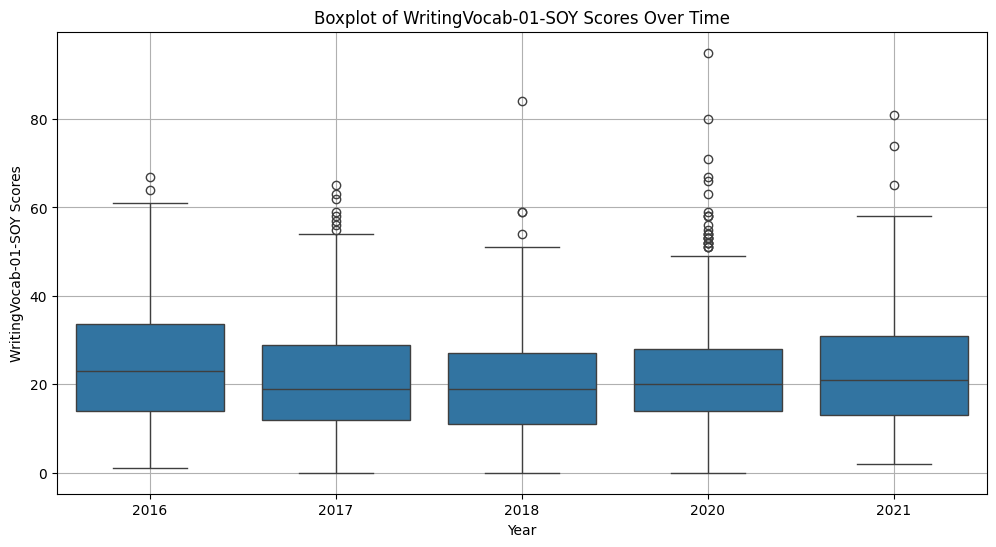

In [ ]:
# Create a DataFrame with the relevant columns for WritingVocab-01-SOY
writing_vocab_data = records[['WritingVocab-01-SOY', 'Year_02']]

# Create the box plot for WritingVocab-01-SOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='WritingVocab-01-SOY', data=writing_vocab_data)
plt.title('Boxplot of WritingVocab-01-SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('WritingVocab-01-SOY Scores')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

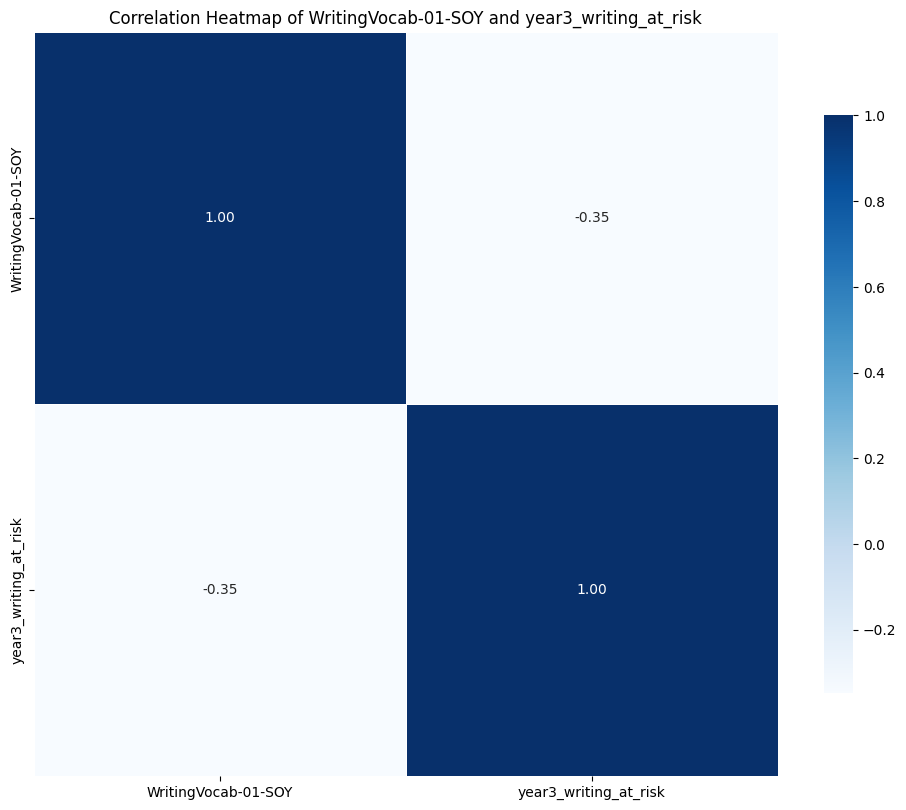

In [ ]:
heatmap_variables = ['WritingVocab-01-SOY', 'year3_writing_at_risk']

# Create a correlation matrix
corr_matrix_1 = records[heatmap_variables].corr()

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_1,
            square=True,
            cmap='Blues',
            annot=True,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": 0.75})

# Display the plot
plt.title('Correlation Heatmap of WritingVocab-01-SOY and year3_writing_at_risk')
plt.show()

### 2.4. Students' Literacy Skills and Numeracy Skills

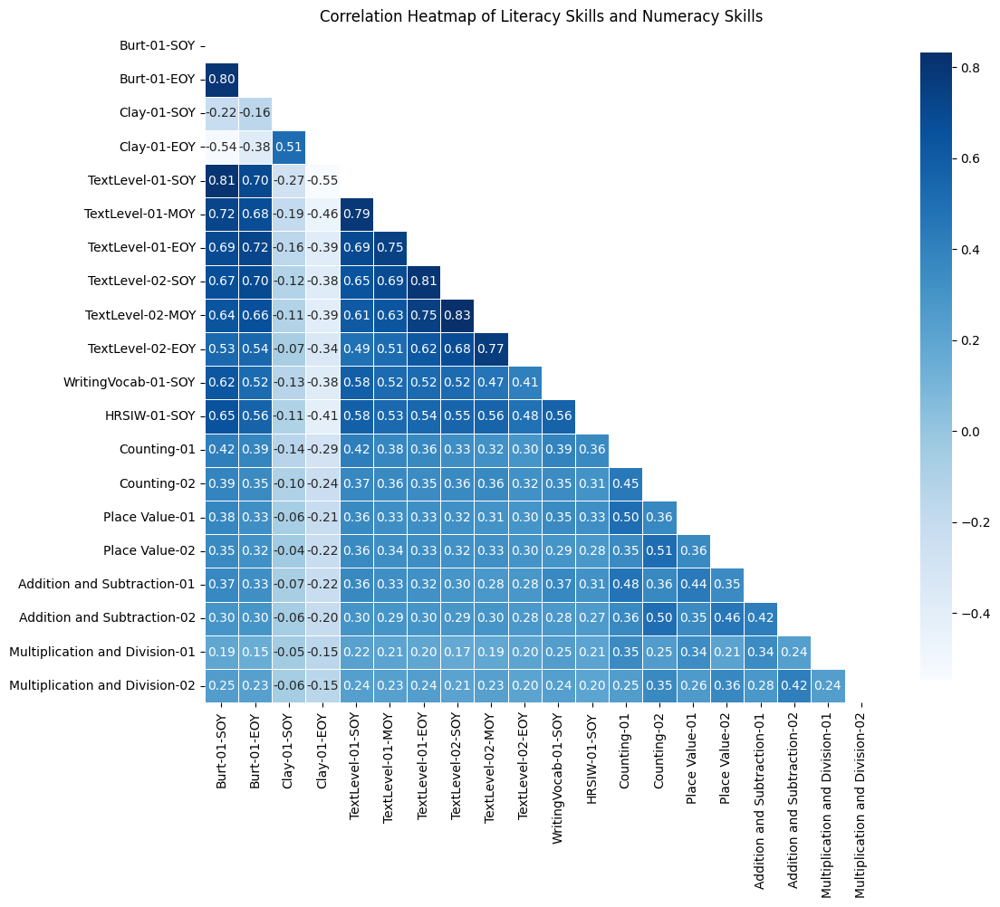

In [ ]:
literacy_numeracy_heatmap_variables = [
    'Burt-01-SOY', 'Burt-01-EOY',
    'Clay-01-SOY', 'Clay-01-EOY',
    'TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY',
    'TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY',
    'WritingVocab-01-SOY', 'HRSIW-01-SOY',
    'Counting-01', 'Counting-02',
    'Place Value-01', 'Place Value-02',
    'Addition and Subtraction-01', 'Addition and Subtraction-02',
    'Multiplication and Division-01', 'Multiplication and Division-02'
]

# Create a correlation matrix
corr_matrix_2 = records[literacy_numeracy_heatmap_variables].corr()

mask = np.triu(np.ones_like(corr_matrix_2, dtype=bool))

# Create the heatmap
plt.figure(figsize=(12, 12))
sns.heatmap(corr_matrix_2,
            mask=mask,
            square=True,
            cmap='Blues',
            annot=True,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": 0.75})

# Display the plot
plt.title('Correlation Heatmap of Literacy Skills and Numeracy Skills')
plt.show()

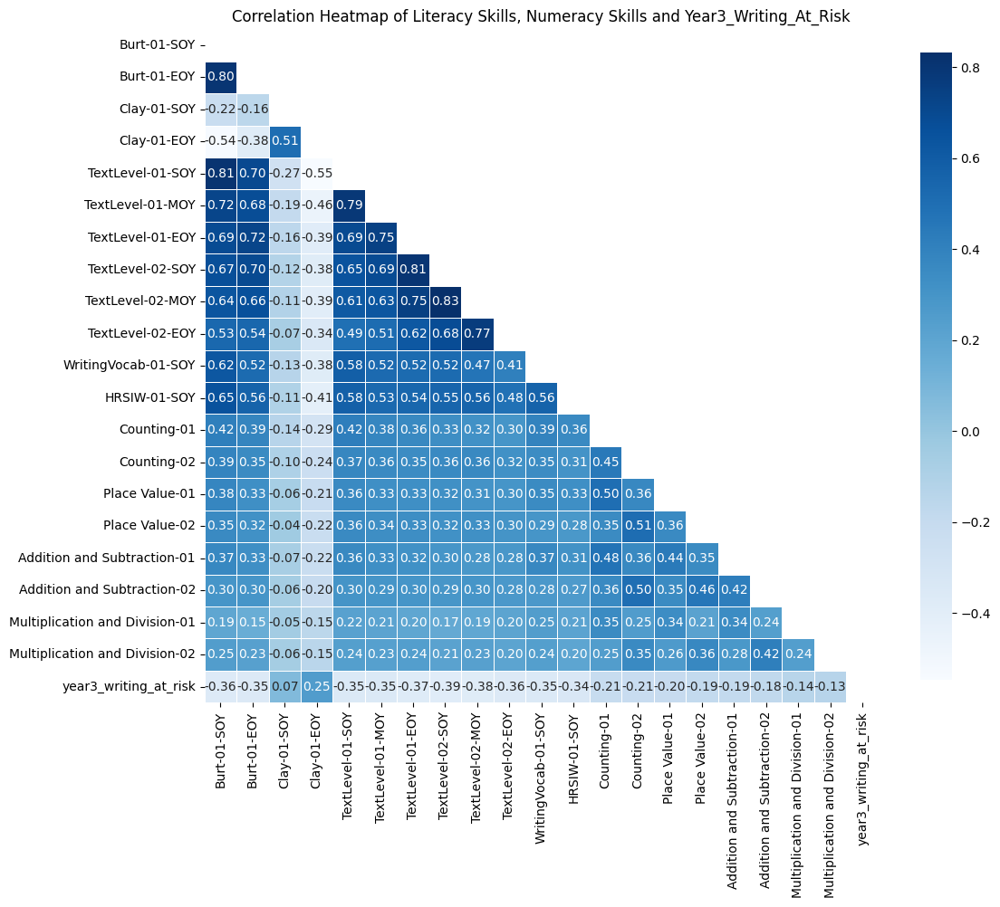

In [ ]:
lit_num_writingatrisk_heatmap_variables = [
    'Burt-01-SOY', 'Burt-01-EOY',
    'Clay-01-SOY', 'Clay-01-EOY',
    'TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY',
    'TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY',
    'WritingVocab-01-SOY', 'HRSIW-01-SOY',
    'Counting-01', 'Counting-02',
    'Place Value-01', 'Place Value-02',
    'Addition and Subtraction-01', 'Addition and Subtraction-02',
    'Multiplication and Division-01', 'Multiplication and Division-02',
    'year3_writing_at_risk'
]

# Create a correlation matrix
corr_matrix_3 = records[lit_num_writingatrisk_heatmap_variables].corr()

mask = np.triu(np.ones_like(corr_matrix_3, dtype=bool))

# Create the heatmap
plt.figure(figsize=(12, 12))
sns.heatmap(corr_matrix_3,
            mask=mask,
            square=True,
            cmap='Blues',
            annot=True,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": 0.75})

# Display the plot
plt.title('Correlation Heatmap of Literacy Skills, Numeracy Skills and Year3_Writing_At_Risk')
plt.show()

### 2.5. Students’ Disability Conditions

In [ ]:
#Disability Describe
records['Disability'].describe()

,Disability
count,1999
unique,5
top,Disability_Non-disable
freq,1380


In [ ]:
#Disability counts
records['Disability'].value_counts()

,count
Disability,
Disability_Non-disable,1380
Disability_Cognitive,469
Disability_SocialEmotional,73
Disability_Physical,67
Disability_Sensory,10


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When 

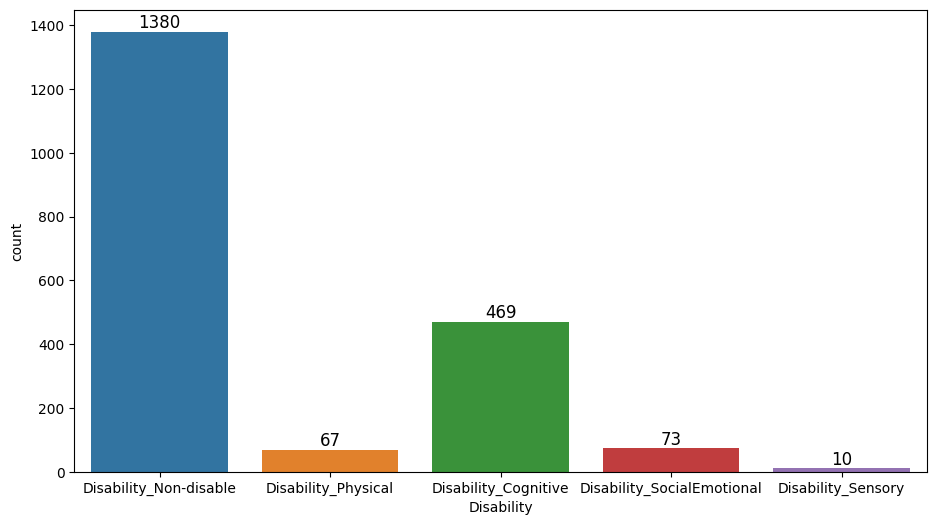

In [ ]:
plt.figure(figsize=(11, 6))
ax = sns.countplot(data=records, x='Disability', hue='Disability')

# Adding the counts on top of each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'baseline',
                fontsize=12, color='black', xytext=(0, 3),
                textcoords='offset points')

plt.show()

In [ ]:
#Disability Proportion
records['Disability'].value_counts(normalize=True).round(4)

,proportion
Disability,
Disability_Non-disable,0.6903
Disability_Cognitive,0.2346
Disability_SocialEmotional,0.0365
Disability_Physical,0.0335
Disability_Sensory,0.0050


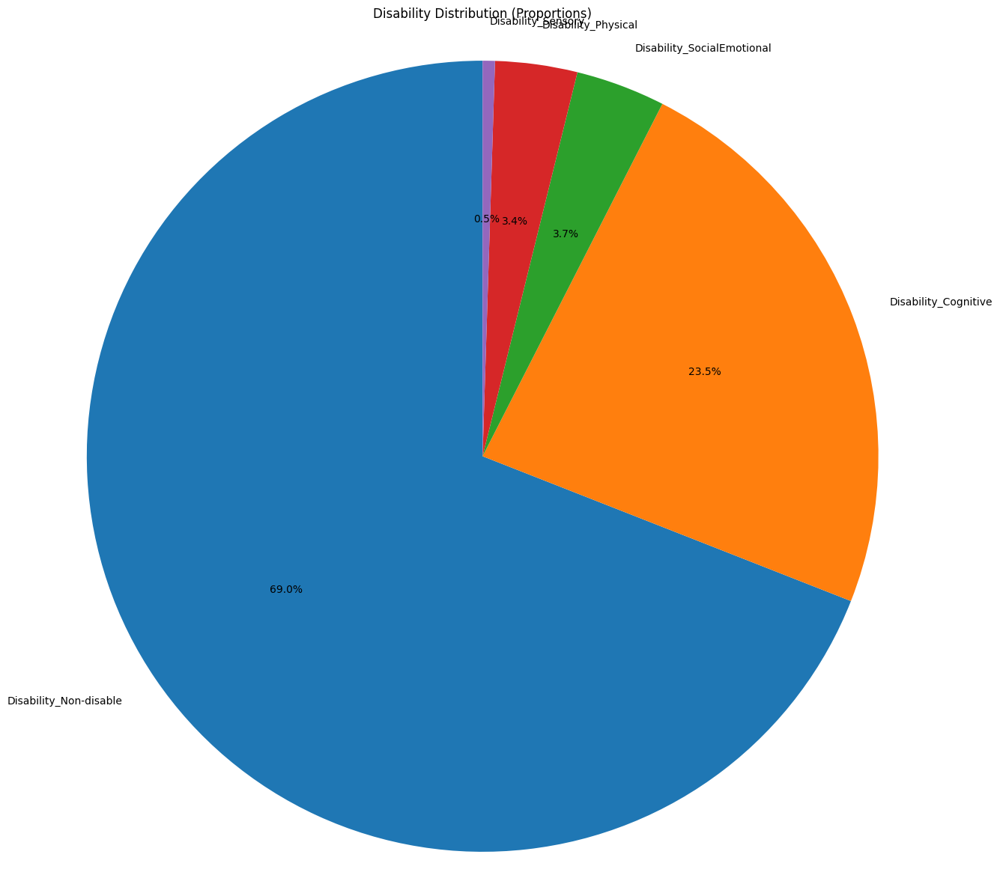

In [ ]:
#Pie Chart for Disability
# Calculate proportions
disability_proportion = records['Disability'].value_counts(normalize=True)

# Create pie chart
plt.figure(figsize=(15, 15))
plt.pie(disability_proportion, labels=disability_proportion.index, autopct='%1.1f%%', startangle=90)

# Add title
plt.title('Disability Distribution (Proportions)')

# Ensure circle's proportion
plt.axis('equal')

# Display chart
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


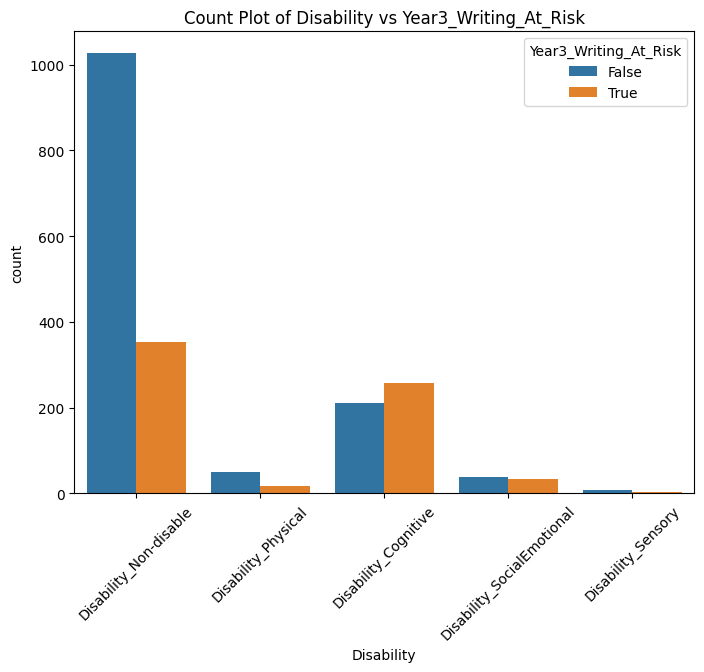

In [ ]:
#Count plot of Disability vs Year3_Writing_At_Risk
plt.figure(figsize=(8, 6))
sns.countplot(x='Disability', hue='Year3_Writing_At_Risk', data=records)
plt.title(f'Count Plot of Disability vs Year3_Writing_At_Risk')
plt.xticks(rotation=45)
plt.show()

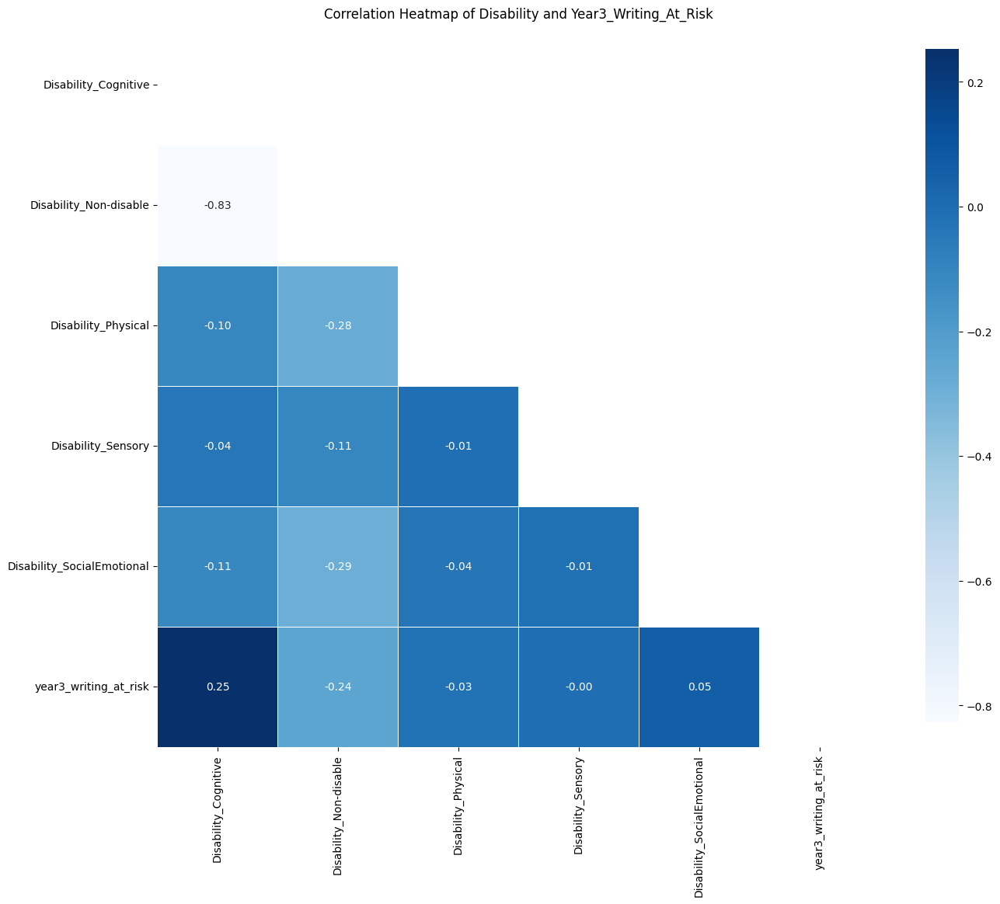

In [ ]:
disability_writingatrisk_heatmap_variables = [
    'Disability_Cognitive', 'Disability_Non-disable',
    'Disability_Physical', 'Disability_Sensory',
    'Disability_SocialEmotional', 'year3_writing_at_risk'
    ]

# Create a correlation matrix
corr_matrix_4 = records[disability_writingatrisk_heatmap_variables].corr()

mask = np.triu(np.ones_like(corr_matrix_4, dtype=bool))

# Create the heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(corr_matrix_4,
            mask=mask,
            square=True,
            cmap='Blues',
            annot=True,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": 0.75})

# Display the plot
plt.title('Correlation Heatmap of Disability and Year3_Writing_At_Risk')
plt.show()

### 2.6. Additional Insight

#### Writing Skills Trend

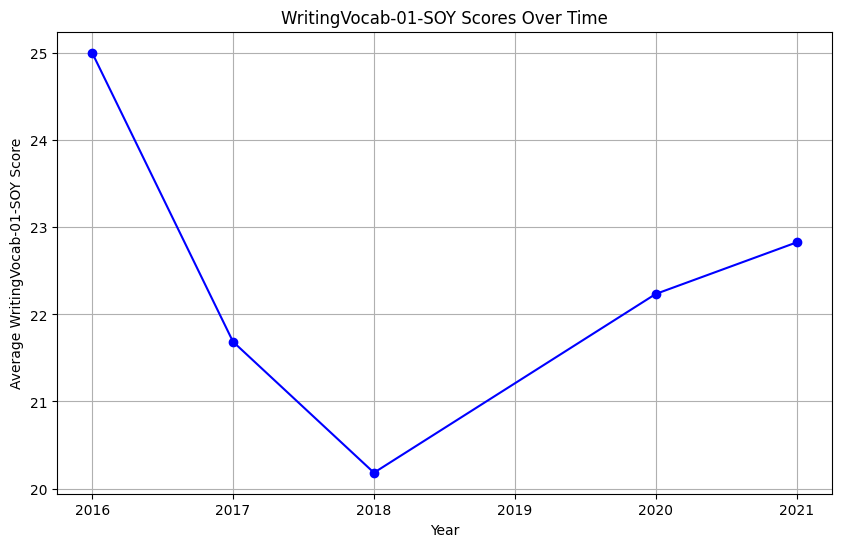

In [ ]:
# Group by 'Year_02' and calculate the mean for 'WritingVocab-01-SOY'
writing_vocab_over_time = records.groupby('Year_02')['WritingVocab-01-SOY'].mean()

# Create a line chart for WritingVocab-01-SOY over time
plt.figure(figsize=(10, 6))

# Plot the data
plt.plot(writing_vocab_over_time.index, writing_vocab_over_time, marker='o', linestyle='-', color='b', label='WritingVocab-01-SOY')

# Add title and labels
plt.title('WritingVocab-01-SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Average WritingVocab-01-SOY Score')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


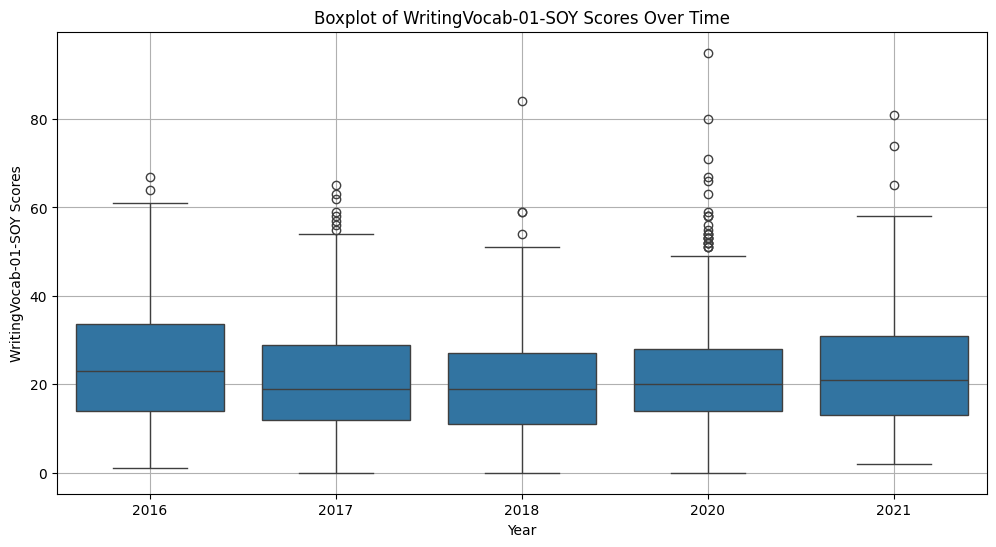

In [ ]:
# Create a DataFrame with the relevant columns for WritingVocab-01-SOY
writing_vocab_data = records[['WritingVocab-01-SOY', 'Year_02']]

# Create the box plot for WritingVocab-01-SOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='WritingVocab-01-SOY', data=writing_vocab_data)
plt.title('Boxplot of WritingVocab-01-SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('WritingVocab-01-SOY Scores')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

#### Burt Trend

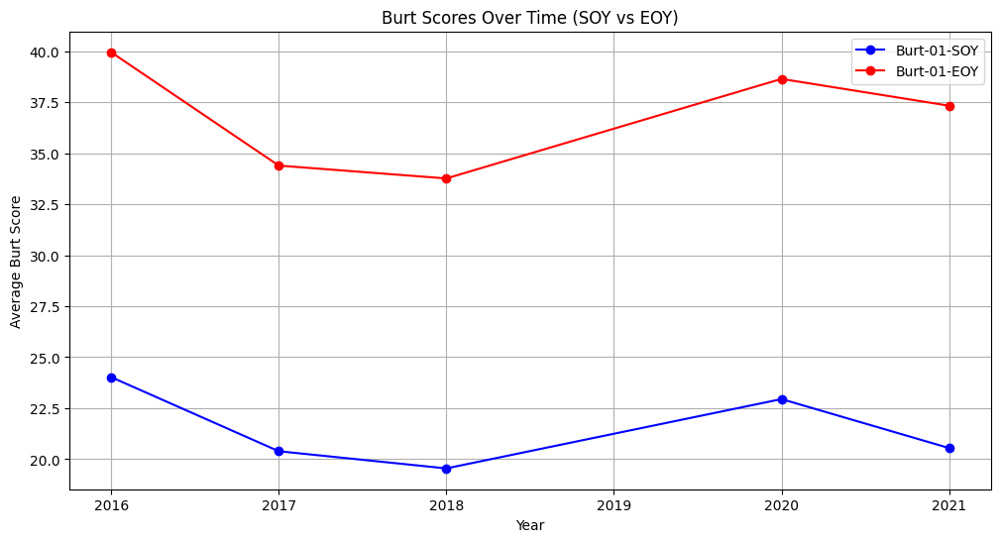

In [ ]:
# Group by 'Year_02' and calculate the mean for 'Burt-01-SOY' and 'Burt-01-EOY' for each year
burt_over_time = records.groupby('Year_02')[['Burt-01-SOY', 'Burt-01-EOY']].mean()

# Create a line chart for both Burt-01-SOY and Burt-01-EOY over time
plt.figure(figsize=(12, 6))

# Plot Burt-01-SOY
plt.plot(burt_over_time.index, burt_over_time['Burt-01-SOY'], marker='o', linestyle='-', color='b', label='Burt-01-SOY')

# Plot Burt-01-EOY
plt.plot(burt_over_time.index, burt_over_time['Burt-01-EOY'], marker='o', linestyle='-', color='r', label='Burt-01-EOY')

# Add title and labels
plt.title('Burt Scores Over Time (SOY vs EOY)')
plt.xlabel('Year')
plt.ylabel('Average Burt Score')

# Add legend to distinguish between SOY and EOY
plt.legend()

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


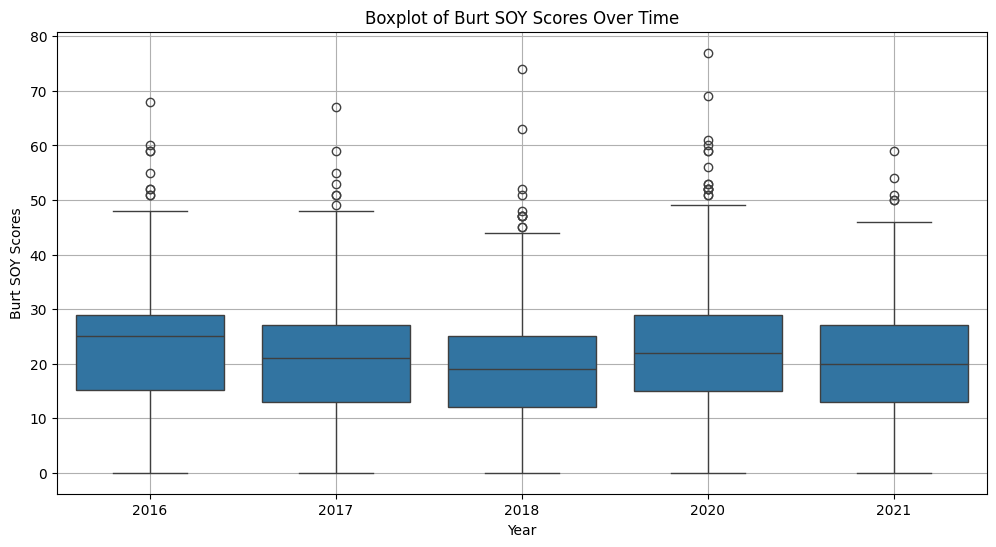

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


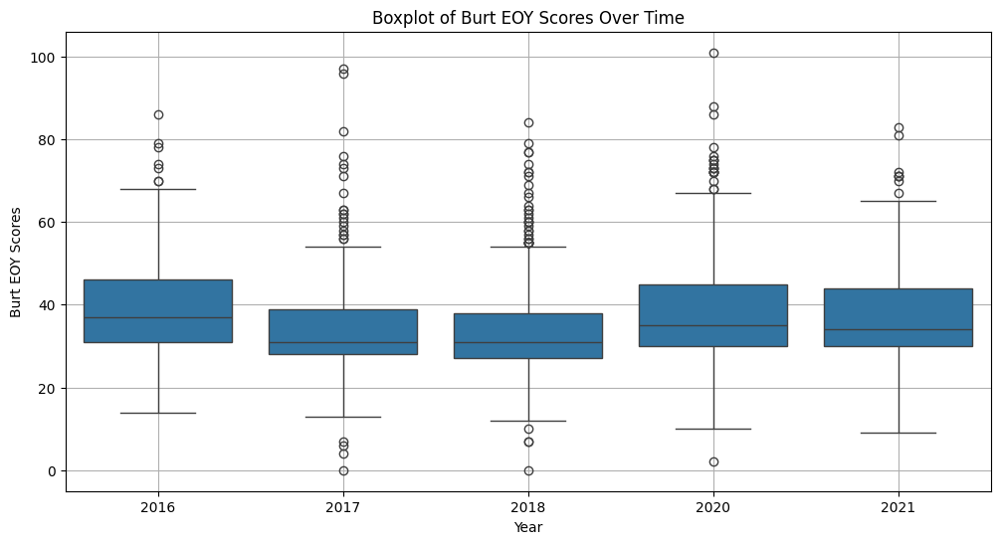

In [ ]:
# Create a DataFrame with the relevant columns for Burt
burt_01_data = records[['Burt-01-SOY', 'Burt-01-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, EOY), 'Value' (Burt scores), and 'Year_02'
burt_01_data_melted = pd.melt(burt_01_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'Burt-01-SOY' and 'Burt-01-EOY' for clarity
burt_01_data_melted['Time'] = burt_01_data_melted['Time'].replace({
    'Burt-01-SOY': 'SOY',
    'Burt-01-EOY': 'EOY'
})

# Filter the data for SOY and EOY
soy_burt_data = burt_01_data_melted[burt_01_data_melted['Time'] == 'SOY']
eoy_burt_data = burt_01_data_melted[burt_01_data_melted['Time'] == 'EOY']

# Create the box plot for SOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=soy_burt_data)
plt.title('Boxplot of Burt SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Burt SOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for EOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=eoy_burt_data)
plt.title('Boxplot of Burt EOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Burt EOY Scores')
plt.grid(True)
plt.show()

#### TextLevel-01 Trend

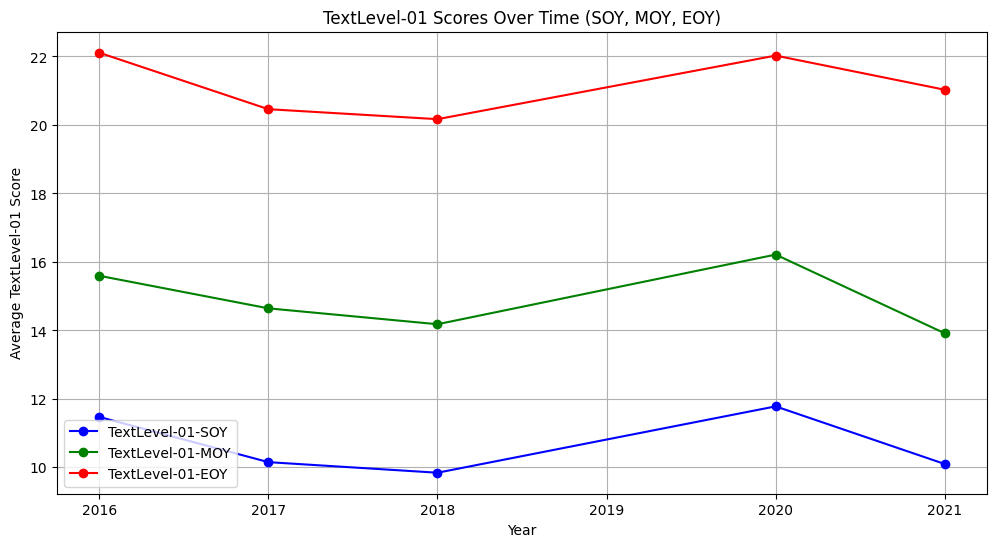

In [ ]:
# Group by 'Year_02' and calculate the mean for 'TextLevel-01-SOY', 'TextLevel-01-MOY', and 'TextLevel-01-EOY'
textlevel_01_over_time = records.groupby('Year_02')[['TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY']].mean()

# Create a line chart for TextLevel-01-SOY, TextLevel-01-MOY, and TextLevel-01-EOY over time
plt.figure(figsize=(12, 6))

# Plot TextLevel-01-SOY
plt.plot(textlevel_01_over_time.index, textlevel_01_over_time['TextLevel-01-SOY'], marker='o', linestyle='-', color='b', label='TextLevel-01-SOY')

# Plot TextLevel-01-MOY
plt.plot(textlevel_01_over_time.index, textlevel_01_over_time['TextLevel-01-MOY'], marker='o', linestyle='-', color='g', label='TextLevel-01-MOY')

# Plot TextLevel-01-EOY
plt.plot(textlevel_01_over_time.index, textlevel_01_over_time['TextLevel-01-EOY'], marker='o', linestyle='-', color='r', label='TextLevel-01-EOY')

# Add title and labels
plt.title('TextLevel-01 Scores Over Time (SOY, MOY, EOY)')
plt.xlabel('Year')
plt.ylabel('Average TextLevel-01 Score')

# Add legend to distinguish between SOY, MOY, and EOY
plt.legend()

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


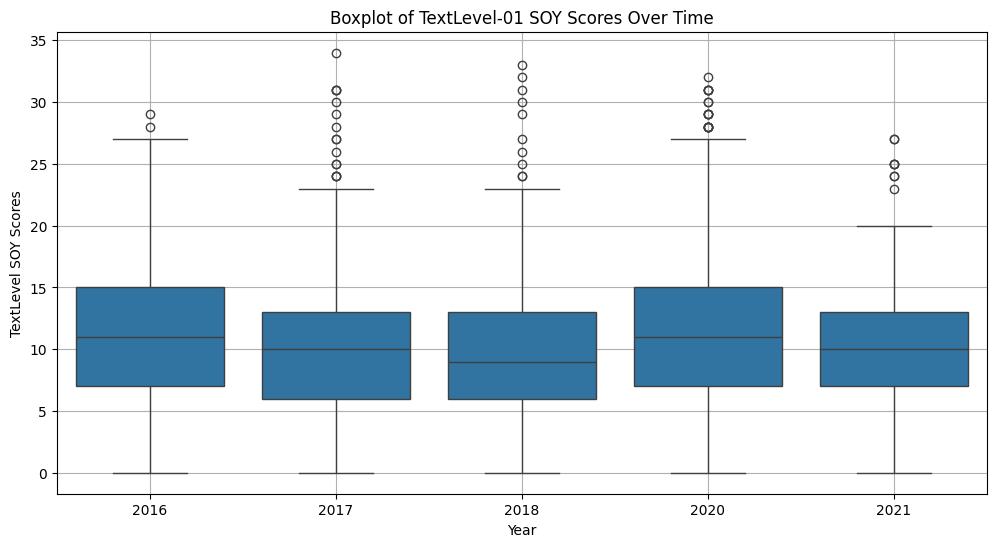

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


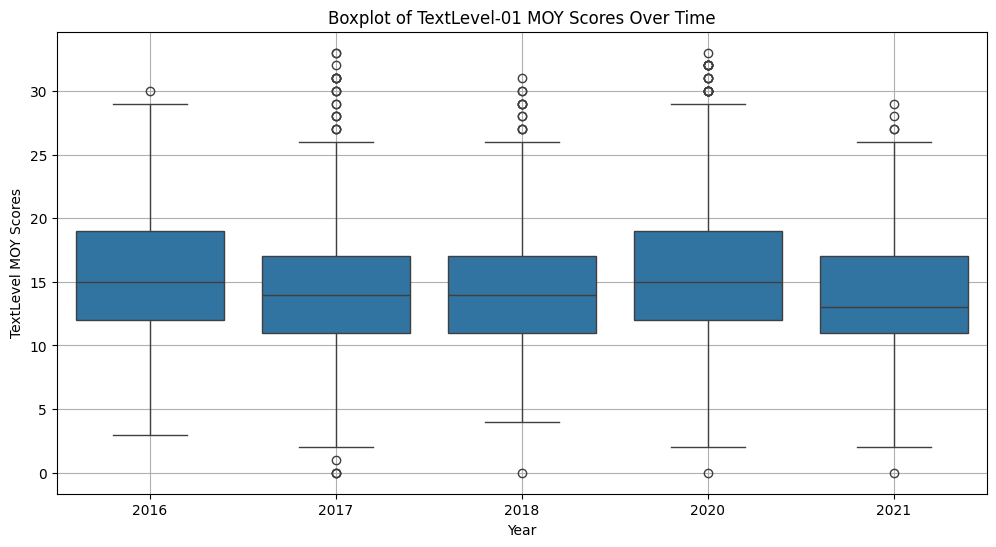

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


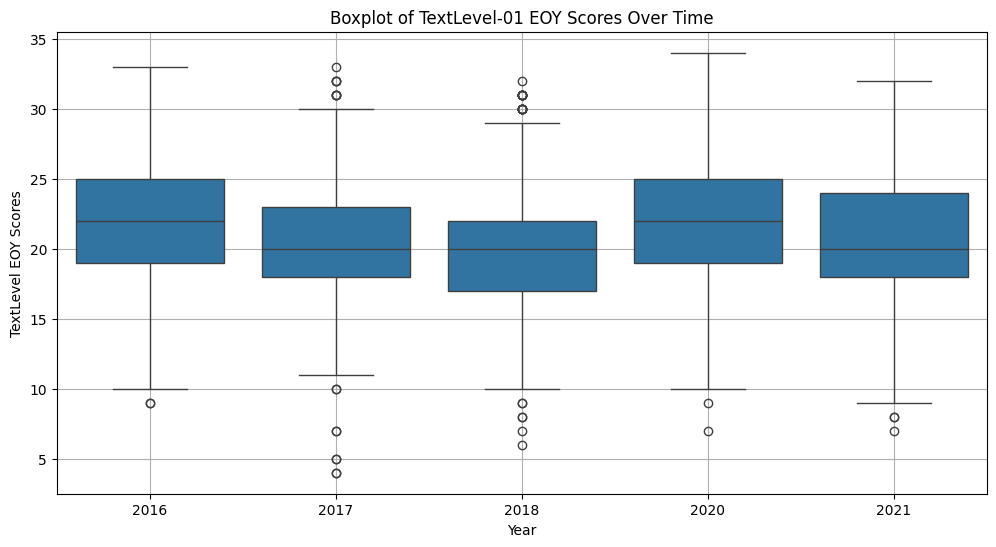

In [ ]:
# Create a DataFrame with the relevant columns
textlevel_data = records[['TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, MOY, EOY), 'Value' (TextLevel scores), and 'Year_02'
textlevel_data_melted = pd.melt(textlevel_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'TextLevel-01-SOY', 'TextLevel-01-MOY', 'TextLevel-01-EOY' for clarity
textlevel_data_melted['Time'] = textlevel_data_melted['Time'].replace({
    'TextLevel-01-SOY': 'SOY',
    'TextLevel-01-MOY': 'MOY',
    'TextLevel-01-EOY': 'EOY'
})

# Filter the data for each time point: SOY, MOY, EOY
soy_data = textlevel_data_melted[textlevel_data_melted['Time'] == 'SOY']
moy_data = textlevel_data_melted[textlevel_data_melted['Time'] == 'MOY']
eoy_data = textlevel_data_melted[textlevel_data_melted['Time'] == 'EOY']

# Create the box plot for SOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=soy_data)
plt.title('Boxplot of TextLevel-01 SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel SOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for MOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=moy_data)
plt.title('Boxplot of TextLevel-01 MOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel MOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for EOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=eoy_data)
plt.title('Boxplot of TextLevel-01 EOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel EOY Scores')
plt.grid(True)
plt.show()

#### TextLevel-02 Trend

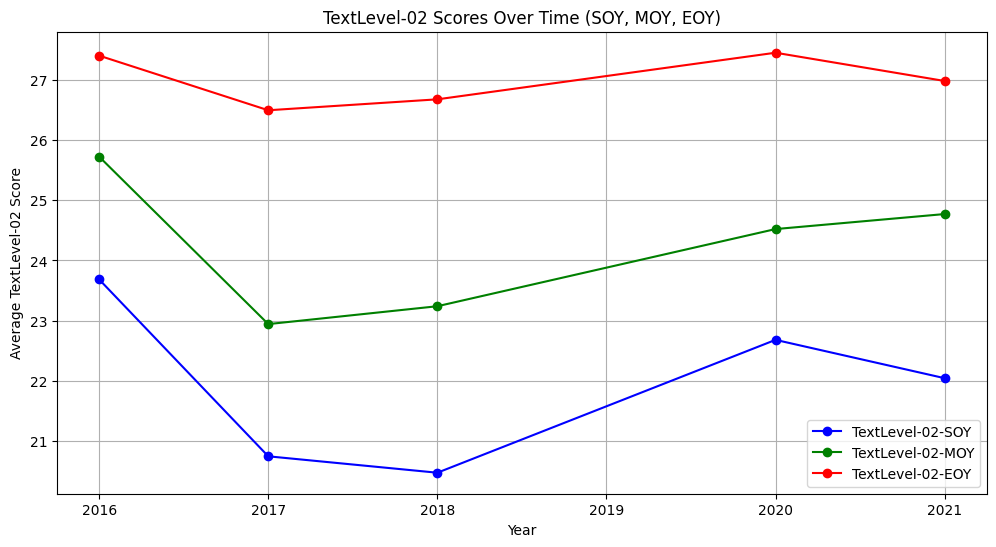

In [ ]:
# Group by 'Year_02' and calculate the mean for 'TextLevel-02-SOY', 'TextLevel-02-MOY', and 'TextLevel-02-EOY'
textlevel_02_over_time = records.groupby('Year_02')[['TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY']].mean()

# Create a line chart for TextLevel-01-SOY, TextLevel-01-MOY, and TextLevel-01-EOY over time
plt.figure(figsize=(12, 6))

# Plot TextLevel-02-SOY
plt.plot(textlevel_02_over_time.index, textlevel_02_over_time['TextLevel-02-SOY'], marker='o', linestyle='-', color='b', label='TextLevel-02-SOY')

# Plot TextLevel-02-MOY
plt.plot(textlevel_02_over_time.index, textlevel_02_over_time['TextLevel-02-MOY'], marker='o', linestyle='-', color='g', label='TextLevel-02-MOY')

# Plot TextLevel-02-EOY
plt.plot(textlevel_02_over_time.index, textlevel_02_over_time['TextLevel-02-EOY'], marker='o', linestyle='-', color='r', label='TextLevel-02-EOY')

# Add title and labels
plt.title('TextLevel-02 Scores Over Time (SOY, MOY, EOY)')
plt.xlabel('Year')
plt.ylabel('Average TextLevel-02 Score')

# Add legend to distinguish between SOY, MOY, and EOY
plt.legend()

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


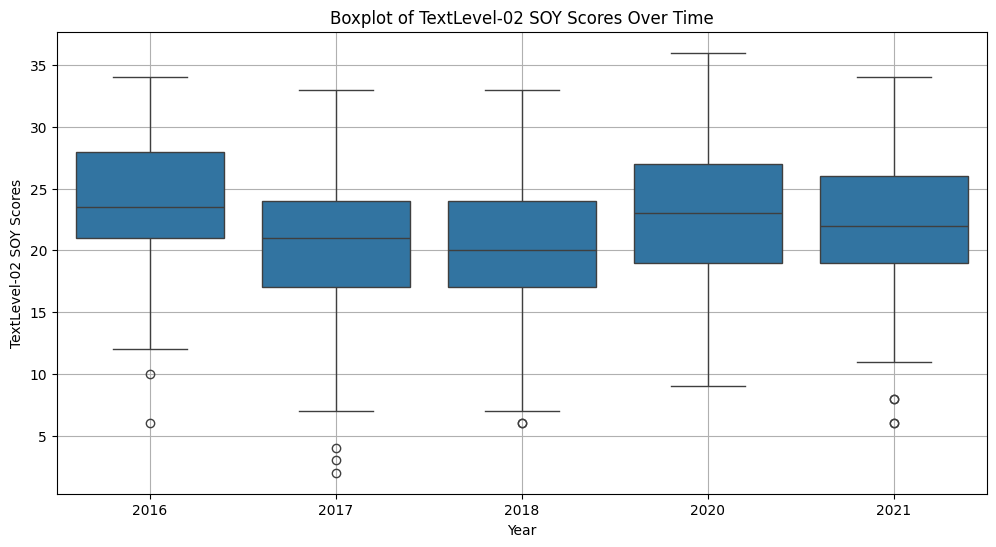

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


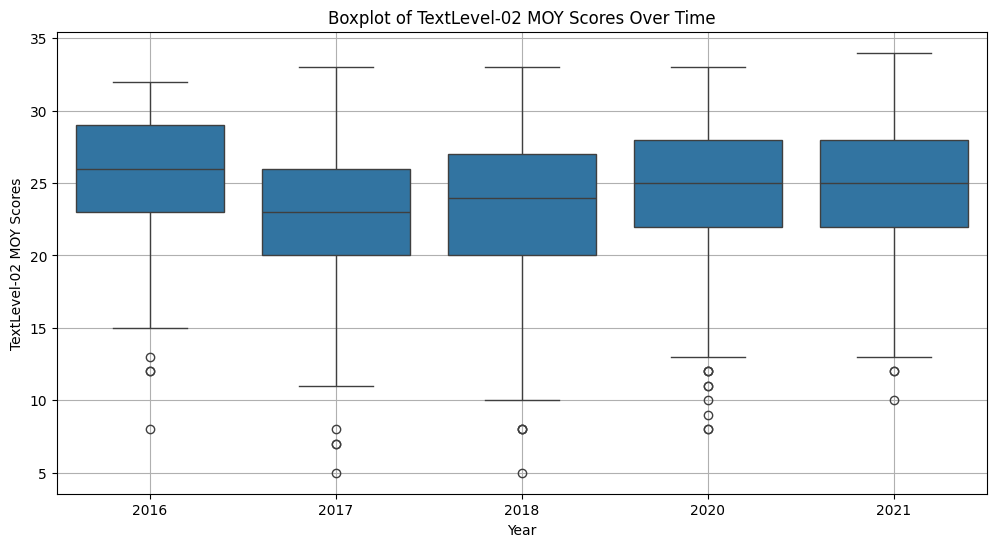

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


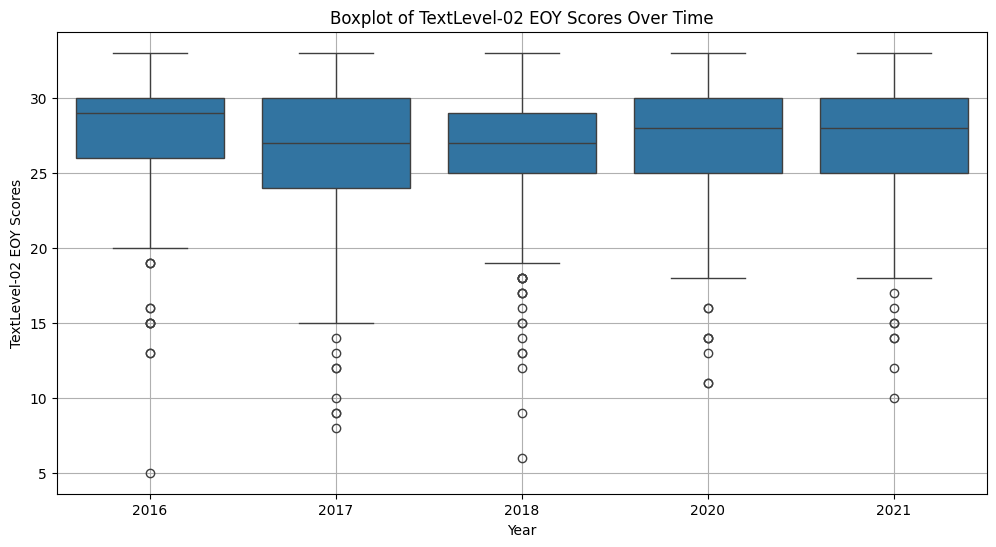

In [ ]:
# Create a DataFrame with the relevant columns for TextLevel-02
textlevel_2_data = records[['TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY', 'Year_02']]

# Melt the DataFrame to have 'Time' (SOY, MOY, EOY), 'Value' (TextLevel scores), and 'Year_02'
textlevel_2_data_melted = pd.melt(textlevel_2_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'TextLevel-02-SOY', 'TextLevel-02-MOY', 'TextLevel-02-EOY' for clarity
textlevel_2_data_melted['Time'] = textlevel_2_data_melted['Time'].replace({
    'TextLevel-02-SOY': 'SOY',
    'TextLevel-02-MOY': 'MOY',
    'TextLevel-02-EOY': 'EOY'
})

# Filter the data for each time point: SOY, MOY, EOY
soy_data_2 = textlevel_2_data_melted[textlevel_2_data_melted['Time'] == 'SOY']
moy_data_2 = textlevel_2_data_melted[textlevel_2_data_melted['Time'] == 'MOY']
eoy_data_2 = textlevel_2_data_melted[textlevel_2_data_melted['Time'] == 'EOY']

# Create the box plot for SOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=soy_data_2)
plt.title('Boxplot of TextLevel-02 SOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel-02 SOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for MOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=moy_data_2)
plt.title('Boxplot of TextLevel-02 MOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel-02 MOY Scores')
plt.grid(True)
plt.show()

# Create the box plot for EOY over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=eoy_data_2)
plt.title('Boxplot of TextLevel-02 EOY Scores Over Time')
plt.xlabel('Year')
plt.ylabel('TextLevel-02 EOY Scores')
plt.grid(True)
plt.show()

#### Counting Trend

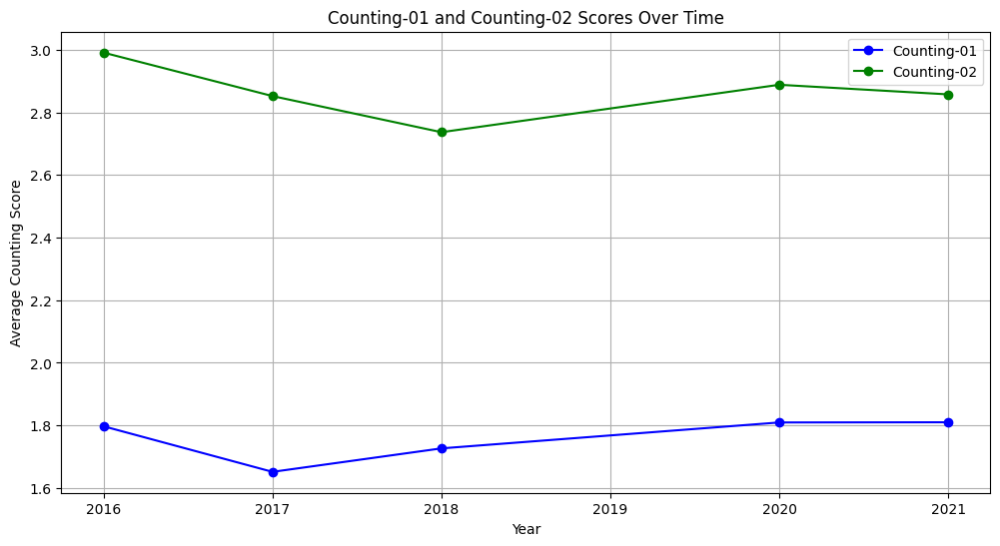

In [ ]:
# Group by 'Year_02' and calculate the mean for 'Counting-01' and 'Counting-02'
counting_over_time = records.groupby('Year_02')[['Counting-01', 'Counting-02']].mean()

# Create a line chart for Counting-01 and Counting-02 over time
plt.figure(figsize=(12, 6))

# Plot Counting-01
plt.plot(counting_over_time.index, counting_over_time['Counting-01'], marker='o', linestyle='-', color='b', label='Counting-01')

# Plot Counting-02
plt.plot(counting_over_time.index, counting_over_time['Counting-02'], marker='o', linestyle='-', color='g', label='Counting-02')

# Add title and labels
plt.title('Counting-01 and Counting-02 Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Average Counting Score')

# Add legend to distinguish between Counting-01 and Counting-02
plt.legend()

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


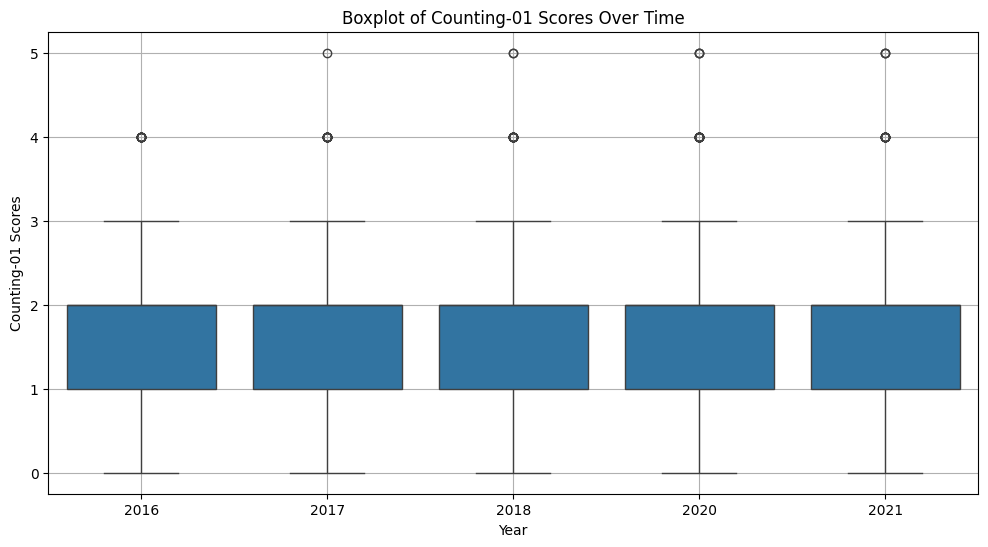

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


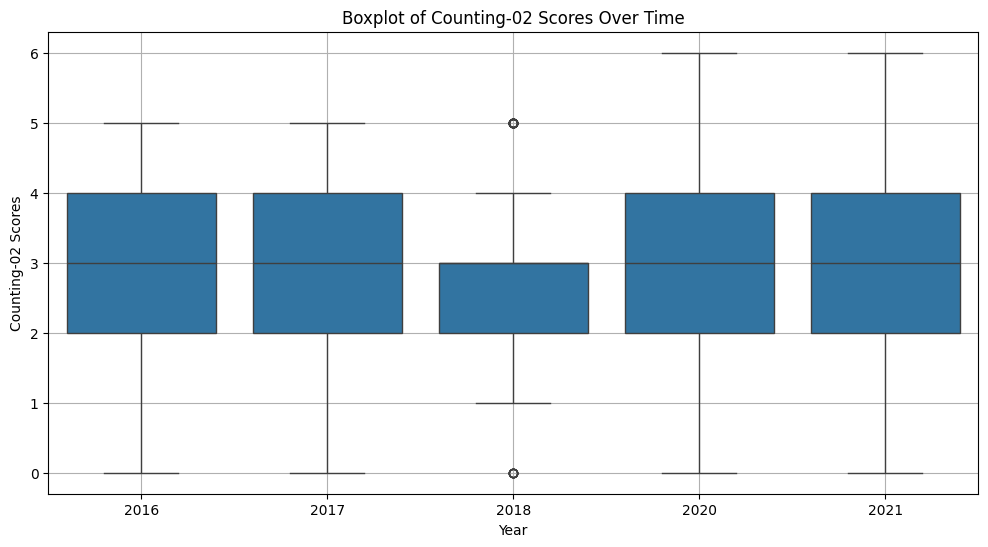

In [ ]:
# Create a DataFrame with the relevant columns for Counting-01 and Counting-02
counting_data = records[['Counting-01', 'Counting-02', 'Year_02']]

# Melt the DataFrame to have 'Counting Type' (Counting-01, Counting-02), 'Value' (Counting scores), and 'Year_02'
counting_data_melted = pd.melt(counting_data, id_vars='Year_02', var_name='Counting_Type', value_name='Value')

# Rename 'Counting-01' and 'Counting-02' for clarity
counting_data_melted['Counting_Type'] = counting_data_melted['Counting_Type'].replace({
    'Counting-01': 'Counting-01',
    'Counting-02': 'Counting-02'
})

# Filter the data for Counting-01 and Counting-02
counting_01_data = counting_data_melted[counting_data_melted['Counting_Type'] == 'Counting-01']
counting_02_data = counting_data_melted[counting_data_melted['Counting_Type'] == 'Counting-02']

# Create the box plot for Counting-01 over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=counting_01_data)
plt.title('Boxplot of Counting-01 Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Counting-01 Scores')
plt.grid(True)
plt.show()

# Create the box plot for Counting-02 over time
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', data=counting_02_data)
plt.title('Boxplot of Counting-02 Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Counting-02 Scores')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future ve

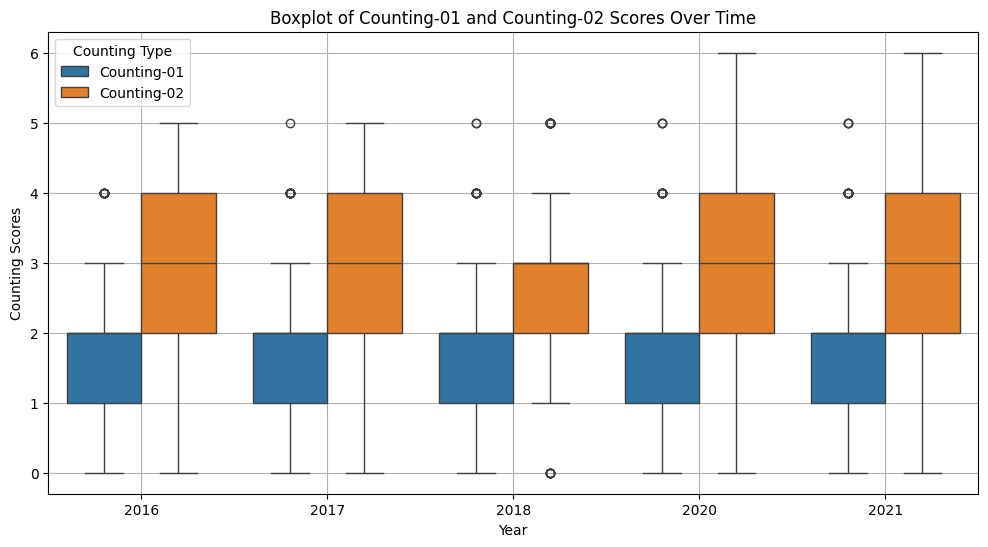

In [ ]:
# Create a DataFrame with the relevant columns for Counting-01 and Counting-02
counting_data = records[['Counting-01', 'Counting-02', 'Year_02']]

# Melt the DataFrame to have 'Time' (Counting-01, Counting-02), 'Value' (Counting scores), and 'Year_02'
counting_data_melted = pd.melt(counting_data, id_vars='Year_02', var_name='Time', value_name='Value')

# Rename 'Counting-01' and 'Counting-02' for clarity
counting_data_melted['Time'] = counting_data_melted['Time'].replace({
    'Counting-01': 'Counting-01',
    'Counting-02': 'Counting-02'
})

# Draw the box plot for Counting scores with 'Year_02' on the x-axis and 'Value' on the y-axis, with 'Time' as the hue
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year_02', y='Value', hue='Time', data=counting_data_melted)

# Add title and labels
plt.title('Boxplot of Counting-01 and Counting-02 Scores Over Time')
plt.xlabel('Year')
plt.ylabel('Counting Scores')

# Add legend to distinguish between Counting-01 and Counting-02
plt.legend(title='Counting Type')

# Add grid for better readability
plt.grid(True)

# Display the plot
plt.show()

#### Disability and NCCD-Funded Combined Impact on Writing at Risk

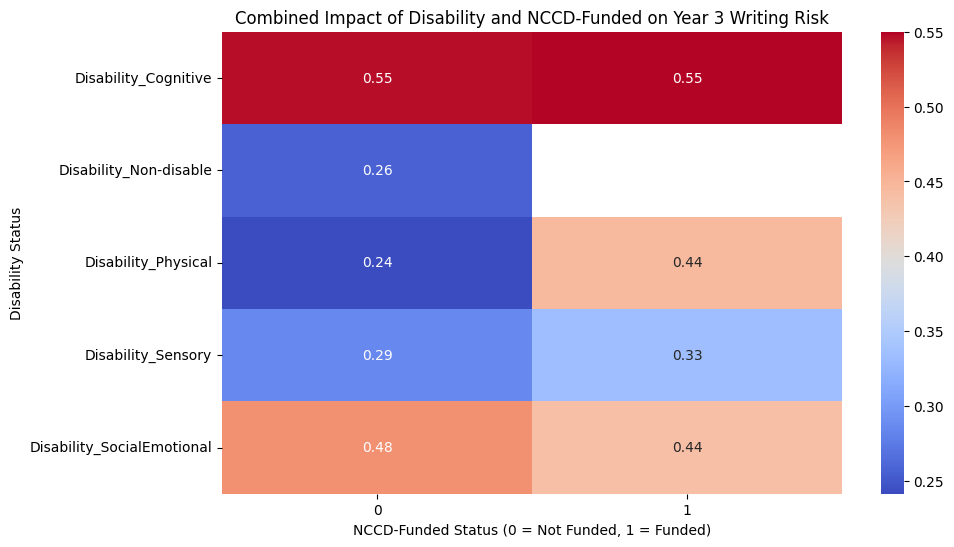

In [ ]:
# Group the data by Disability and NCCD-Funded status, and calculate the mean of Year3_Writing_At_Risk
disability_nccd_risk = records.groupby(['Disability', 'NCCD-Funded'])['Year3_Writing_At_Risk'].mean().reset_index()

# Pivot the data for heatmap plotting
disability_nccd_risk_pivot = disability_nccd_risk.pivot(index='Disability', columns='NCCD-Funded', values='Year3_Writing_At_Risk')

# Create a heatmap to visualize the impact
plt.figure(figsize=(10, 6))
sns.heatmap(disability_nccd_risk_pivot, annot=True, cmap='coolwarm', cbar=True)

# Add title and labels
plt.title('Combined Impact of Disability and NCCD-Funded on Year 3 Writing Risk')
plt.xlabel('NCCD-Funded Status (0 = Not Funded, 1 = Funded)')
plt.ylabel('Disability Status')

# Display the plot
plt.show()

## 3. Model Building

### 3.1. Logistic Regression Model

#### Feature and Target Selection

In [ ]:
# Selecting predictors
features = [
    'Burt-01-SOY', 'Clay-01-EOY', 'TextLevel-01-MOY',
    'TextLevel-02-SOY', 'TextLevel-02-EOY', 'WritingVocab-01-SOY',
    'HRSIW-01-SOY', 'Counting-01', 'Counting-02',
    'Place Value-01', 'Disability_Cognitive'
    ]

# Specify X and y
X = records[features]
y = records.year3_writing_at_risk


#### Split Data

In [ ]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=1)

In [ ]:
# Inspect the split datasets
print(X_train.info())
print(X_test.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1599 entries, 1965 to 1979
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Burt-01-SOY           1599 non-null   int64
 1   Clay-01-EOY           1599 non-null   int64
 2   TextLevel-01-MOY      1599 non-null   int64
 3   TextLevel-02-SOY      1599 non-null   int64
 4   TextLevel-02-EOY      1599 non-null   int64
 5   WritingVocab-01-SOY   1599 non-null   int64
 6   HRSIW-01-SOY          1599 non-null   int64
 7   Counting-01           1599 non-null   int64
 8   Counting-02           1599 non-null   int64
 9   Place Value-01        1599 non-null   int64
 10  Disability_Cognitive  1599 non-null   int64
dtypes: int64(11)
memory usage: 149.9 KB
None
<class 'pandas.core.frame.DataFrame'>
Index: 400 entries, 613 to 1835
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Burt-0

#### Logistic Model Building, Train and Make Predictions

In [ ]:
# Create an initial Logistic Regression model
logreg = LogisticRegression(max_iter=100)

In [ ]:
# Complete the code to train Logistic Regression Classifer with the traning dataset
logreg = logreg.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Complete the code to make predictions for the test dataset
y_pred = logreg.predict(X_test)

Inspect Predictions

In [ ]:
# Join unseen y_test with predicted value into a data frame
inspection=pd.DataFrame({'Actual':y_test, 'Predicted':y_pred})

# Join X_test with the new dataframe
inspection=pd.concat([X_test,inspection], axis=1)

inspection.head(20)

,Burt-01-SOY,Clay-01-EOY,TextLevel-01-MOY,TextLevel-02-SOY,TextLevel-02-EOY,WritingVocab-01-SOY,HRSIW-01-SOY,Counting-01,Counting-02,Place Value-01,Disability_Cognitive,Actual,Predicted
613,15,16,12,17,22,16,19,0,2,0,1,1,1
1257,21,0,16,20,25,14,27,2,3,1,0,0,0
1237,44,3,26,28,29,35,34,3,4,2,0,0,0
1791,30,0,16,22,30,23,43,2,4,1,0,0,0
1532,9,0,7,16,25,13,37,1,2,1,1,1,1
1060,11,18,7,19,24,16,37,1,3,1,0,1,0
1819,21,4,12,25,29,23,27,2,3,0,0,0,0
496,29,1,16,22,29,30,34,2,3,1,0,1,0
793,6,12,17,25,29,11,25,2,2,1,0,0,0
912,10,14,9,18,26,7,12,1,2,1,1,1,1


#### Model Performance Evaluation

Calculate Accuracy, Precision, Recall, F1

In [ ]:
# Call metrics functions: Accuracy, Precision, Recall, F1 using the parameters y_test and y_pred
print("Accuracy: ", metrics.accuracy_score(y_test,y_pred))
print("Precision: ", metrics.precision_score(y_test,y_pred))
print("Recall: ", metrics.recall_score(y_test,y_pred))
print("F1: ", metrics.f1_score(y_test,y_pred))

Accuracy:  0.7475
Precision:  0.6568627450980392
Recall:  0.5037593984962406
F1:  0.5702127659574469


Interpret the above

In [ ]:
# Print confusion matrix and evaluation report
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(classification_report(y_test, y_pred))

[[232  35]
 [ 66  67]]
              precision    recall  f1-score   support

           0       0.78      0.87      0.82       267
           1       0.66      0.50      0.57       133

    accuracy                           0.75       400
   macro avg       0.72      0.69      0.70       400
weighted avg       0.74      0.75      0.74       400



ROC curve and confusion matrix

In [ ]:
# First get the probabilities of the classes on the test set
probabilities = logreg.predict_proba(X_test)

In [ ]:
# Now get the probabilities for the positive class (True)
y_prob = probabilities[:, 1]

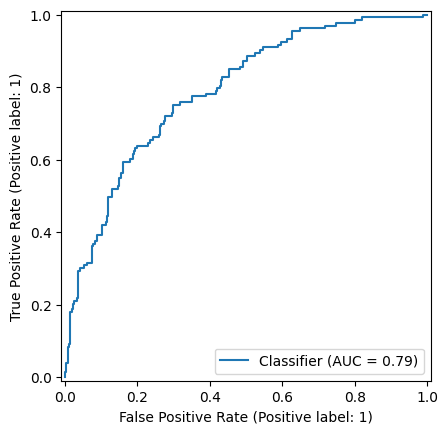

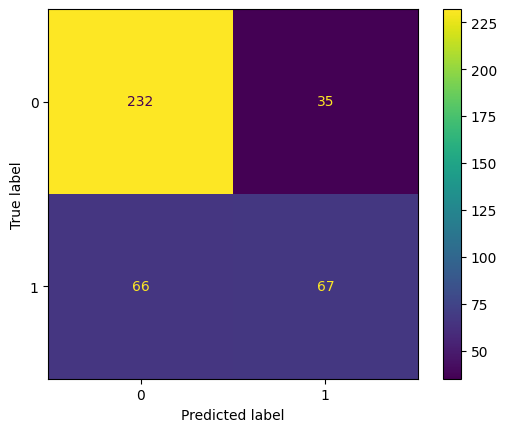

In [ ]:
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import ConfusionMatrixDisplay

# Display RocCurve and Confusion Matrix
RocCurveDisplay.from_predictions(y_test, y_prob)
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
plt.show()

Axes(0.125,0.11;0.775x0.77)


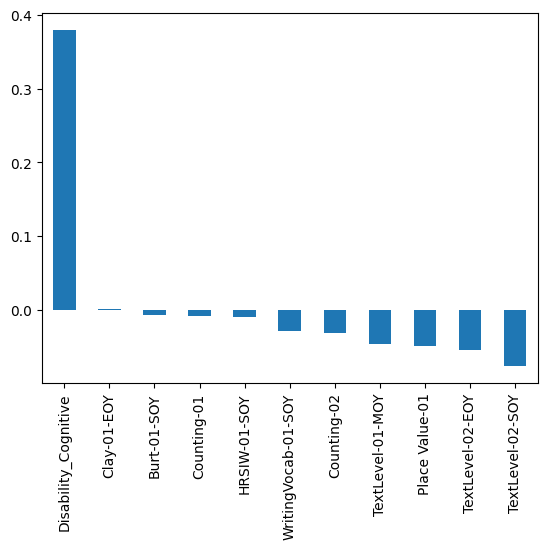

In [ ]:
# Visualise the coefficients
coefs = pd.Series(logreg.coef_[0], index=X.columns.values)
print (coefs.sort_values(ascending = False).plot(kind='bar'))

In [ ]:
# Calculate the corresponding y values using the model coefficients
coef = logreg.coef_.flatten()
intercept = logreg.intercept_
# Create a DataFrame with predictors and their corresponding coefficients
coef_df = pd.DataFrame({'Predictor': X.columns, 'Coefficient': coef})
# Print the DataFrame
print(coef_df)
print(intercept)

               Predictor  Coefficient
0            Burt-01-SOY    -0.006878
1            Clay-01-EOY     0.000942
2       TextLevel-01-MOY    -0.046593
3       TextLevel-02-SOY    -0.076131
4       TextLevel-02-EOY    -0.053802
5    WritingVocab-01-SOY    -0.028571
6           HRSIW-01-SOY    -0.009934
7            Counting-01    -0.007694
8            Counting-02    -0.030744
9         Place Value-01    -0.048489
10  Disability_Cognitive     0.379213
[4.06810946]


#### K-fold Cross Validation

In [ ]:
#Import cross validation function
from sklearn.model_selection import cross_val_score

In [ ]:
# Calculate the 95% confidence interval of the mean F1 score
def get_95ci(metric):
  n = len(metric)
  se = metric.std() / np.sqrt(n)
  t=2.262  # t-value for 95% CI
  ci = t * se
  return ci

In [ ]:
# Create a new Logistic Model
logreg1 = LogisticRegression(max_iter=100)

# Perform 10-fold cross-validation
accuracy = cross_val_score(logreg1, X, y, cv=10)
f1 = cross_val_score(logreg1, X, y, cv=10, scoring='f1')
precision = cross_val_score(logreg1, X, y, cv=10, scoring='precision')
recall = cross_val_score(logreg1, X, y, cv=10, scoring='recall')

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

In [ ]:
# Print the mean accuracy and F1 scores with their 95% confidence intervals
print("Accuracy scores: %0.3f (+/- %0.3f)" % (accuracy.mean(), get_95ci(accuracy)))
print("F1 scores: %0.3f (+/- %0.3f)" % (f1.mean(), get_95ci(f1)))
print("Precision: %0.3f (+/- %0.3f)" % (precision.mean(), get_95ci(precision)))
print("Recall:  %0.3f (+/- %0.3f)"  % (recall.mean(), get_95ci(recall)))


Accuracy scores: 0.733 (+/- 0.011)
F1 scores: 0.521 (+/- 0.029)
Precision: 0.648 (+/- 0.023)
Recall:  0.437 (+/- 0.035)


In [ ]:
get_95ci(accuracy)

0.010555838567416478

In [ ]:
accuracy

array([0.705     , 0.74      , 0.725     , 0.735     , 0.76      ,
       0.745     , 0.735     , 0.745     , 0.72      , 0.72361809])

In [ ]:
f1

array([0.4587156 , 0.52727273, 0.52173913, 0.53913043, 0.60655738,
       0.54054054, 0.52252252, 0.53211009, 0.49090909, 0.46601942])

### 3.2. k-NN Classifier

#### Feature and Target Selection

In [ ]:
X_kNN = records.select_dtypes(include=['int64', 'float64']).drop(columns=['year3_writing_at_risk'])
y_kNN=records['year3_writing_at_risk']

#### Split Data

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train_kNN, X_test_kNN, y_train_kNN, y_test_kNN = train_test_split(X_kNN, y_kNN, test_size=0.2, stratify = y_kNN, random_state=2023 )

#### Data Normalisation/Scaling

In [ ]:
#import scaler
from sklearn.preprocessing import MinMaxScaler

In [ ]:
# Scaling the features using MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler on the training data
X_train_scaled_kNN = scaler.fit_transform(X_train_kNN)

# Transform the test data using the same scaler
X_test_scaled_kNN = scaler.transform(X_test_kNN)

#### kNN Classifier Model Building

In [ ]:
from sklearn.neighbors import KNeighborsClassifier #Import KNN classifier class
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import ConfusionMatrixDisplay

In [ ]:
# Train a KNN model
k = 15
knn = KNeighborsClassifier(n_neighbors=k, p=2)

#Fit the knn with scaled X_train_kNN and y_train_kNN
knn.fit(X_train_scaled_kNN, y_train_kNN)

##write your code to make predictions on the SCALED testing set
y_pred_kNN = knn.predict(X_test_scaled_kNN)

#### Model Performance Evaluation

Classification Report

In [ ]:
# Print the classification report
print(confusion_matrix(y_test_kNN, y_pred_kNN))
print(classification_report(y_test_kNN, y_pred_kNN))

[[235  32]
 [ 74  59]]
              precision    recall  f1-score   support

           0       0.76      0.88      0.82       267
           1       0.65      0.44      0.53       133

    accuracy                           0.73       400
   macro avg       0.70      0.66      0.67       400
weighted avg       0.72      0.73      0.72       400



In [ ]:
#get predicted probabilities for the main class
y_pred_kNN_probs_norm = knn.predict_proba(X_test_scaled_kNN)
y_pred_kNN_probs_norm = y_pred_kNN_probs_norm[:, 1]
print(y_pred_kNN_probs_norm)

[0.         0.66666667 0.26666667 0.06666667 0.53333333 0.2
 0.06666667 0.06666667 0.6        0.06666667 0.33333333 0.4
 0.2        0.06666667 0.6        0.         0.13333333 0.06666667
 0.66666667 0.33333333 0.53333333 0.53333333 0.26666667 0.6
 0.26666667 0.26666667 0.06666667 0.4        0.66666667 0.6
 0.06666667 0.2        0.46666667 0.06666667 0.06666667 0.
 0.2        0.06666667 0.4        0.2        0.33333333 0.26666667
 0.46666667 0.4        0.33333333 0.46666667 0.46666667 0.13333333
 0.26666667 0.26666667 0.         0.6        0.06666667 0.6
 0.06666667 0.33333333 0.06666667 0.46666667 0.13333333 0.53333333
 0.2        0.4        0.         0.13333333 0.4        0.2
 0.8        0.73333333 0.13333333 0.46666667 0.53333333 0.6
 0.4        0.06666667 0.2        0.6        0.06666667 0.46666667
 0.73333333 0.66666667 0.33333333 0.4        0.53333333 0.2
 0.6        0.6        0.06666667 0.2        0.33333333 0.06666667
 0.46666667 0.4        0.4        0.6        0.33333333 0.5

ROC Curve and AUC

AUC: 0.739


<Axes: >

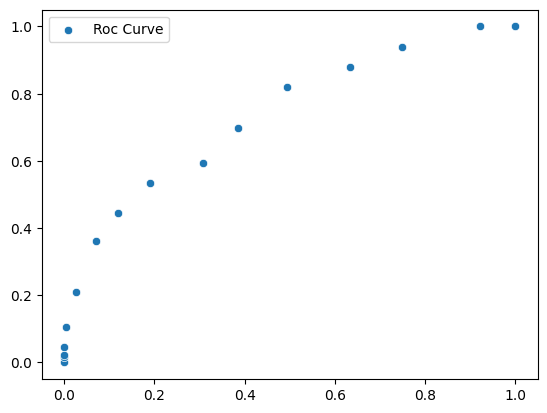

In [ ]:
#get fpr and tpr and plot the ROC curve
from sklearn.metrics import roc_curve, roc_auc_score

fpr, tpr, thresholds = roc_curve(y_test_kNN, y_pred_kNN_probs_norm)
print('AUC:', '%.3f' % metrics.auc(fpr, tpr))
sns.scatterplot(x=fpr, y=tpr, label='Roc Curve')

In [ ]:
inspection1=pd.DataFrame({'Actual':y_test_kNN, 'Predicted':y_pred_kNN, 'Probability':y_pred_kNN_probs_norm})
inspection1.head(10)

,Actual,Predicted,Probability
1702,0,0,0.000000
958,0,1,0.666667
411,0,0,0.266667
1277,0,0,0.066667
1517,0,1,0.533333
1736,0,0,0.200000
264,0,0,0.066667
1598,0,0,0.066667
1611,1,1,0.600000
1712,0,0,0.066667


#### Find The Best Threshold

In [ ]:
from sklearn.metrics import f1_score
# Find the best threshold based on F1 score
f1 = []
for threshold in thresholds:
    y_pred_t_kNN = [1 if prob >= threshold else 0 for prob in y_pred_kNN_probs_norm]
    f1.append(f1_score(y_test_kNN, y_pred_t_kNN))
best_threshold = thresholds[f1.index(max(f1))]

print(best_threshold)

0.26666666666666666


In [ ]:
#get predicted probabilities for best threshold
y_pred_best_kNN = (y_pred_kNN_probs_norm >= best_threshold).astype(bool)

print(y_pred_best_kNN)

[False  True  True False  True False False False  True False  True  True
 False False  True False False False  True  True  True  True  True  True
  True  True False  True  True  True False False  True False False False
 False False  True False  True  True  True  True  True  True  True False
  True  True False  True False  True False  True False  True False  True
 False  True False False  True False  True  True False  True  True  True
  True False False  True False  True  True  True  True  True  True False
  True  True False False  True False  True  True  True  True  True  True
  True  True False  True  True False False False False  True  True  True
  True  True False False  True  True  True False False  True False  True
  True  True False False False  True  True False False  True  True  True
  True  True False False  True  True  True False  True False False False
 False False  True  True False  True False False  True  True False  True
  True False  True False False False False False  T

In [ ]:
print(confusion_matrix(y_test_kNN, y_pred_best_kNN))
print(classification_report(y_test_kNN, y_pred_best_kNN))

[[135 132]
 [ 24 109]]
              precision    recall  f1-score   support

           0       0.85      0.51      0.63       267
           1       0.45      0.82      0.58       133

    accuracy                           0.61       400
   macro avg       0.65      0.66      0.61       400
weighted avg       0.72      0.61      0.62       400



In [ ]:
print(confusion_matrix(y_test_kNN, y_pred_kNN))
print(classification_report(y_test_kNN, y_pred_kNN))

[[235  32]
 [ 74  59]]
              precision    recall  f1-score   support

           0       0.76      0.88      0.82       267
           1       0.65      0.44      0.53       133

    accuracy                           0.73       400
   macro avg       0.70      0.66      0.67       400
weighted avg       0.72      0.73      0.72       400



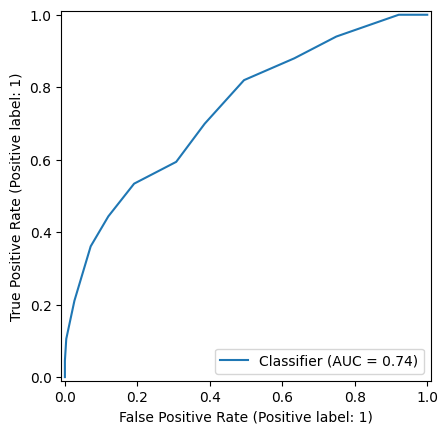

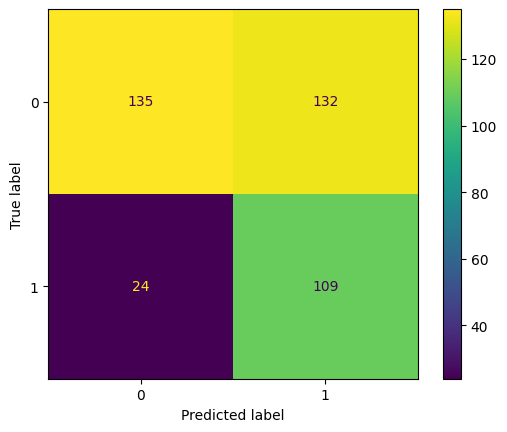

In [ ]:
#import classes to display RocCurve and Confusion Matrix
from sklearn.metrics import ConfusionMatrixDisplay

RocCurveDisplay.from_predictions(y_test_kNN, y_pred_kNN_probs_norm)
ConfusionMatrixDisplay.from_predictions(y_test_kNN, y_pred_best_kNN)
plt.show()

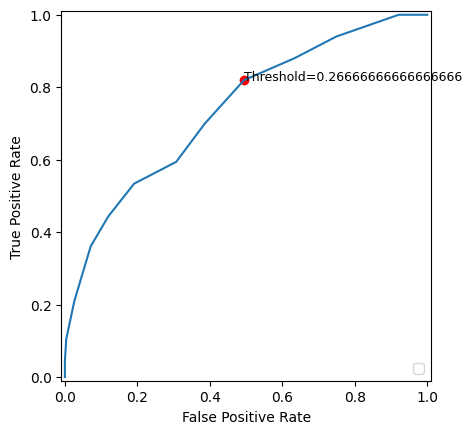

In [ ]:
# Compute the ROC curve
fpr, tpr, roc_thresholds = roc_curve(y_test_kNN, y_pred_kNN_probs_norm)

# Find the index of the threshold that corresponds to the best threshold
best_threshold_idx = (abs(roc_thresholds - best_threshold)).argmin()

# Plot the ROC curve
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()
plt.scatter(fpr[best_threshold_idx], tpr[best_threshold_idx], color='red') # Mark the best threshold
plt.text(fpr[best_threshold_idx], tpr[best_threshold_idx], f'Threshold={best_threshold}', fontsize=9)
plt.show()

Model Comparison

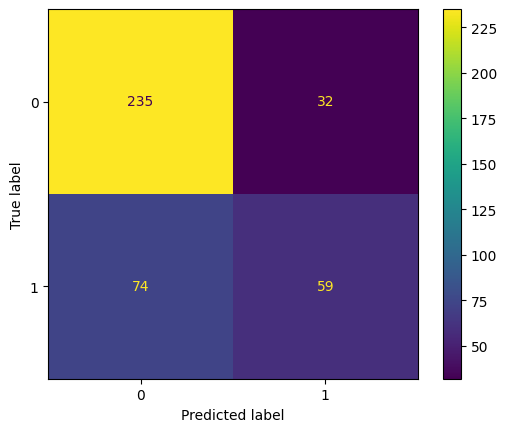

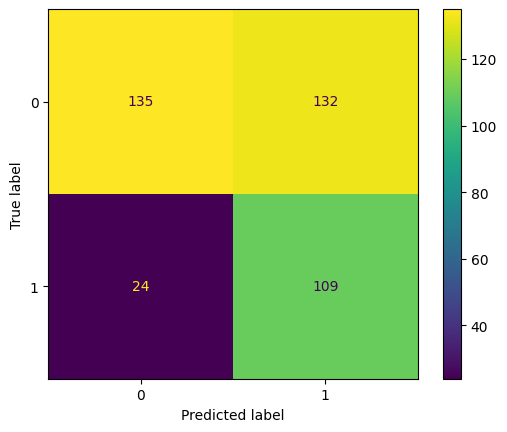

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_kNN, y_pred_kNN)
ConfusionMatrixDisplay.from_predictions(y_test_kNN, y_pred_best_kNN)
plt.show()

In [ ]:
#Model evaluation
print("Accuracy: ", '%.3f' % metrics.accuracy_score(y_test_kNN,y_pred_kNN))
print("Precision: ", '%.3f' % metrics.precision_score(y_test_kNN,y_pred_kNN))
print("Recall: ", '%.3f' % metrics.recall_score(y_test_kNN,y_pred_kNN))
print("F1: ", '%.3f' % metrics.f1_score(y_test_kNN,y_pred_kNN))

Accuracy:  0.735
Precision:  0.648
Recall:  0.444
F1:  0.527


In [ ]:
#Model evaluation
print("Accuracy: ", '%.3f' % metrics.accuracy_score(y_test_kNN,y_pred_best_kNN))
print("Precision: ", '%.3f' % metrics.precision_score(y_test_kNN,y_pred_best_kNN))
print("Recall: ", '%.3f' % metrics.recall_score(y_test_kNN,y_pred_best_kNN))
print("F1: ", '%.3f' % metrics.f1_score(y_test_kNN,y_pred_best_kNN))

Accuracy:  0.610
Precision:  0.452
Recall:  0.820
F1:  0.583


#### k Optimisation

Best k value: 13
Best F1 score: 0.533
Accuracy for Best F1 score: 0.733


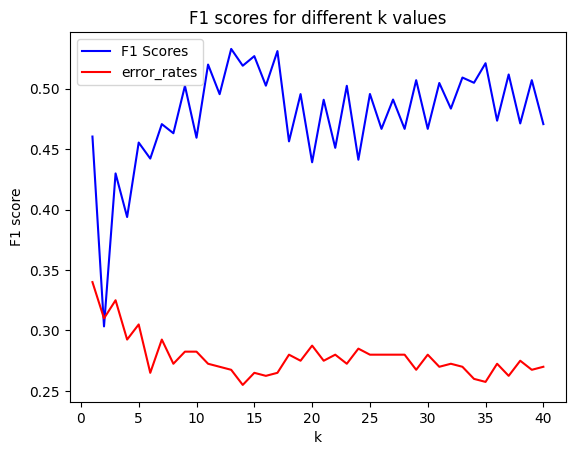

In [ ]:
# Define a list of k values to test
k_values = list(range(1, 41))

# Train and evaluate KNN classifiers with different k values
best_k=0
best_f1=0
best_accuracy=0
f1_scores = []
# Initialize error_rates list
error_rates = []
f1 = 0
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled_kNN, y_train_kNN)
    y_pred_k=knn.predict(X_test_scaled_kNN)
    f1 = metrics.f1_score(y_test_kNN, y_pred_k)
    f1_scores.append(f1)
    accuracy_k=metrics.accuracy_score(y_test_kNN, y_pred_k)
    # Calculate and store error rate for current k
    error_rate = 1 - accuracy_k
    error_rates.append(error_rate)
    if ((f1 > best_f1) ):
        best_k = k
        best_f1 = f1
        best_accuracy = metrics.accuracy_score(y_test_kNN,y_pred_k)

# Find the best k value with highest f1 score
#best_k = k_values[np.argmax(accuracy_scores)]
print(f"Best k value: {best_k}")
print(f"Best F1 score: {best_f1:.3f}")
print(f"Accuracy for Best F1 score: {best_accuracy:.3f}")

# Plot k values against f1 scores
#plt.plot(k_values, accuracy_scores, color='red')
plt.xlabel('k')
plt.ylabel('F1 score')
plt.title('F1 scores for different k values')
plt.plot(k_values, f1_scores, color='blue', label='F1 Scores')
plt.plot(k_values, error_rates, color='red', label='error_rates')
plt.legend()
plt.show()

#### kNN Classifier Model Building With Optimized k

In [ ]:
# Train a KNN model
k = 13
knn_bestk = KNeighborsClassifier(n_neighbors=k, p=2)

#Fit the knn with scaled X_train_kNN and y_train_kNN
knn_bestk.fit(X_train_scaled_kNN, y_train_kNN)

##write your code to make predictions on the SCALED testing set
y_pred_bestk_kNN = knn_bestk.predict(X_test_scaled_kNN)

Model Evaluation

In [ ]:
# Print the classification report
print(confusion_matrix(y_test_kNN, y_pred_bestk_kNN))
print(classification_report(y_test_kNN, y_pred_bestk_kNN))

[[232  35]
 [ 72  61]]
              precision    recall  f1-score   support

           0       0.76      0.87      0.81       267
           1       0.64      0.46      0.53       133

    accuracy                           0.73       400
   macro avg       0.70      0.66      0.67       400
weighted avg       0.72      0.73      0.72       400



In [ ]:
#get predicted probabilities for the main class
y_pred_probs_bestk = knn_bestk.predict_proba(X_test_scaled_kNN)
y_pred_probs_bestk = y_pred_probs_bestk[:, 1]
print(y_pred_probs_bestk)

[0.         0.69230769 0.30769231 0.07692308 0.53846154 0.23076923
 0.07692308 0.07692308 0.61538462 0.07692308 0.30769231 0.30769231
 0.23076923 0.07692308 0.53846154 0.         0.15384615 0.07692308
 0.69230769 0.38461538 0.53846154 0.53846154 0.30769231 0.69230769
 0.30769231 0.15384615 0.07692308 0.38461538 0.69230769 0.53846154
 0.07692308 0.23076923 0.38461538 0.         0.07692308 0.
 0.23076923 0.07692308 0.46153846 0.23076923 0.38461538 0.23076923
 0.46153846 0.46153846 0.38461538 0.46153846 0.53846154 0.15384615
 0.23076923 0.23076923 0.         0.53846154 0.07692308 0.61538462
 0.         0.30769231 0.07692308 0.46153846 0.15384615 0.61538462
 0.15384615 0.46153846 0.         0.07692308 0.46153846 0.15384615
 0.76923077 0.76923077 0.15384615 0.46153846 0.53846154 0.69230769
 0.38461538 0.07692308 0.23076923 0.61538462 0.07692308 0.53846154
 0.69230769 0.69230769 0.38461538 0.38461538 0.53846154 0.23076923
 0.61538462 0.61538462 0.07692308 0.23076923 0.38461538 0.07692308
 0.

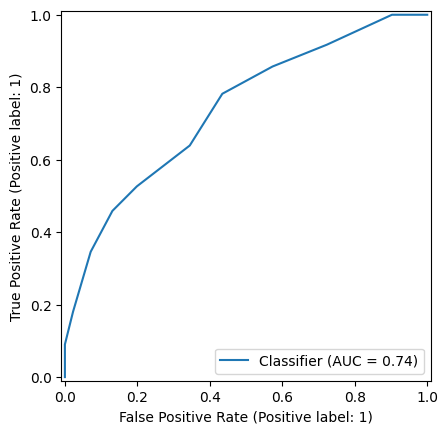

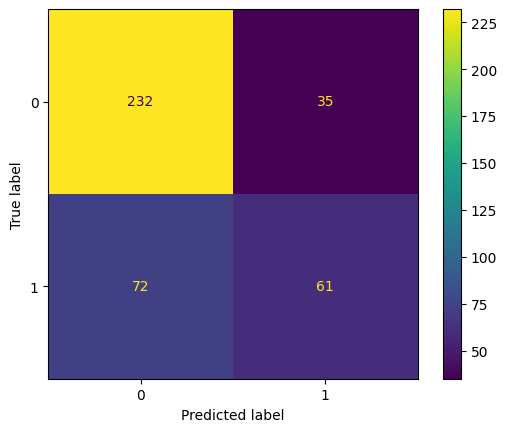

In [ ]:
RocCurveDisplay.from_predictions(y_test_kNN, y_pred_probs_bestk)
ConfusionMatrixDisplay.from_predictions(y_test_kNN, y_pred_bestk_kNN)
plt.show()

Find the best threshold

AUC: 0.738


<Axes: >

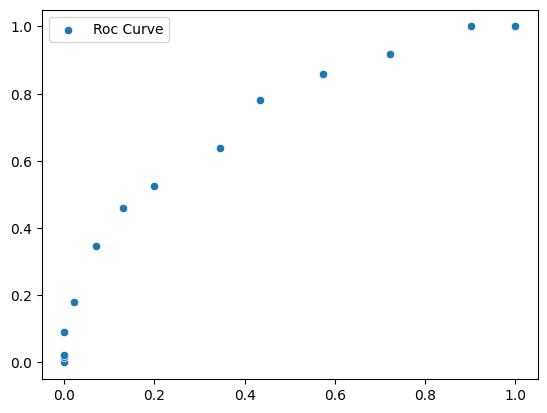

In [ ]:
#get fpr, tpr, thredholds and AUC
from sklearn.metrics import roc_curve, roc_auc_score

fpr, tpr, thresholds = roc_curve(y_test_kNN, y_pred_probs_bestk)
print('AUC:', '%.3f' % metrics.auc(fpr, tpr))
sns.scatterplot(x=fpr, y=tpr, label='Roc Curve')

In [ ]:
f1 = []
for threshold in thresholds:
    y_pred_t = [1 if prob >= threshold else 0 for prob in y_pred_probs_bestk]
    f1.append(f1_score(y_test_kNN, y_pred_t))
best_threshold = thresholds[f1.index(max(f1))]

print(best_threshold)

0.3076923076923077


In [ ]:
#get predicted probabilities for the main class
y_pred_best_kNN = (knn_bestk.predict_proba(X_test_scaled_kNN)[:,1] >= best_threshold).astype(bool)

In [ ]:
print(confusion_matrix(y_test_kNN, y_pred_best_kNN))
print(classification_report(y_test_kNN, y_pred_best_kNN))

[[151 116]
 [ 29 104]]
              precision    recall  f1-score   support

           0       0.84      0.57      0.68       267
           1       0.47      0.78      0.59       133

    accuracy                           0.64       400
   macro avg       0.66      0.67      0.63       400
weighted avg       0.72      0.64      0.65       400



In [ ]:
#Model evaluation
print("Accuracy: ", metrics.accuracy_score(y_test_kNN,y_pred_best_kNN))
print("Precision: ", metrics.precision_score(y_test_kNN,y_pred_best_kNN))
print("Recall: ", metrics.recall_score(y_test_kNN,y_pred_best_kNN))
print("F1: ", metrics.f1_score(y_test_kNN,y_pred_best_kNN))

Accuracy:  0.6375
Precision:  0.4727272727272727
Recall:  0.7819548872180451
F1:  0.5892351274787535


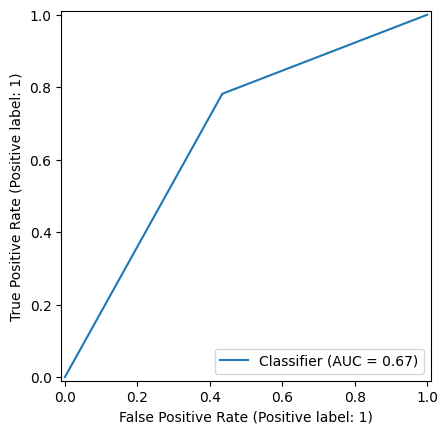

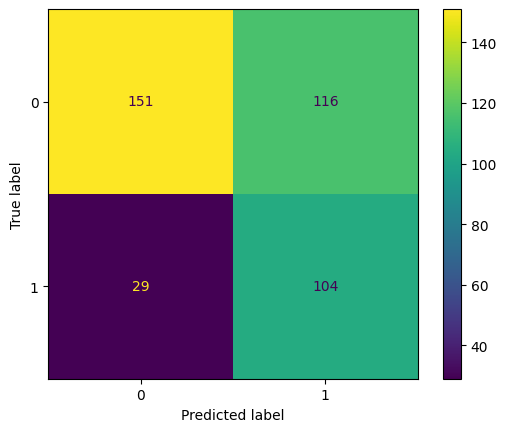

In [ ]:
RocCurveDisplay.from_predictions(y_test_kNN, y_pred_best_kNN)
ConfusionMatrixDisplay.from_predictions(y_test_kNN, y_pred_best_kNN)
plt.show()

#### k-fold Cross Validation

In [ ]:
# Perform 10-fold cross-validation
accuracy= cross_val_score(knn_bestk, X, y, cv=10)
precision= cross_val_score(knn_bestk, X, y, cv=10, scoring='precision')
recall= cross_val_score(knn_bestk, X, y, cv=10, scoring='recall')
f1 = cross_val_score(knn_bestk, X, y, cv=10, scoring=('f1'))

# Print the mean accuracy scores and 95%CI of the scores
print("Accuracy scores: %0.3f (+/- %0.3f)" % (accuracy.mean(), get_95ci(accuracy)))
print("Precision scores: %0.3f (+/- %0.3f)" % (precision.mean(), get_95ci(precision)))
print("Recall scores: %0.3f (+/- %0.3f)" % (recall.mean(), get_95ci(recall)))
# Print the mean F1 scores and 95%CI of the scores
print("F1 scores: %0.3f (+/- %0.3f)" % (f1.mean(), get_95ci(f1)))

Accuracy scores: 0.715 (+/- 0.020)
Precision scores: 0.606 (+/- 0.044)
Recall scores: 0.426 (+/- 0.033)
F1 scores: 0.499 (+/- 0.033)


### 3.3. Clustering

#### Feature Selection

In [ ]:
records.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1999 entries, 0 to 1999
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          1999 non-null   object 
 1   Year_02                         1999 non-null   int64  
 2   Kinder_Age                      1999 non-null   float64
 3   Disability                      1999 non-null   object 
 4   NCCD-Funded                     1999 non-null   int64  
 5   01.SES                          1999 non-null   int64  
 6   02.SES                          1999 non-null   int64  
 7   NumSibling                      1999 non-null   int64  
 8   SiblingOrder                    1999 non-null   int64  
 9   NumAbvYear9                     1999 non-null   int64  
 10  NumAbvDiploma                   1999 non-null   int64  
 11  NumProf                         1999 non-null   int64  
 12  Burt-01-SOY                     1999 no

In [ ]:
features1 = ['Year_02', 'Kinder_Age', 'NCCD-Funded', '01.SES', '02.SES',
             'NumSibling', 'SiblingOrder', 'NumAbvYear9', 'NumAbvDiploma',
             'NumProf', 'Burt-01-SOY', 'Burt-01-EOY', 'Clay-01-SOY',
             'Clay-01-EOY', 'TextLevel-01-SOY', 'TextLevel-01-MOY',
             'TextLevel-01-EOY', 'TextLevel-02-SOY', 'TextLevel-02-MOY',
             'TextLevel-02-EOY', 'WritingVocab-01-SOY', 'HRSIW-01-SOY',
             'Counting-01', 'Counting-02', 'Place Value-01', 'Place Value-02',
             'Addition and Subtraction-01', 'Addition and Subtraction-02',
             'Multiplication and Division-01', 'Multiplication and Division-02',
             'gender', 'Disability_Cognitive', 'Disability_Non-disable',
             'Disability_Physical', 'Disability_Sensory', 'Disability_SocialEmotional']

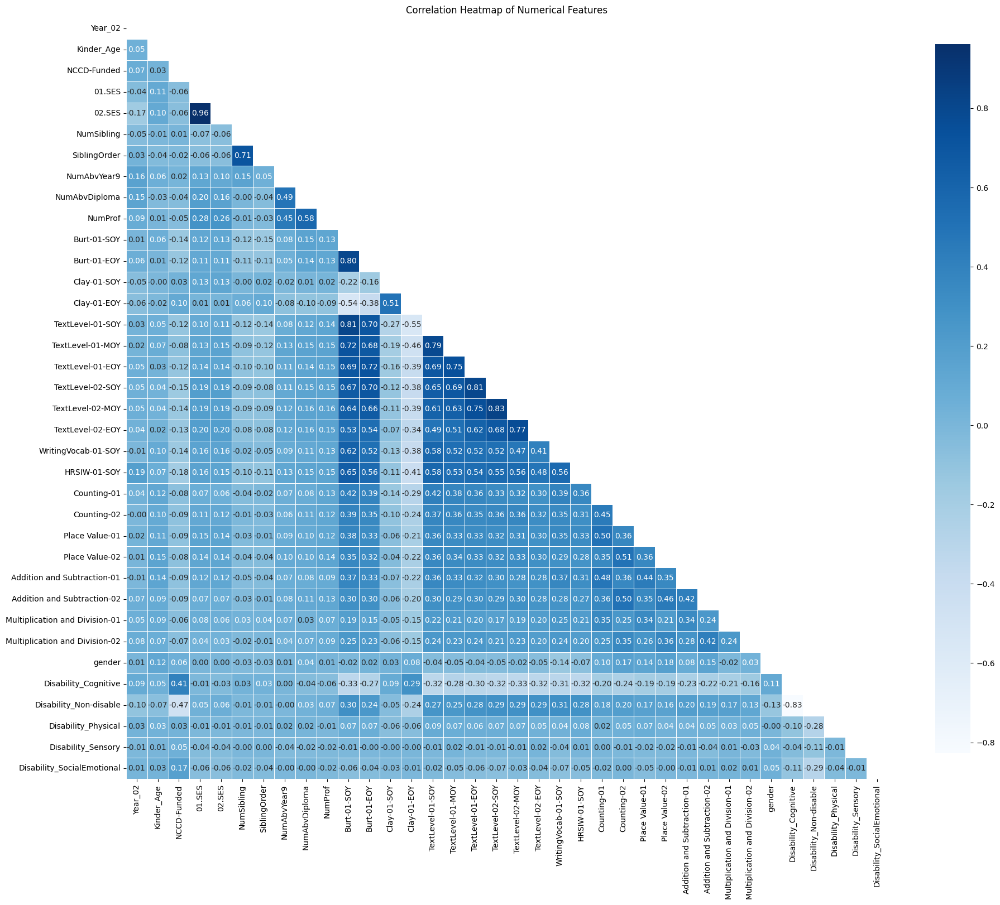

In [ ]:
# Create a correlation matrix
corr_matrix_5 = records[features1].corr()

mask = np.triu(np.ones_like(corr_matrix_5, dtype=bool))

# Create the heatmap
plt.figure(figsize=(22, 22))
sns.heatmap(corr_matrix_5,
            mask=mask,
            square=True,
            cmap='Blues',
            annot=True,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": 0.75})

# Display the plot
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [ ]:
clustering_features = ['Year_02', 'Kinder_Age', 'NCCD-Funded', '02.SES',
                       'NumSibling', 'NumAbvYear9', 'NumAbvDiploma',
                       'NumProf', 'Burt-01-EOY', 'Clay-01-SOY', 'Clay-01-EOY',
                       'TextLevel-02-EOY', 'WritingVocab-01-SOY',
                       'HRSIW-01-SOY', 'Counting-01', 'Counting-02', 'Place Value-01',
                       'Place Value-02', 'Addition and Subtraction-01',
                       'Addition and Subtraction-02', 'Multiplication and Division-01',
                       'Multiplication and Division-02', 'gender', 'Disability_Cognitive',
                       'Disability_Physical', 'Disability_Sensory', 'Disability_SocialEmotional']

H = records[clustering_features]

In [ ]:
variance_clustering_features = H.var()

# Print the variance for each feature
print(variance_clustering_features)


Year_02                             2.771967
Kinder_Age                          0.121229
NCCD-Funded                         0.080745
02.SES                             83.767071
NumSibling                          0.988333
NumAbvYear9                         0.525334
NumAbvDiploma                       0.702314
NumProf                             0.659610
Burt-01-EOY                       150.339931
Clay-01-SOY                        13.689844
Clay-01-EOY                        41.929466
TextLevel-02-EOY                   14.184682
WritingVocab-01-SOY               160.839998
HRSIW-01-SOY                      100.142800
Counting-01                         0.876283
Counting-02                         1.150939
Place Value-01                      0.280968
Place Value-02                      0.409416
Addition and Subtraction-01         0.874733
Addition and Subtraction-02         1.336497
Multiplication and Division-01      0.702074
Multiplication and Division-02      0.596069
gender    

In [ ]:
clustering_features = ['Year_02', '02.SES', 'Burt-01-EOY', 'Clay-01-SOY', 'Clay-01-EOY',
                       'TextLevel-02-EOY', 'WritingVocab-01-SOY',
                       'HRSIW-01-SOY', 'Counting-02', 'Addition and Subtraction-02']

H = records[clustering_features]

In [ ]:
# Scale the features using Min-Max Scaling
scaler = MinMaxScaler()

#Features_to_scale
features_to_scale =['Year_02', '02.SES', 'Burt-01-EOY', 'Clay-01-SOY', 'Clay-01-EOY',
                       'TextLevel-02-EOY', 'WritingVocab-01-SOY',
                       'HRSIW-01-SOY', 'Counting-02', 'Addition and Subtraction-02']

# Fit the scaler on the training data
X_scaled_values = scaler.fit_transform(H[features_to_scale])

# Create DataFrames from the scaled values
X_scaled = pd.DataFrame(X_scaled_values, columns=features_to_scale)

In [ ]:
X_scaled.describe()

,Year_02,02.SES,Burt-01-EOY,Clay-01-SOY,Clay-01-EOY,TextLevel-02-EOY,WritingVocab-01-SOY,HRSIW-01-SOY,Counting-02,Addition and Subtraction-02
count,1999.000000,1999.000000,1999.000000,1999.000000,1999.000000,1999.000000,1999.000000,1999.000000,1999.000000,1999.000000
mean,0.528064,0.574216,0.362171,0.135332,0.283117,0.785661,0.231774,0.526117,0.475154,0.376271
std,0.332985,0.217915,0.121399,0.217646,0.323765,0.134509,0.133498,0.172537,0.178803,0.192678
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.200000,0.404762,0.287129,0.000000,0.000000,0.714286,0.136842,0.431034,0.333333,0.333333
50%,0.400000,0.547619,0.326733,0.000000,0.100000,0.821429,0.210526,0.551724,0.500000,0.333333
75%,0.800000,0.738095,0.425743,0.176471,0.650000,0.892857,0.305263,0.637931,0.666667,0.500000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### Model Building

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [ ]:
# Fit K-means clustering model with a 'guessed' number of clusters
k=5
kmeans = KMeans(n_clusters=k, n_init='auto',max_iter=300, random_state=2024)

#fit kmeans with X_scaled
kmeans.fit(X_scaled)

# Add cluster labels to original dataset
records['Cluster'] = kmeans.labels_

#### Clustering Evaluation

Within-Cluster Sum of Squares

In [ ]:
# Evaluate the model using within-cluster sum of squares (WCSS)
wcss = kmeans.inertia_
print("Within-Cluster Sum of Squares (WCSS):", '%.3f' % wcss)

Within-Cluster Sum of Squares (WCSS): 442.947


The Davies-Bouldin Index (DBI)

In [ ]:
from sklearn.metrics import davies_bouldin_score

# Compute the Davies-Bouldin index
dbs = davies_bouldin_score(X_scaled, kmeans.labels_)
print("Davies Bouldin index:", '%.3f' % dbs)

Davies Bouldin index: 1.647


Silhouette score

In [ ]:
# Compute the Silhouette score for the clustering model
silhouette_avg = silhouette_score(X_scaled, kmeans.labels_)

print('Silhouette score:', '%.3f' % silhouette_avg)

Silhouette score: 0.216


In [ ]:
#Import funtions to visualise silhouette score
from sklearn.metrics import silhouette_samples, silhouette_score
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib.cm as cm

In [ ]:
#fit kmeans with X_scaled to get labels
cluster_labels = kmeans.fit_predict(X_scaled)

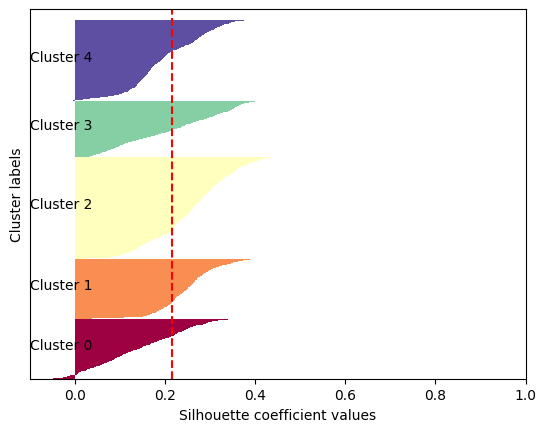

In [ ]:
# Compute silhouette scores
silhouette_avg = silhouette_score(X_scaled, cluster_labels)
sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

# Plot silhouette diagram
n_clusters = 5
fig, ax = plt.subplots()
y_lower, y_upper = 0, 0

# Define the colormap, options include: autumn, Spectral, viridis, plasma, cool, jet
cmap = cm.Spectral

# Create a list of evenly spaced values in the range [0, 1]
values = np.linspace(0, 1, n_clusters)

for i in range(n_clusters):
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper += size_cluster_i
    color = cmap(values[i])
    ax.barh(range(y_lower, y_upper), ith_cluster_silhouette_values, height=1.0,
            edgecolor='none', color=color)
    ax.text(-0.1, (y_lower + y_upper) / 2, 'Cluster ' + str(i), color='black', fontsize=10)
    y_lower += size_cluster_i

ax.axvline(x=silhouette_avg, color="red", linestyle="--")
ax.set_xlabel("Silhouette coefficient values")
ax.set_ylabel("Cluster labels")
ax.set_yticks([])
ax.set_xlim([-0.1, 1])
ax.set_ylim([0, len(X_scaled) + (n_clusters + 1) * 10])

plt.show()

#### Optimising k

elbow method based on the SSE (WCSS) score

In [ ]:
# Determine optimal number of clusters using the SSE metric
sse_scores = []
best_k=2
best_sse_score=4622.613
for i in range(2, 41):
  kmeans = KMeans(n_clusters=i, n_init=2)
  kmeans.fit(X_scaled)
  sse_score_i=kmeans.inertia_
  sse_scores.append(sse_score_i)
  if best_sse_score > sse_score_i:
    best_k = i
    best_sse_score = sse_score_i

print('Best k: ', best_k)
print('Best within cluster sum of squarred error score: ', '%.3f' %best_sse_score)

Best k:  39
Best within cluster sum of squarred error score:  207.744


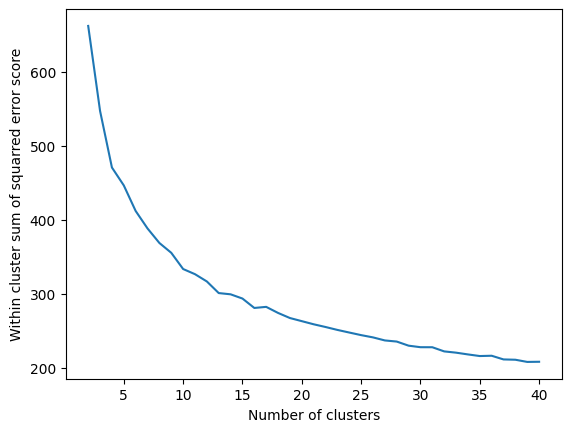

In [ ]:
# Plot the silhouette scores to determine optimal number of clusters
plt.plot(range(2,41), sse_scores)
plt.xlabel("Number of clusters")
plt.ylabel("Within cluster sum of squarred error score")
plt.show()

davies_bouldin_score

In [ ]:
from sklearn.metrics import davies_bouldin_score
# Determine optimal number of clusters using the SSE metric
dbs_scores = []
best_k=2
best_dbs_score=1
for k in range(2, 41):
  kmeans = KMeans(n_clusters=k, n_init=10, max_iter=300, random_state=2024)
  kmeans.fit(X_scaled)
  dbs_score_k=davies_bouldin_score(X_scaled, kmeans.labels_)
  dbs_scores.append(dbs_score_k)
  if best_dbs_score > dbs_score_k:
    best_k = k
    best_dbs_score = dbs_score_k

print('Best k: ', best_k)
print('Best Davies Bouldin index: ', '%.3f' %best_dbs_score)

Best k:  2
Best Davies Bouldin index:  1.000


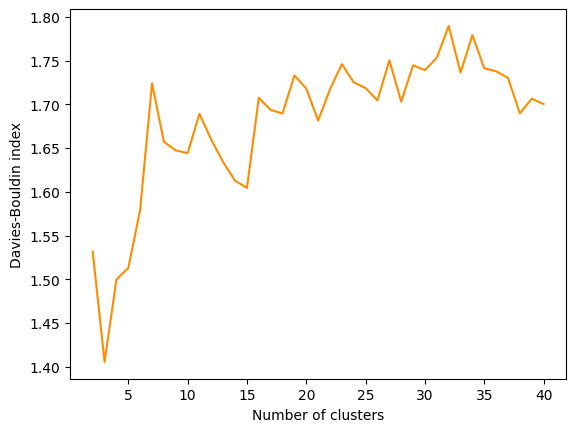

In [ ]:
# Plot the Davies-Bouldin indices to determine optimal number of clusters
plt.plot(range(2,41), dbs_scores, color='darkorange', label='Davies Bouldin index')
plt.xlabel('Number of clusters')
plt.ylabel('Davies-Bouldin index')
plt.show()

silhouette score

In [ ]:
# Determine optimal number of clusters using silhouette score
sil_scores = []
best_k=2
best_sil_score=0
for i in range(2, 41):
  kmeans = KMeans(n_clusters=i, n_init=10, random_state=2024)
  kmeans.fit(X_scaled)
  sil_score_i=silhouette_score(X_scaled, kmeans.labels_)
  sil_scores.append(sil_score_i)
  if best_sil_score < sil_score_i:
    best_k = i
    best_sil_score = sil_score_i

print('Best k: ', best_k)
print('Best silhouette score: ', '%.3f' %best_sil_score)

Best k:  2
Best silhouette score:  0.278


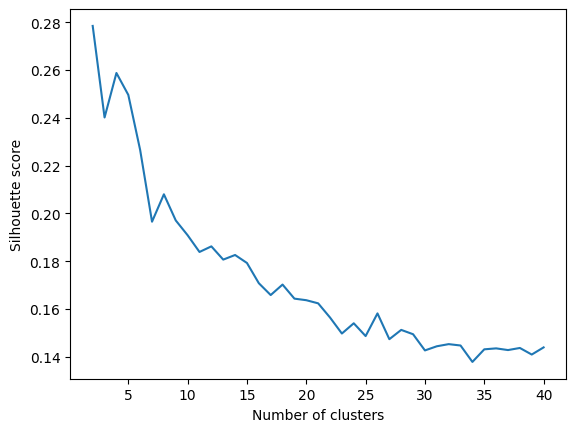

In [ ]:
# Plot the silhouette scores to determine optimal number of clusters
plt.plot(range(2,41), sil_scores)
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette score")
plt.show()

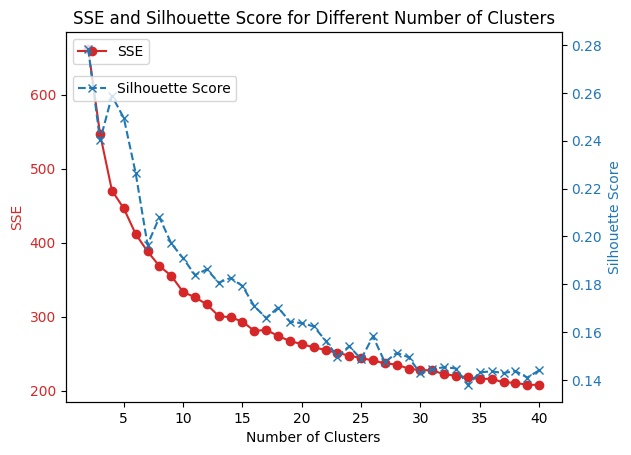

In [ ]:
# Create a figure and a set of subplots (two y-axes)
fig, ax1 = plt.subplots()

cluster_range = range(2, 41)

# Plot SSE
color = 'tab:red'
ax1.set_xlabel('Number of Clusters')
ax1.set_ylabel('SSE', color=color)
ax1.plot(cluster_range, sse_scores, marker='o', label='SSE', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Create the second y-axis to plot Silhouette Score
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Silhouette Score', color=color)
ax2.plot(cluster_range, sil_scores, marker='x', linestyle='--', label='Silhouette Score', color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Show legend
ax1.legend(loc='upper left', bbox_to_anchor=(0.0, 1.0))
ax2.legend(loc='upper left', bbox_to_anchor=(0.0, 0.9))

# Show plot
plt.title("SSE and Silhouette Score for Different Number of Clusters")
plt.show()

#### Model Selection

In [ ]:
#k = 2
n_clusters=2

In [ ]:
# initialise the model object
kmeans = KMeans(n_clusters=best_k,n_init=10, random_state=2024)

#Fit K-means clustering model with the selected number of clusters
kmeans.fit(X_scaled)

KMeans(n_clusters=2, n_init=10, random_state=2024)

In [ ]:
# Add cluster labels to original dataset
records['Cluster'] = kmeans.labels_

In [ ]:
# Evaluate the model using within-cluster sum of squares (WCSS)
wcss = kmeans.inertia_
print("Within-Cluster Sum of Squares (WCSS):", '%.3f' % wcss)

# Compute the Davies-Bouldin index
dbs = davies_bouldin_score(X_scaled, kmeans.labels_)
print("Davies Bouldin index:", '%.3f' % dbs)

# Compute the Silhouette score for the clustering model
silhouette_avg = silhouette_score(X_scaled, kmeans.labels_)

print('Silhouette score:', '%.3f' % silhouette_avg)

Within-Cluster Sum of Squares (WCSS): 661.991
Davies Bouldin index: 1.532
Silhouette score: 0.278


<ipython-input-398-91266c7e9823>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("Spectral")


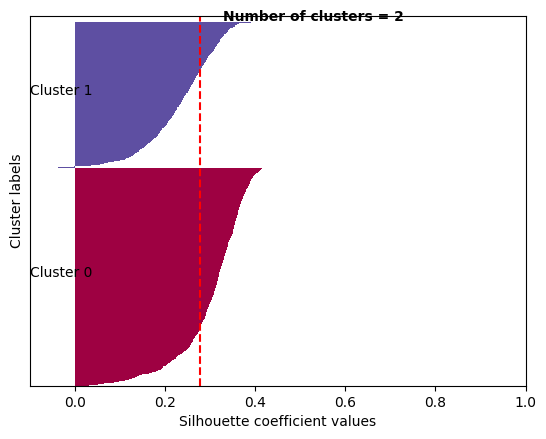

In [ ]:
# Compute sample silhouette scores
cluster_labels = kmeans.labels_
sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

# Create a color map
cmap = cm.get_cmap("Spectral")

# Create a list of evenly spaced values in the range [0, 1]
values = np.linspace(0, 1, n_clusters)

# Plot silhouette diagram
fig, ax = plt.subplots()
y_lower, y_upper = 0, 0
for i in range(n_clusters):
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper += size_cluster_i
    color = cmap(values[i])
    ax.barh(range(y_lower, y_upper), ith_cluster_silhouette_values, height=1.0,
            edgecolor='none', color=color)
    ax.text(-0.1, (y_lower + y_upper) / 2, 'Cluster ' + str(i), color='black', fontsize=10)
    y_lower += size_cluster_i

ax.axvline(x=silhouette_avg, color="red", linestyle="--")
ax.set_xlabel("Silhouette coefficient values")
ax.set_ylabel("Cluster labels")
ax.set_yticks([])
ax.set_xlim([-0.1, 1])
ax.set_ylim([0, len(X_scaled) + (n_clusters + 1) * 10])

ax.text(silhouette_avg + 0.05, len(X_scaled) + 5, "Number of clusters = %d" % n_clusters, fontsize=10, fontweight='bold')

plt.show()

#### Post-analysis for Cluster Profiling

In [ ]:
records[['Year_02', '02.SES', 'Burt-01-EOY', 'Clay-01-SOY', 'Clay-01-EOY',
                       'TextLevel-02-EOY', 'WritingVocab-01-SOY',
                       'HRSIW-01-SOY', 'Counting-02', 'Addition and Subtraction-02']]

,Year_02,02.SES,Burt-01-EOY,Clay-01-SOY,Clay-01-EOY,TextLevel-02-EOY,WritingVocab-01-SOY,HRSIW-01-SOY,Counting-02,Addition and Subtraction-02
0,2020,104,73,0,0,32,20,49,5,4
1,2018,112,29,12,13,21,40,37,1,3
2,2021,109,32,4,18,22,6,30,1,1
3,2021,93,49,0,0,31,41,30,3,5
4,2021,98,28,10,13,26,26,32,4,4
...,...,...,...,...,...,...,...,...,...,...
1995,2016,114,31,0,1,27,42,32,3,2
1996,2021,93,67,0,1,31,51,45,1,3
1997,2016,101,55,7,14,30,29,33,3,2
1998,2021,108,35,0,2,31,44,35,2,4


In [ ]:
cluster_count=records.Cluster.value_counts()
cluster_count

,count
Cluster,
0,1198
1,801


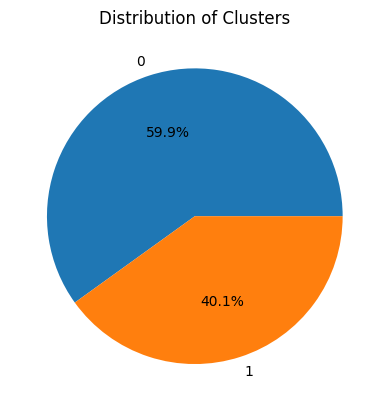

In [ ]:
# Sort the index to ensure the clusters are in order
sorted_cluster_count = cluster_count.sort_index()

colours = sns.color_palette("tab10", n_colors=len(cluster_count))

plt.pie(cluster_count, labels=sorted_cluster_count.index, autopct='%1.1f%%', colors= colours)
plt.title('Distribution of Clusters')
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


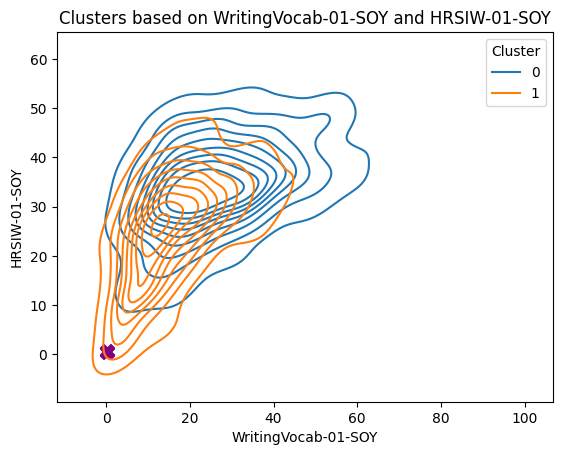

In [ ]:
# Get centroids from the kmeans model. It is based on X_scaled.
centroids = kmeans.cluster_centers_

scaler.fit(X_scaled)

# Reverse the scaling on the centroids.
centroids_original = scaler.inverse_transform(centroids)

# Create the KDE plot for the records
sns.kdeplot(data=records, x='WritingVocab-01-SOY', y='HRSIW-01-SOY', hue='Cluster', palette='tab10', legend='full')

# Fetch the centroids for 'WritingVocab-01-SOY' and 'HRSIW-01-SOY' columns from the reversed centroids
WritingVocab_centroids = centroids_original[:, 6]
HRSIW_centroids = centroids_original[:, 7]

# Overlay the centroids on the same plot
plt.scatter(WritingVocab_centroids, HRSIW_centroids, c='purple', marker='X', s=100, label='Centroids')

# Setting the title and labels
plt.title('Clusters based on WritingVocab-01-SOY and HRSIW-01-SOY')
plt.xlabel('WritingVocab-01-SOY')
plt.ylabel('HRSIW-01-SOY')
#plt.legend(loc='upper right')

plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


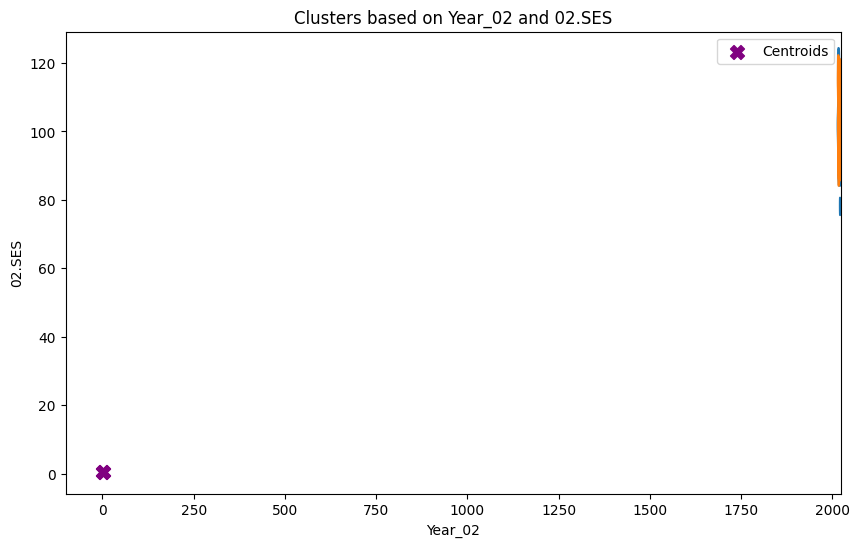

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


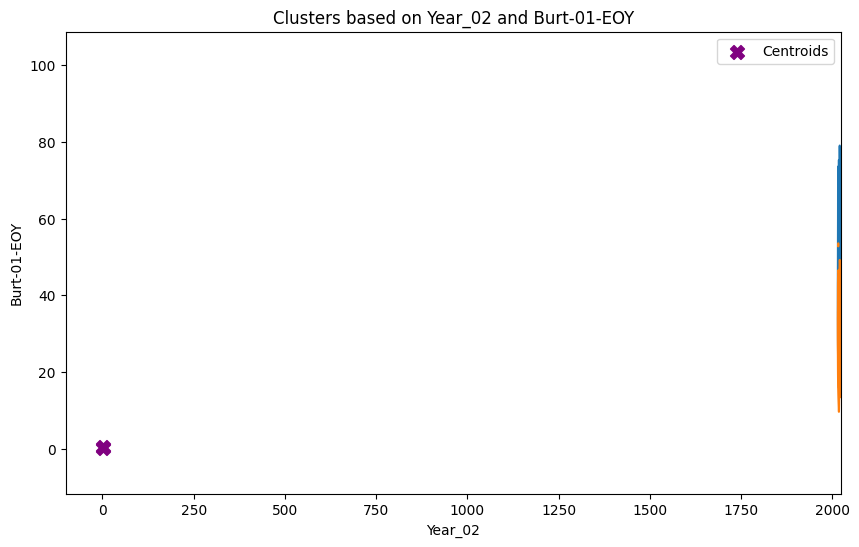

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


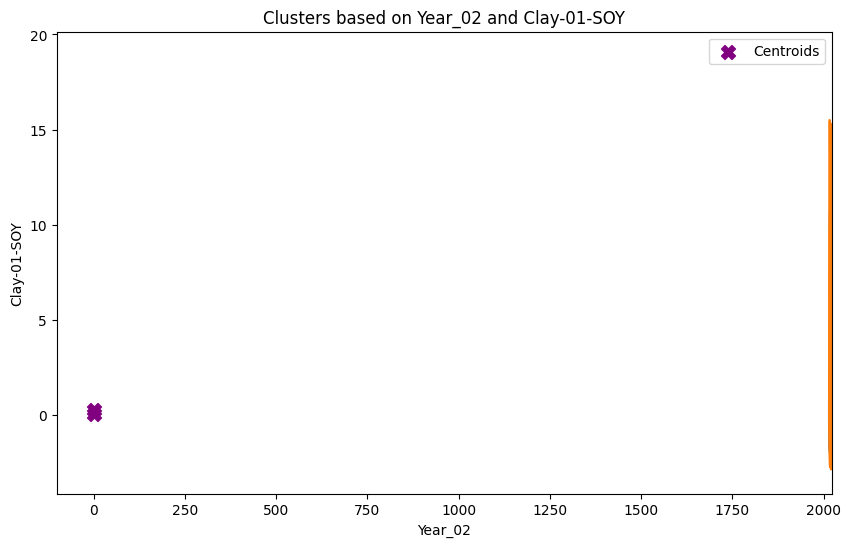

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


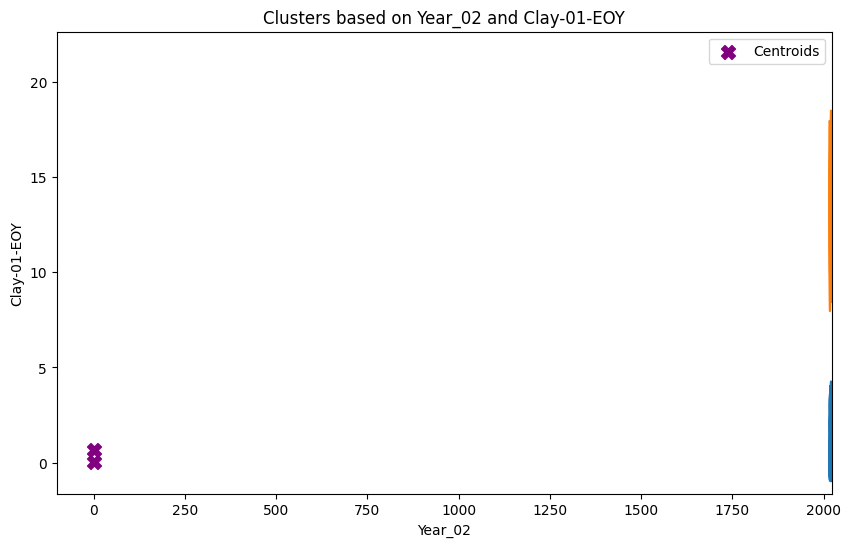

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


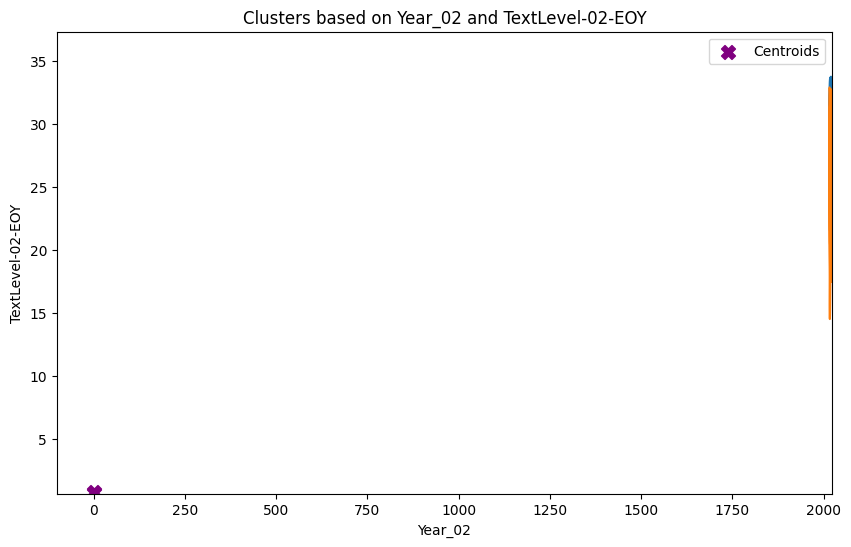

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


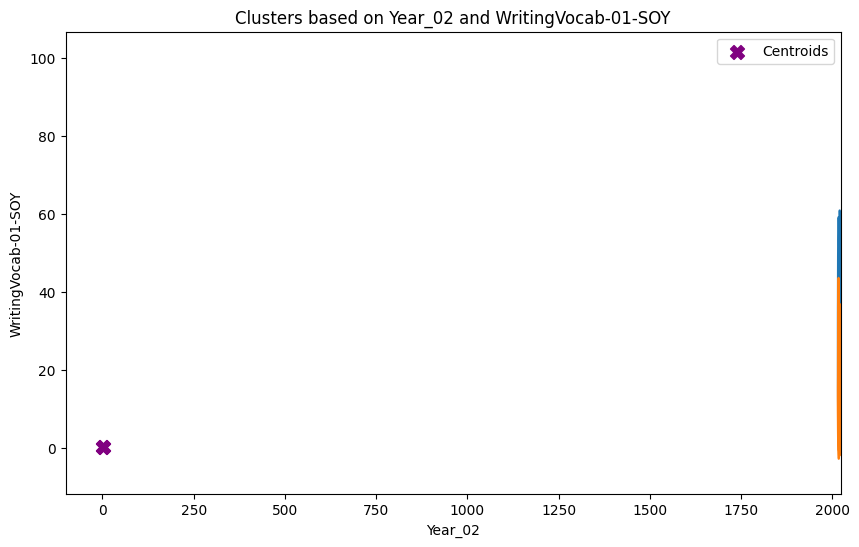

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


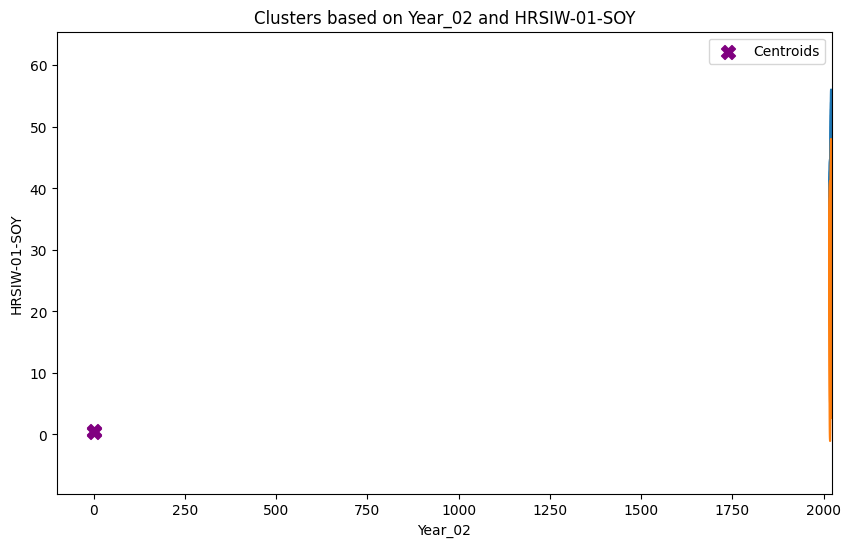

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


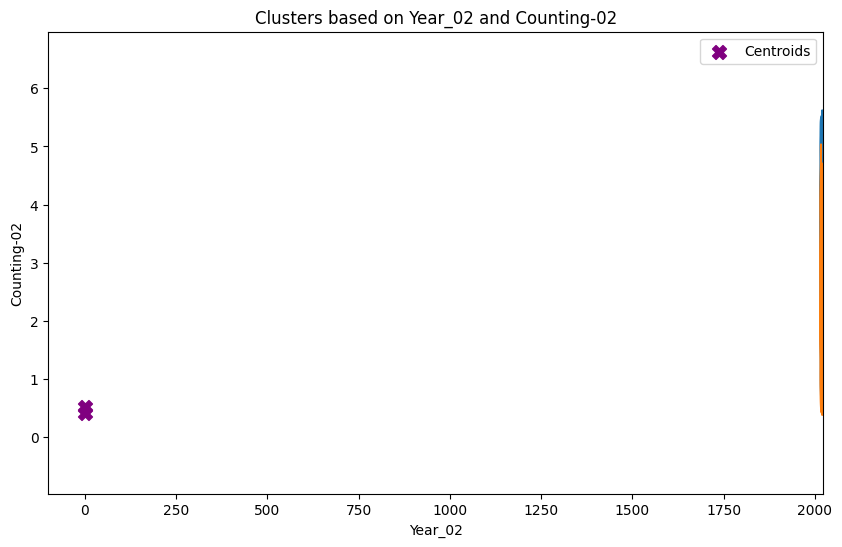

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


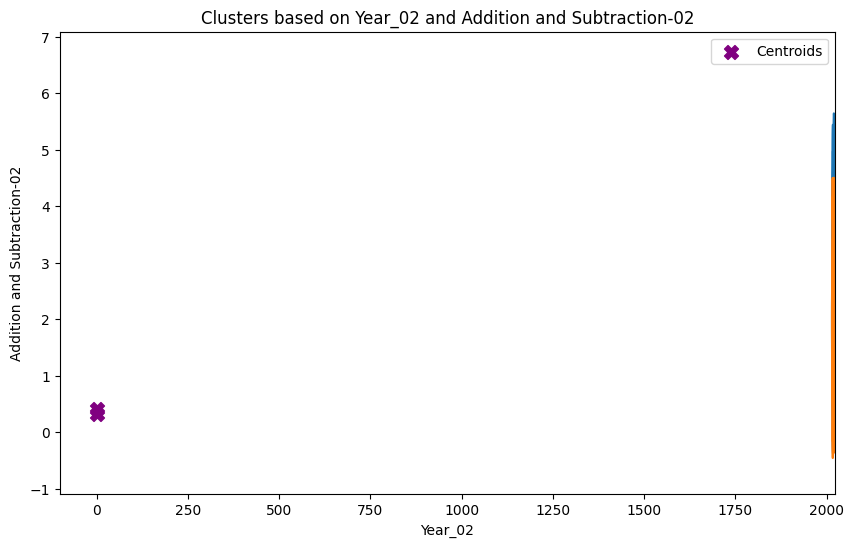

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


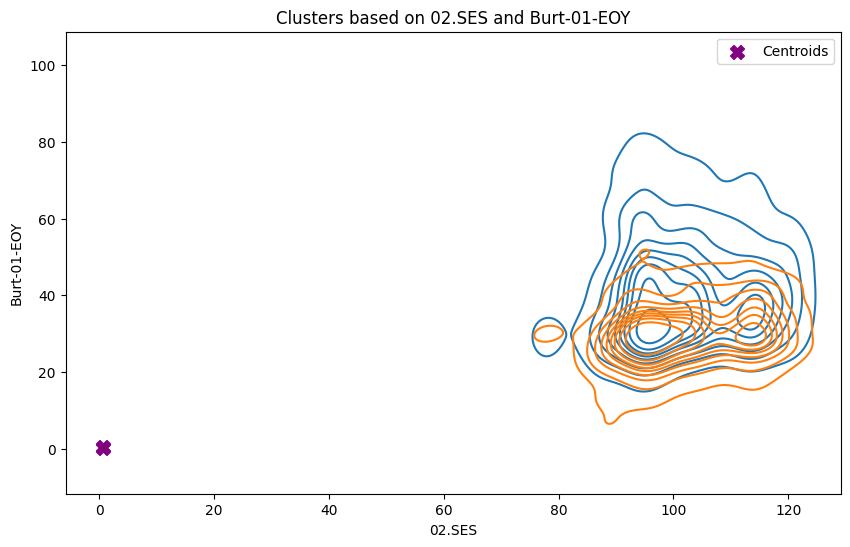

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


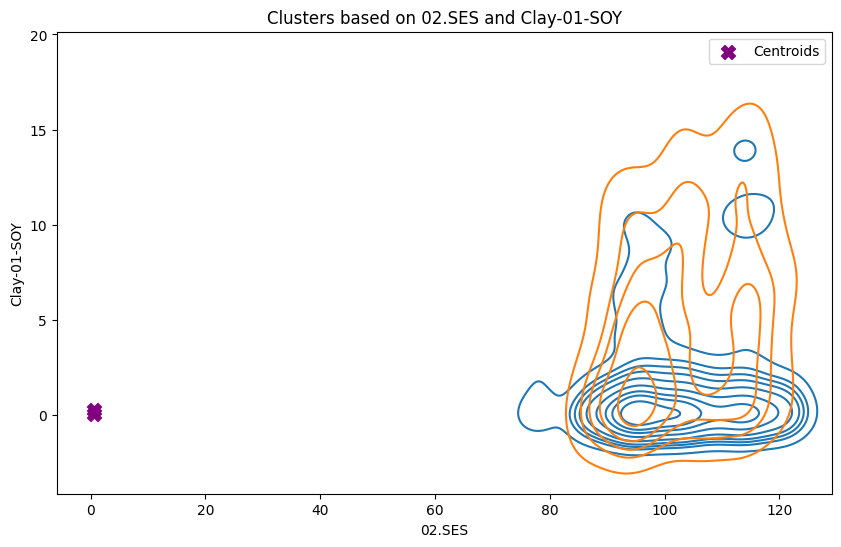

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


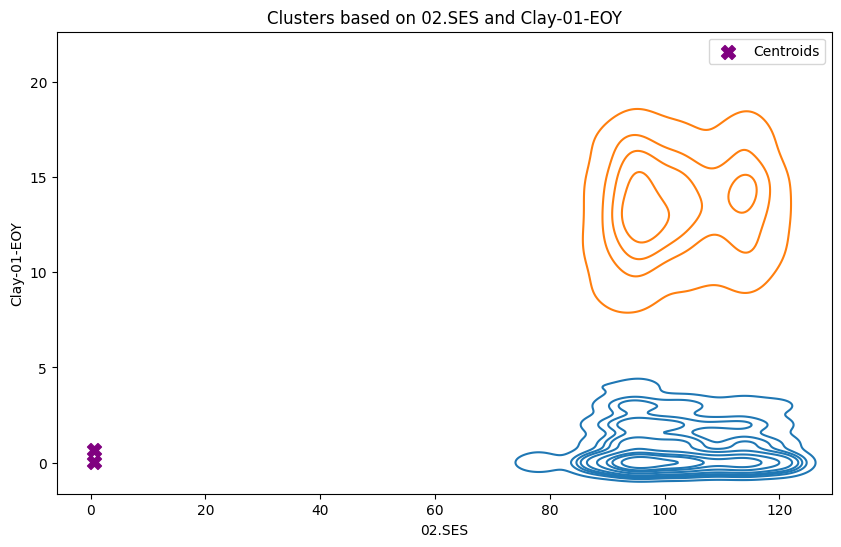

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


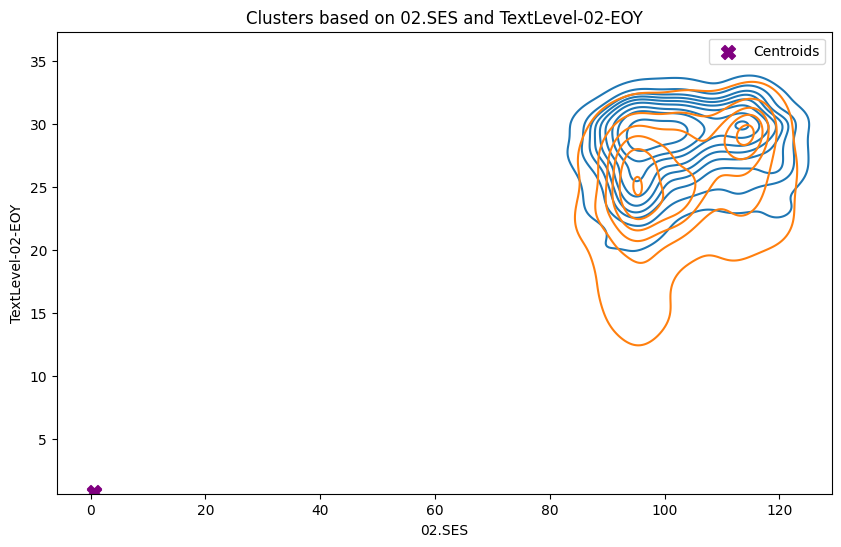

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


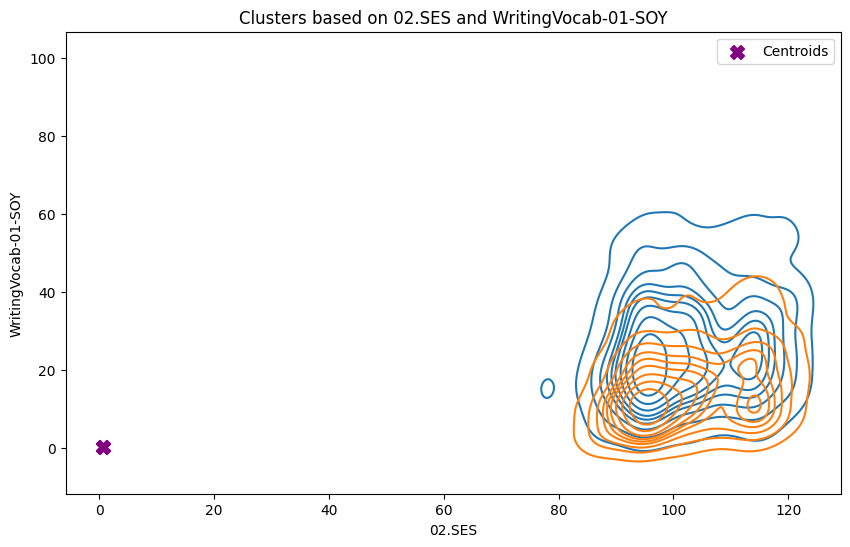

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


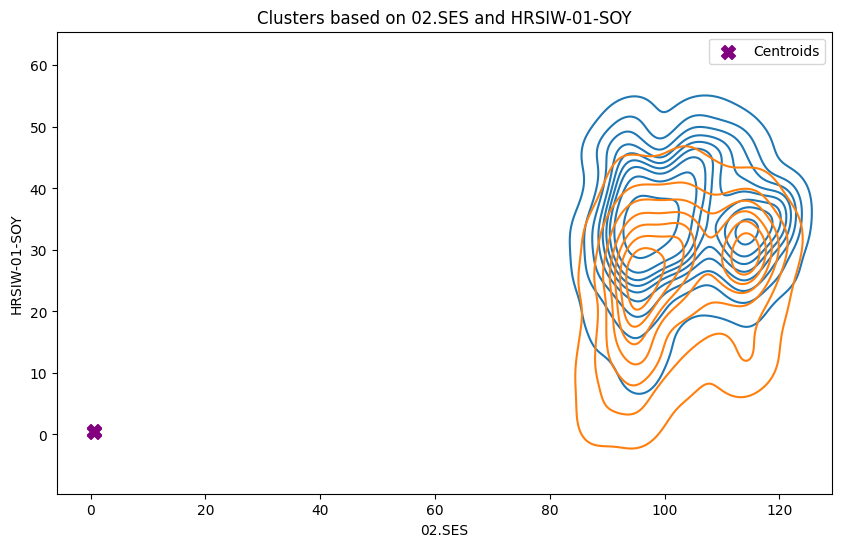

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


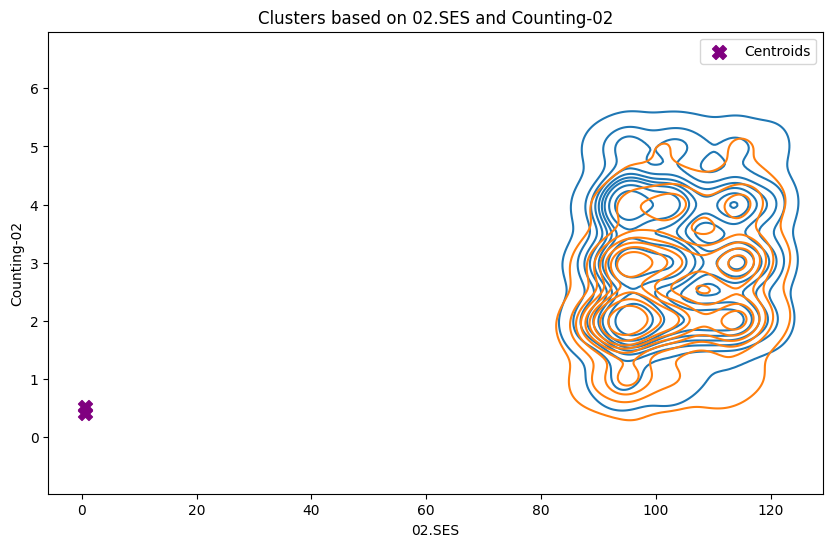

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


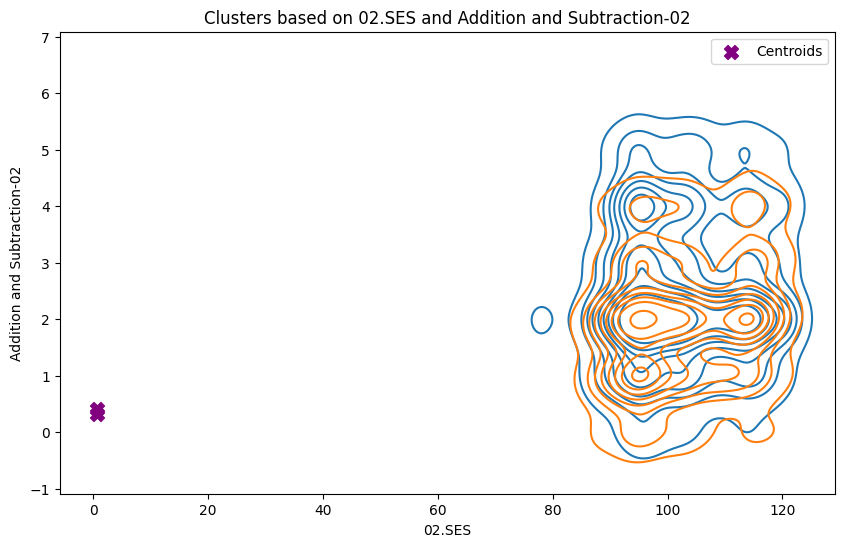

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


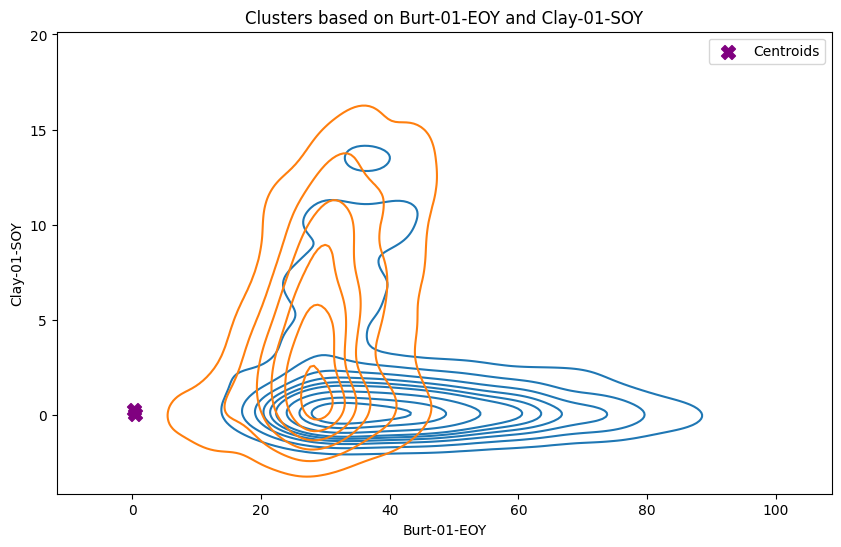

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


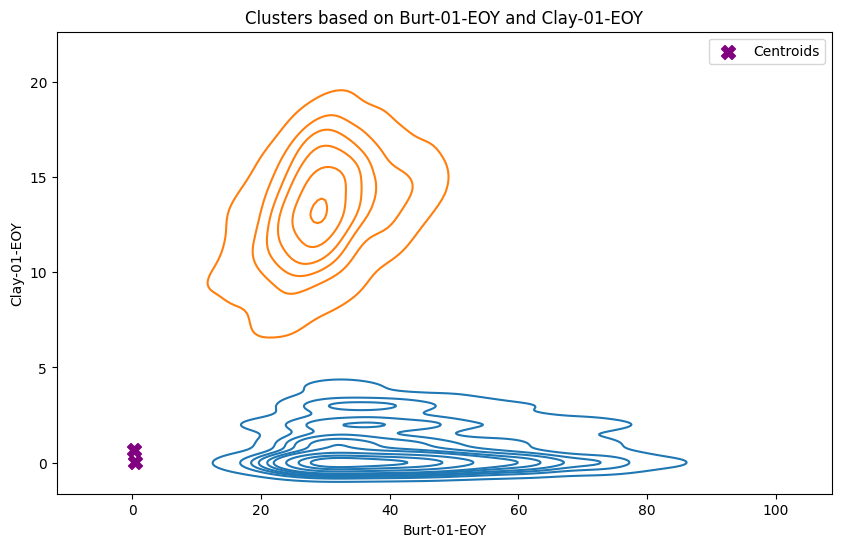

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


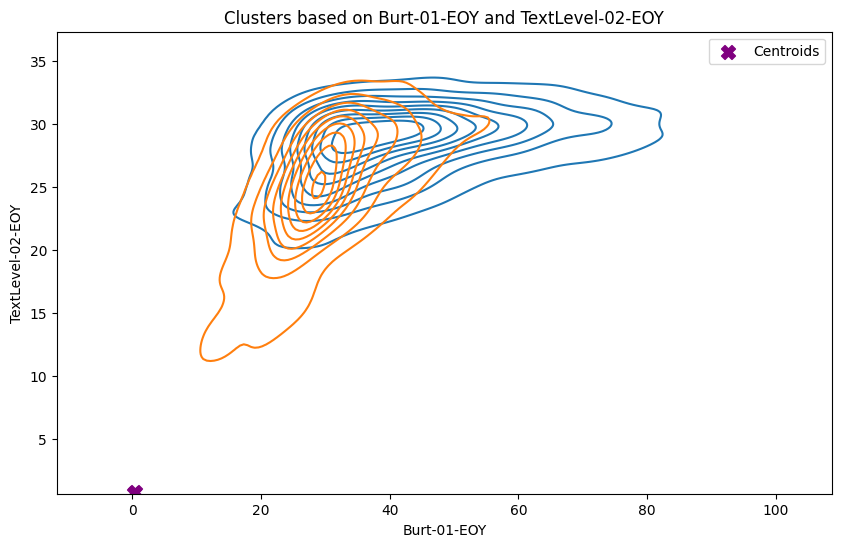

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


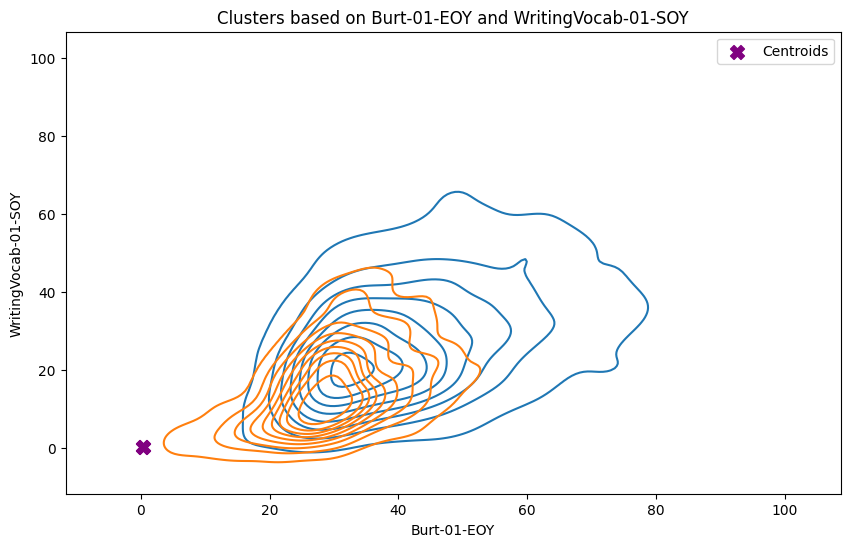

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


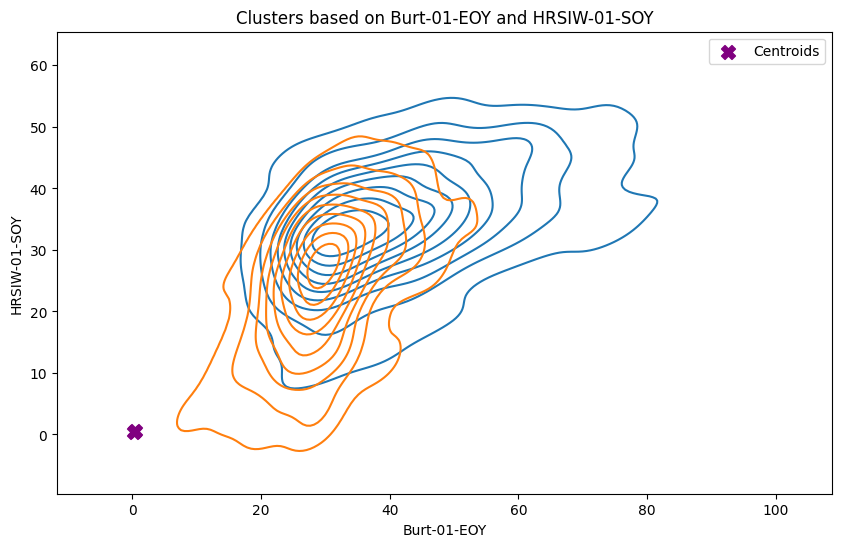

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


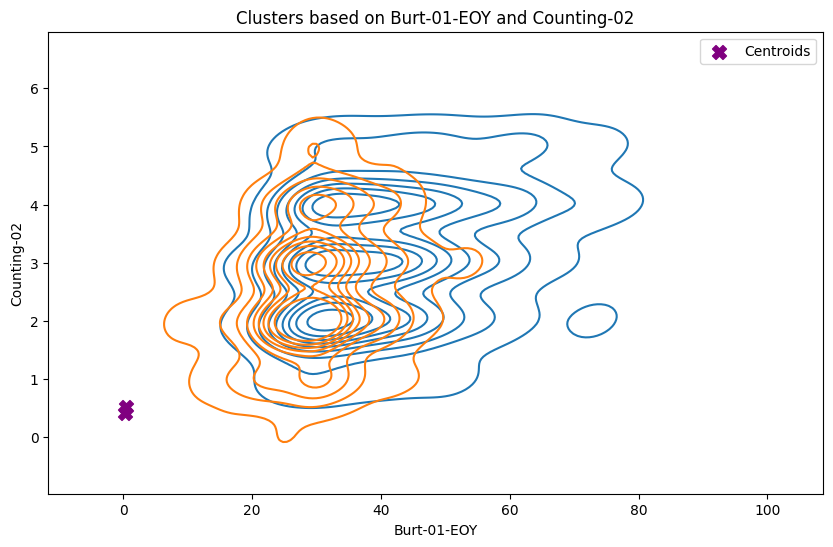

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


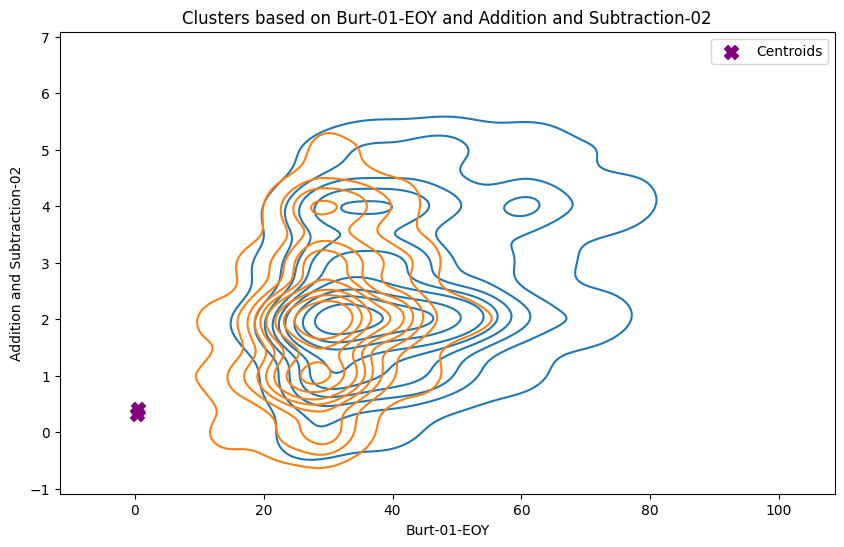

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


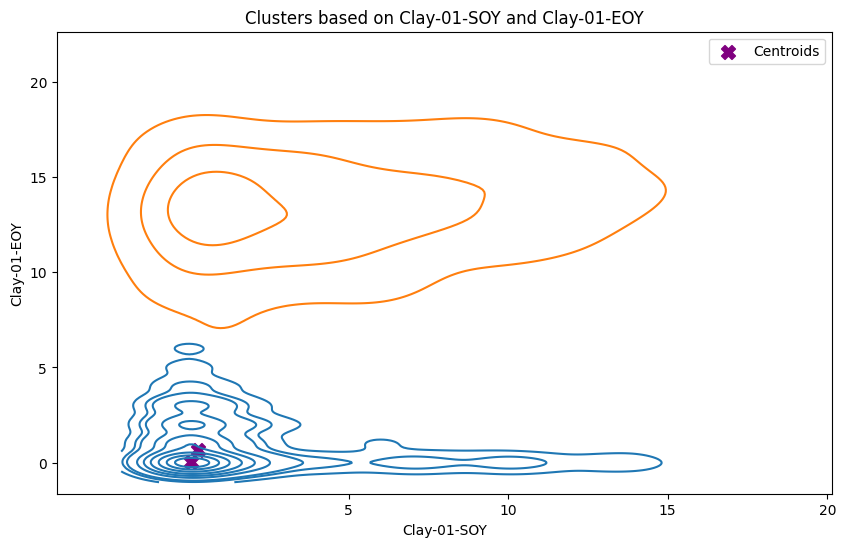

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


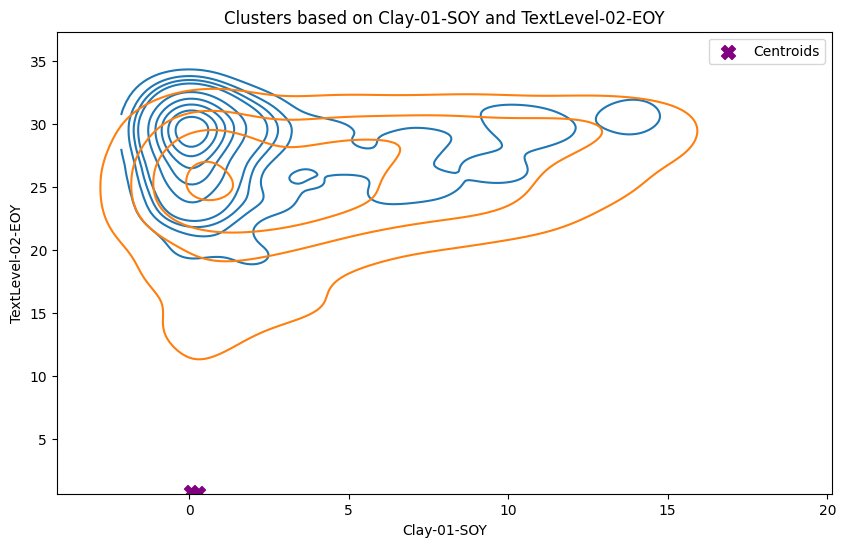

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


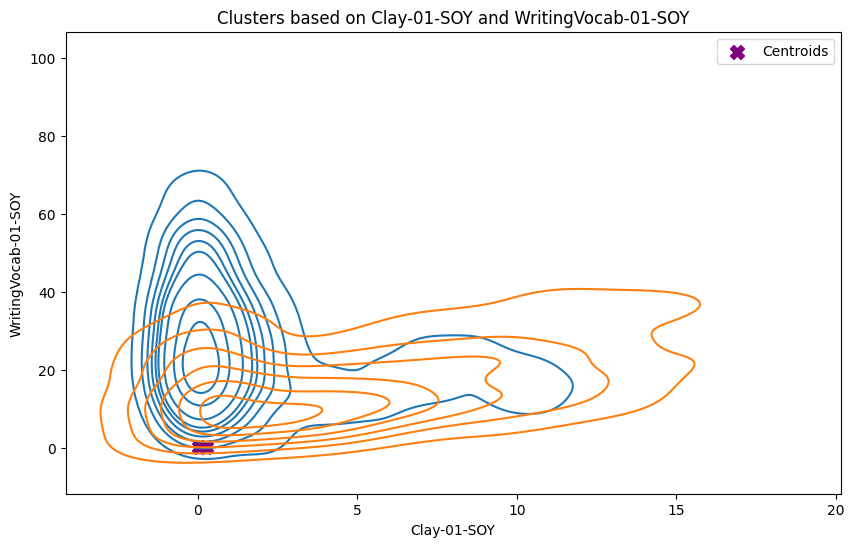

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


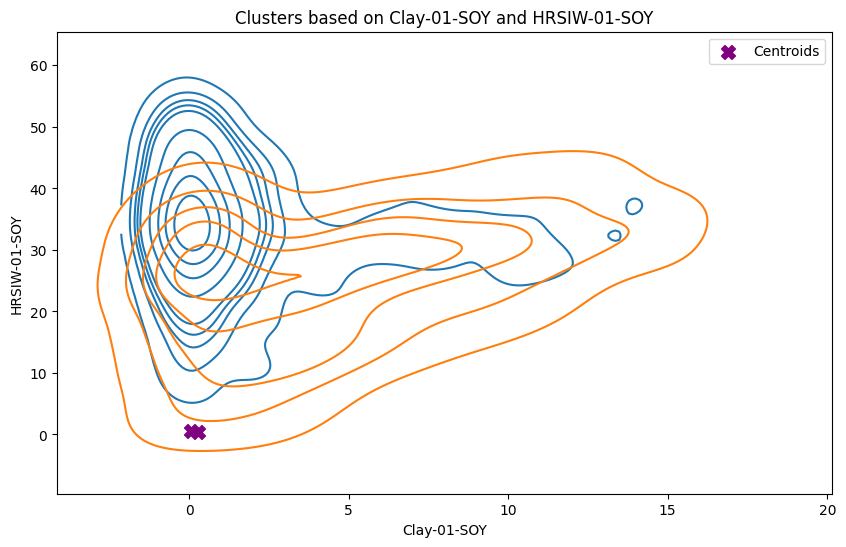

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


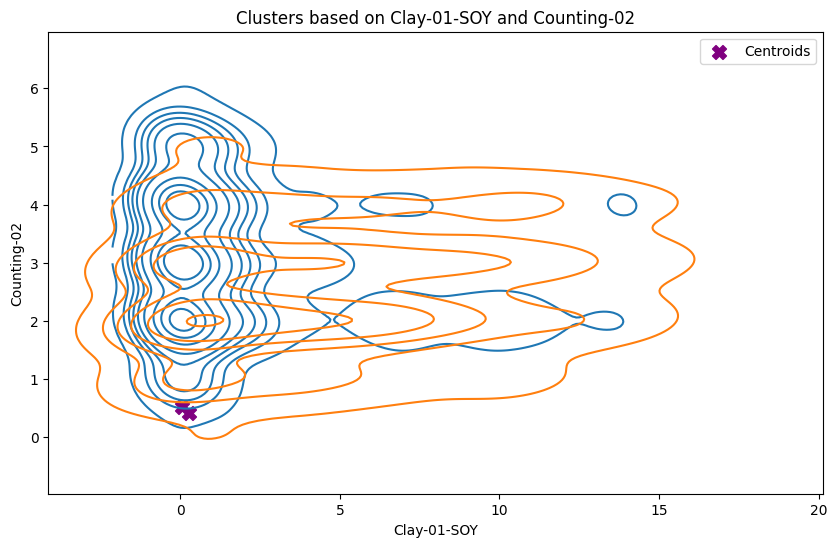

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


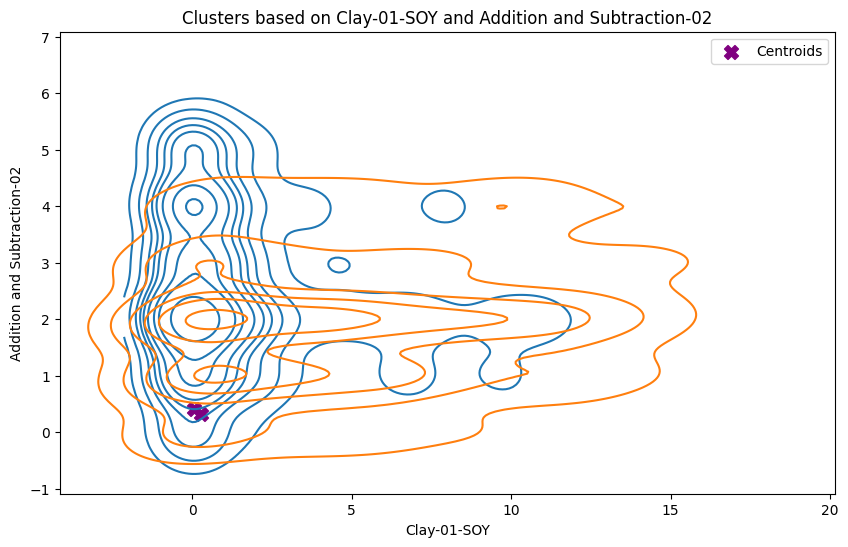

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


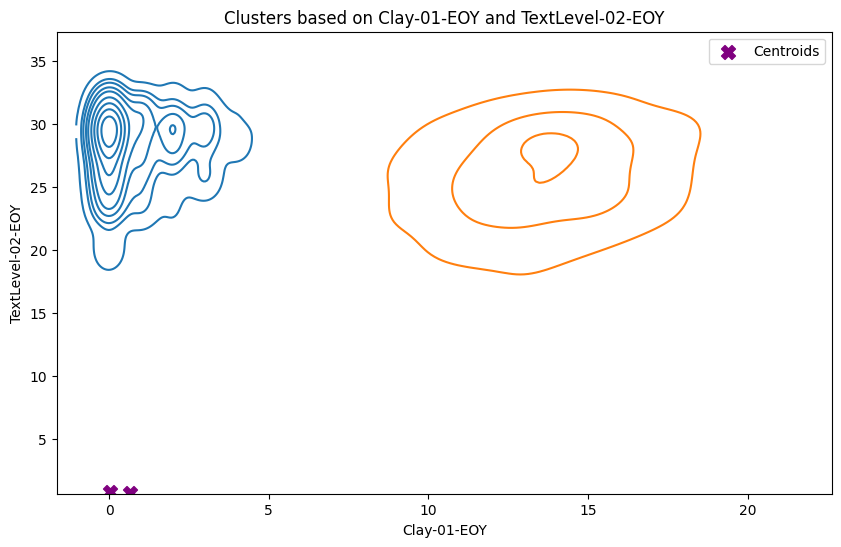

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


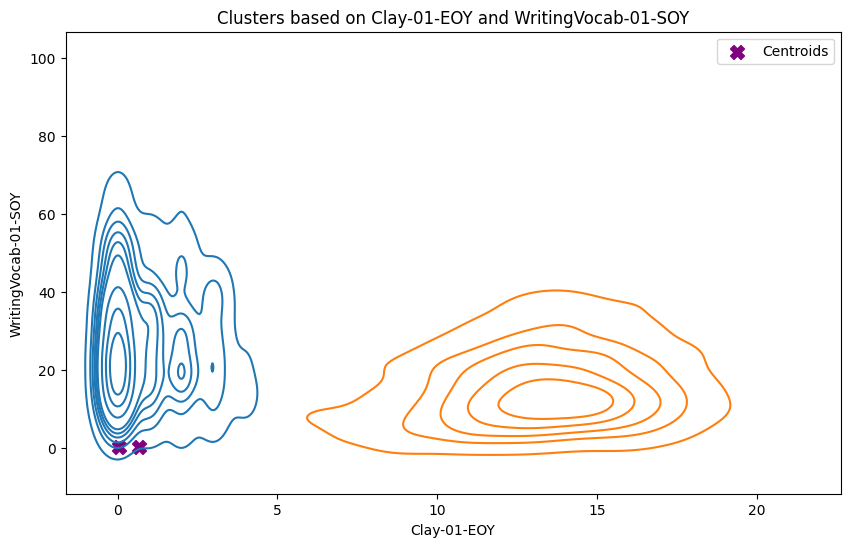

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


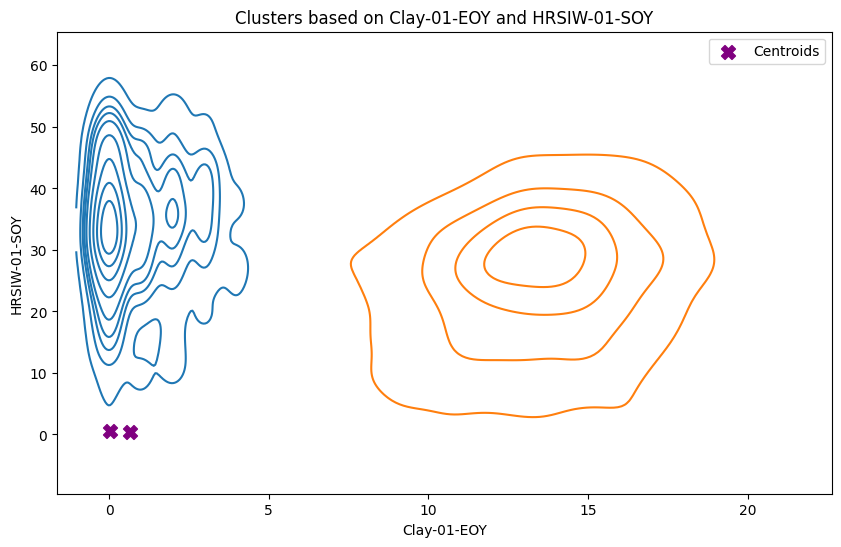

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


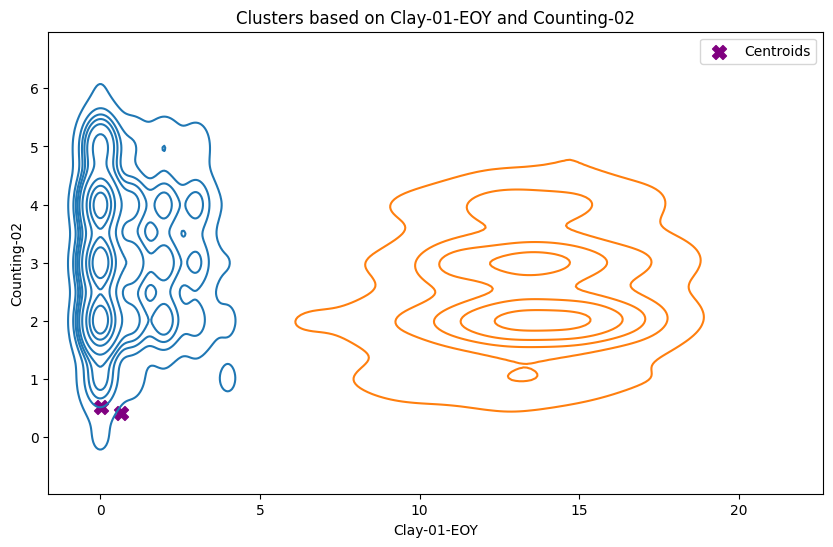

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


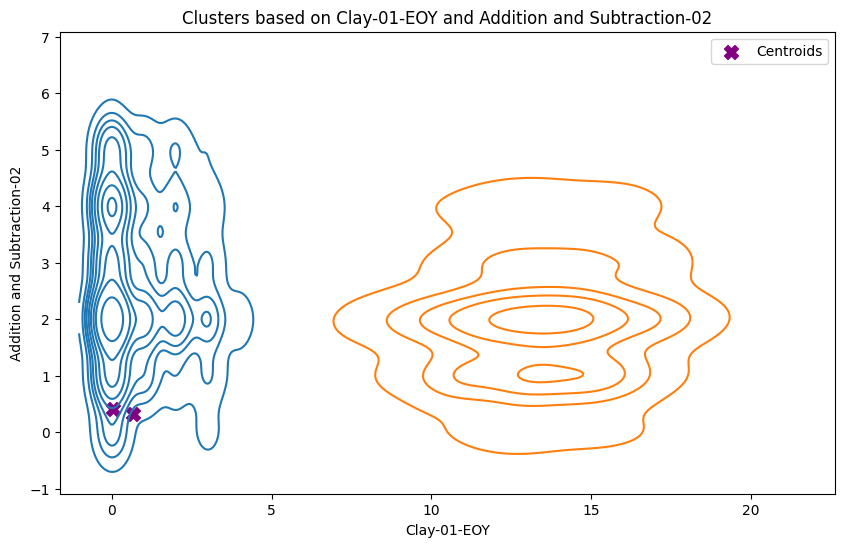

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


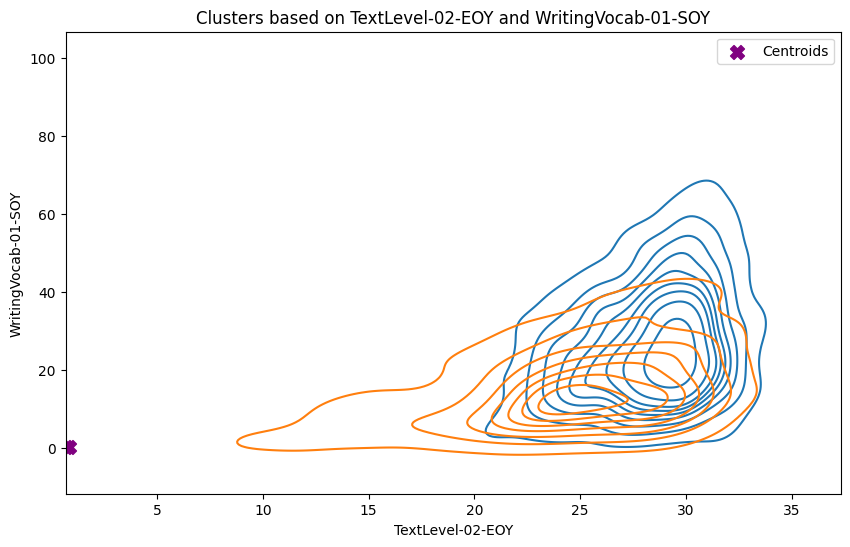

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


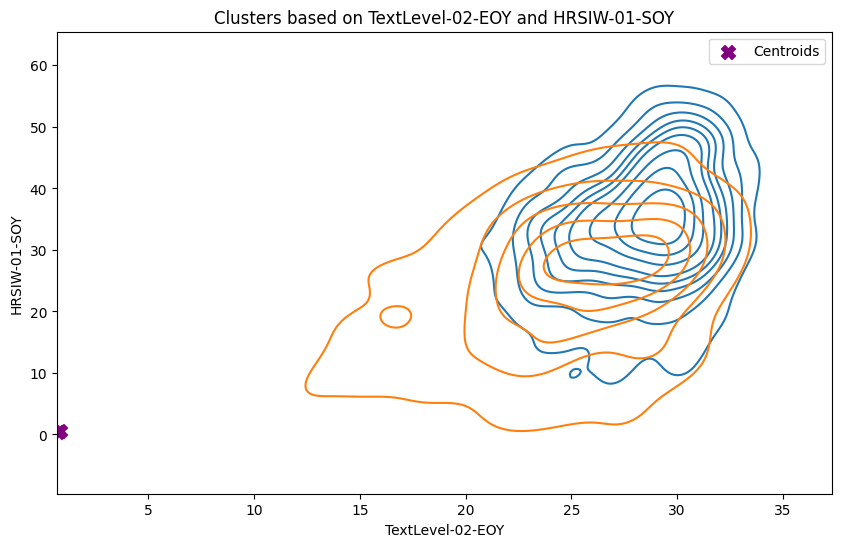

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


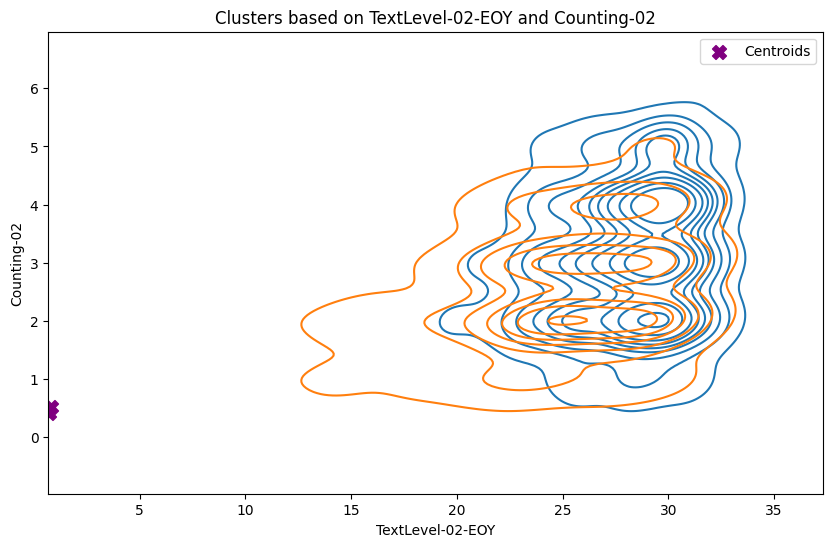

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


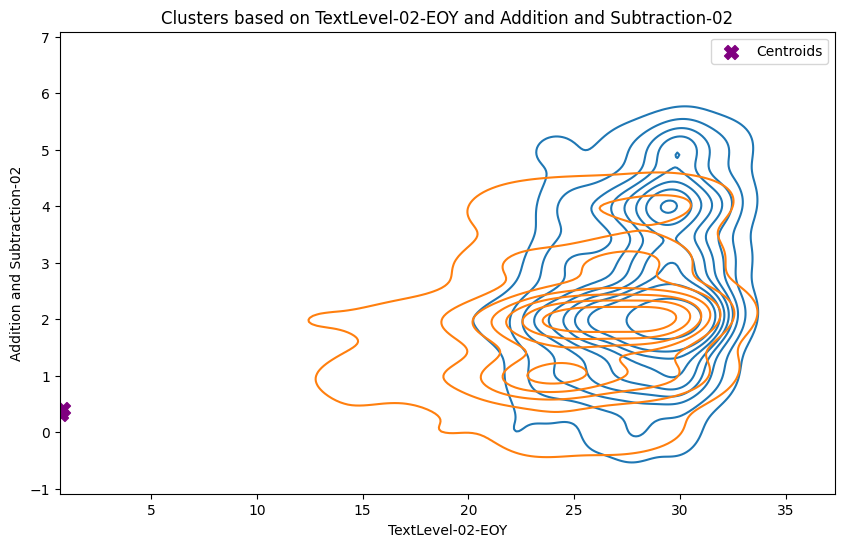

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


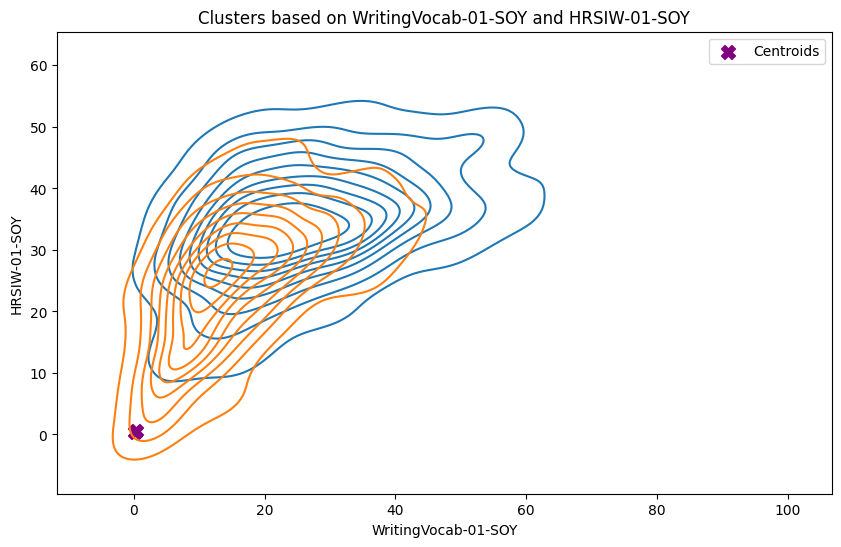

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


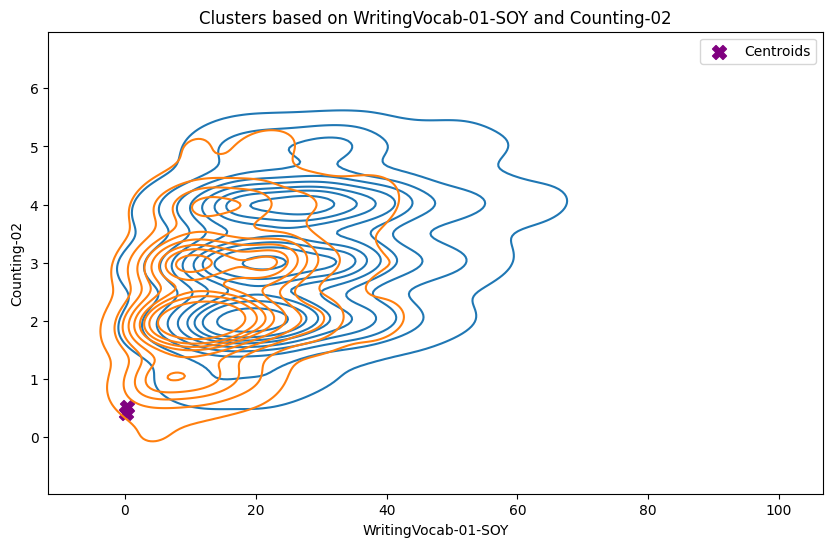

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


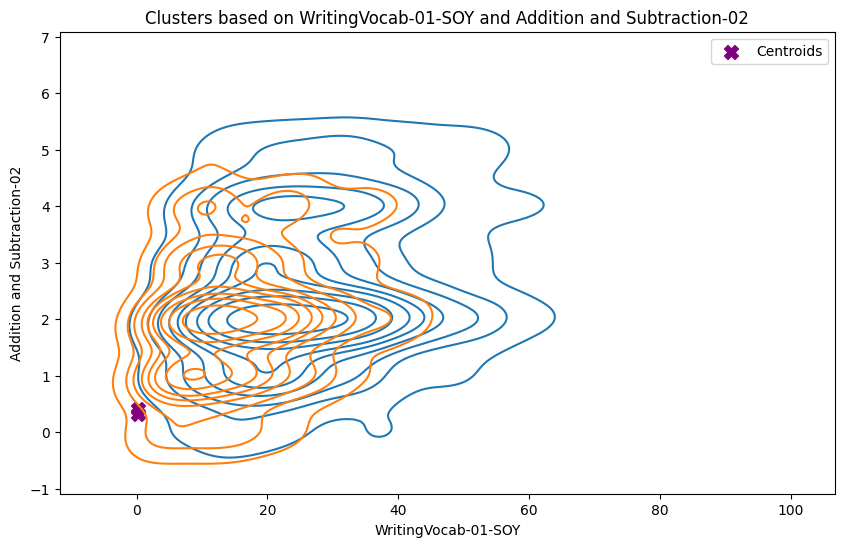

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


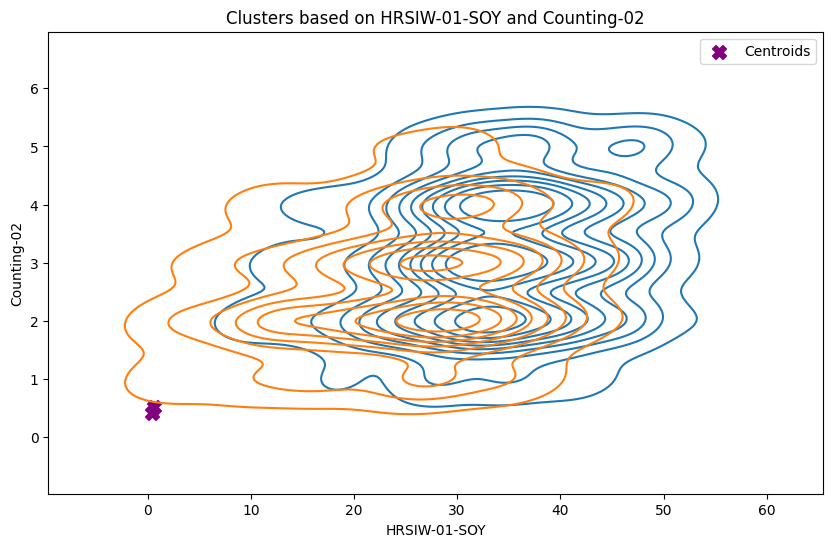

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


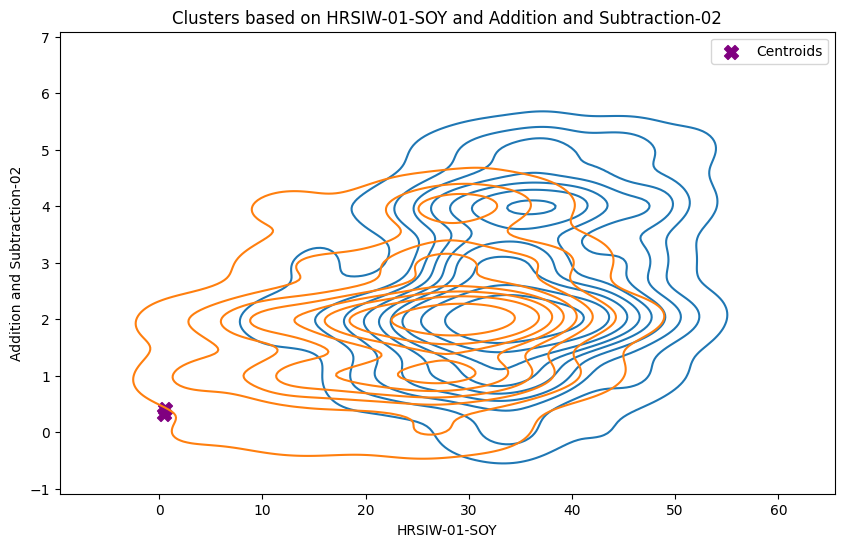

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


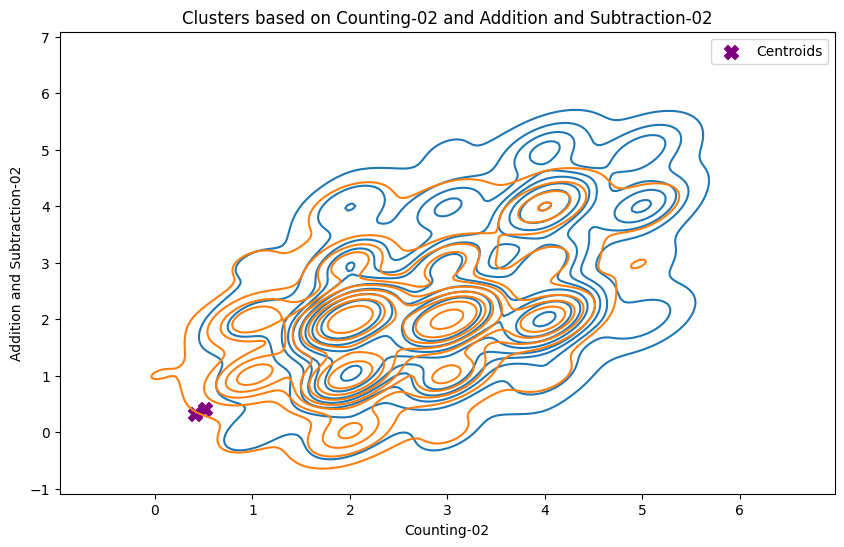

In [ ]:
import itertools

# Define the list of columns to iterate through
columns = ['Year_02', '02.SES', 'Burt-01-EOY', 'Clay-01-SOY', 'Clay-01-EOY',
           'TextLevel-02-EOY', 'WritingVocab-01-SOY',
           'HRSIW-01-SOY', 'Counting-02', 'Addition and Subtraction-02']

# Get the centroids from the kmeans model. It is based on X_scaled.
centroids = kmeans.cluster_centers_[:, :len(columns)]

scaler.fit(X_scaled)

# Reverse the scaling on the centroids.
centroids_original = scaler.inverse_transform(centroids)

# Generate all possible pairs of columns
pairs_of_indices = list(itertools.combinations(range(len(columns)), 2))

# Loop through all pairs of features
for idx_x, idx_y in pairs_of_indices:
    col_x = columns[idx_x]
    col_y = columns[idx_y]

    # Create the KDE plot for the records
    plt.figure(figsize=(10, 6))
    sns.kdeplot(data=records, x=col_x, y=col_y, hue='Cluster', palette='tab10', legend='full')

    # Fetch the centroids for the specified pair of columns
    x_centroids = centroids_original[:, idx_x]
    y_centroids = centroids_original[:, idx_y]

    # Overlay the centroids on the same plot
    plt.scatter(x_centroids, y_centroids, c='purple', marker='X', s=100, label='Centroids')

    # Setting the title and labels
    plt.title(f'Clusters based on {col_x} and {col_y}')
    plt.xlabel(col_x)
    plt.ylabel(col_y)
    plt.legend(loc='upper right')

    # Show the plot
    plt.show()


In [ ]:
records.groupby('Cluster')['Clay-01-EOY'].describe()

,count,mean,std,min,25%,50%,75%,max
Cluster,,,,,,,,
0,1198.0,0.601836,1.116099,0.0,0.0,0.0,1.0,8.0
1,801.0,13.230961,2.674012,1.0,12.0,13.0,15.0,20.0


In [ ]:
records.groupby('Cluster')['Counting-02'].describe()

,count,mean,std,min,25%,50%,75%,max
Cluster,,,,,,,,
0,1198.0,3.093489,1.057072,0.0,2.0,3.0,4.0,6.0
1,801.0,2.488140,0.991298,0.0,2.0,2.0,3.0,5.0


In [ ]:
# Get centroids of the clusters
centroids = kmeans.cluster_centers_

# Display the centroids
for idx, centroid in enumerate(centroids):
    print(f"Cluster {idx} centroid values:")
    for feature, value in zip(features, centroid):
        print(f"  {feature}: {value:.2f}")
    print("\n")

# To identify importance, you can look at the difference between centroids
for idx, feature in enumerate(features):
    try: # Add a try-except block to catch potential errors.
        print(f"Range for {feature}: {max(centroid[idx] for centroid in centroids) - min(centroid[idx] for centroid in centroids):.2f}")
    except IndexError: # Handle the IndexError specifically.
        print(f"IndexError encountered for feature: {feature}")
        # Print debugging information if needed
        print(f"Centroid length: {len(centroids[0])}, Current index: {idx}")

Cluster 0 centroid values:
  Burt-01-SOY: 0.55
  Clay-01-EOY: 0.57
  TextLevel-01-MOY: 0.41
  TextLevel-02-SOY: 0.05
  TextLevel-02-EOY: 0.03
  WritingVocab-01-SOY: 0.83
  HRSIW-01-SOY: 0.28
  Counting-01: 0.59
  Counting-02: 0.52
  Place Value-01: 0.41


Cluster 1 centroid values:
  Burt-01-SOY: 0.50
  Clay-01-EOY: 0.57
  TextLevel-01-MOY: 0.30
  TextLevel-02-SOY: 0.27
  TextLevel-02-EOY: 0.66
  WritingVocab-01-SOY: 0.71
  HRSIW-01-SOY: 0.16
  Counting-01: 0.43
  Counting-02: 0.41
  Place Value-01: 0.32


Range for Burt-01-SOY: 0.05
Range for Clay-01-EOY: 0.00
Range for TextLevel-01-MOY: 0.11
Range for TextLevel-02-SOY: 0.22
Range for TextLevel-02-EOY: 0.63
Range for WritingVocab-01-SOY: 0.12
Range for HRSIW-01-SOY: 0.12
Range for Counting-01: 0.17
Range for Counting-02: 0.10
Range for Place Value-01: 0.09
IndexError encountered for feature: Disability_Cognitive
Centroid length: 10, Current index: 10


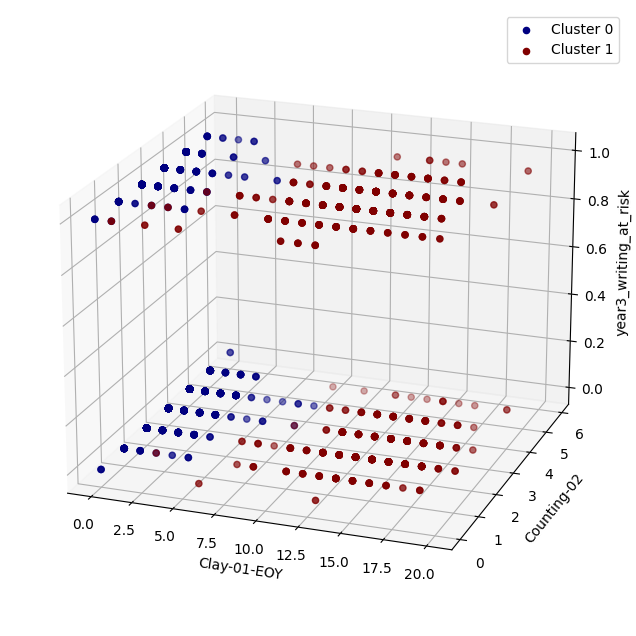

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Create a new figure
fig = plt.figure(figsize=(12, 8))

# Add 3D subplot
# The '111' means 1x1 grid, first subplot, similar to MATLAB-style
ax = fig.add_subplot(111, projection='3d')

# Unique cluster labels
unique_clusters = records['Cluster'].unique()

# Color map
colors = plt.cm.jet(np.linspace(0, 1, len(unique_clusters)))

# Adjusting the viewing angle for better visibility
ax.view_init(elev=20, azim=-70)  # Modify these values as needed

# Scatter plot for each cluster
for i, cluster in enumerate(unique_clusters):
    cluster_data = records[records['Cluster'] == cluster]
    ax.scatter(cluster_data['Clay-01-EOY'], cluster_data['Counting-02'], cluster_data['year3_writing_at_risk'],
               label=f'Cluster {cluster}', c=[colors[i]])

# Legend and labels
ax.set_xlabel('Clay-01-EOY')
ax.set_ylabel('Counting-02')
ax.set_zlabel('year3_writing_at_risk')
ax.legend()

# Show the plot
plt.show()

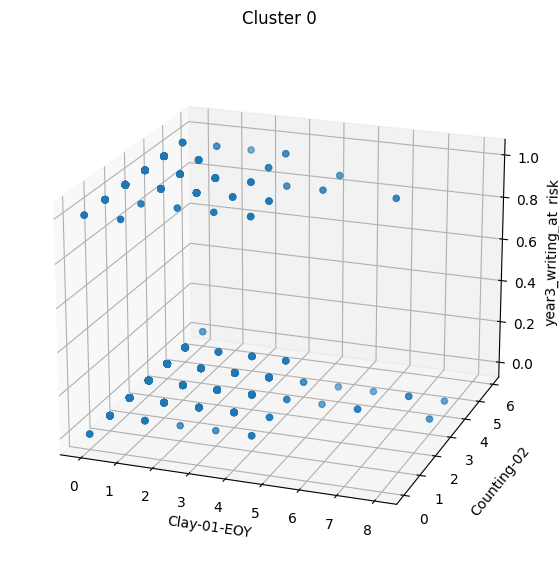

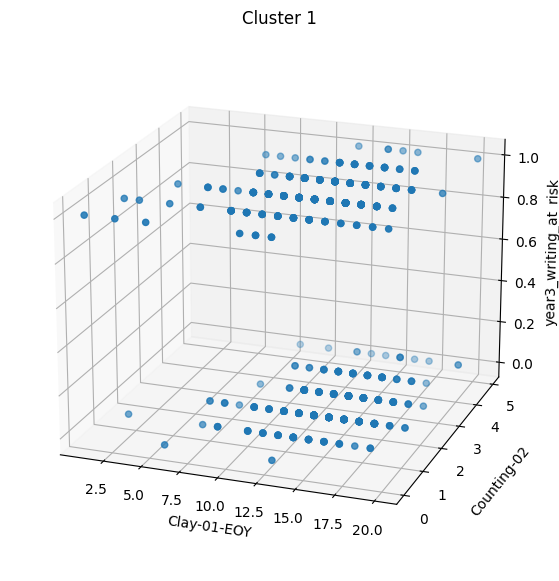

In [ ]:
unique_clusters = records['Cluster'].unique()

# Iterate over each unique cluster to create a 3D plot
for cluster in unique_clusters:
    fig = plt.figure(figsize=(12, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Filter data to include only the current cluster
    cluster_data = records[records['Cluster'] == cluster]

    # Create 3D scatter plot
    ax.scatter(cluster_data['Clay-01-EOY'], cluster_data['Counting-02'], cluster_data['year3_writing_at_risk'])

    # Adjusting the viewing angle for better visibility
    ax.view_init(elev=20, azim=-70)  # Modify these values as needed

    # Adding title and labels
    ax.set_title(f'Cluster {cluster}')
    ax.set_xlabel('Clay-01-EOY')
    ax.set_ylabel('Counting-02', labelpad=10)
    ax.set_zlabel('year3_writing_at_risk')

    plt.show()

year3_writing_at_risk :

          count      mean       std  min  25%  50%  75%  max
Cluster                                                     
0        1198.0  0.223706  0.416901  0.0  0.0  0.0  0.0  1.0
1         801.0  0.496879  0.500303  0.0  0.0  0.0  1.0  1.0




/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tu

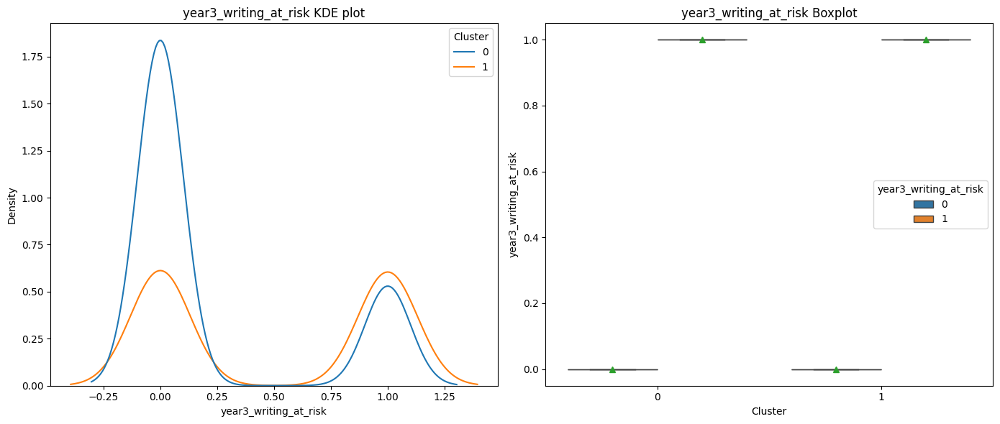

Clay-01-EOY :

          count       mean       std  min   25%   50%   75%   max
Cluster                                                          
0        1198.0   0.601836  1.116099  0.0   0.0   0.0   1.0   8.0
1         801.0  13.230961  2.674012  1.0  12.0  13.0  15.0  20.0




/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tu

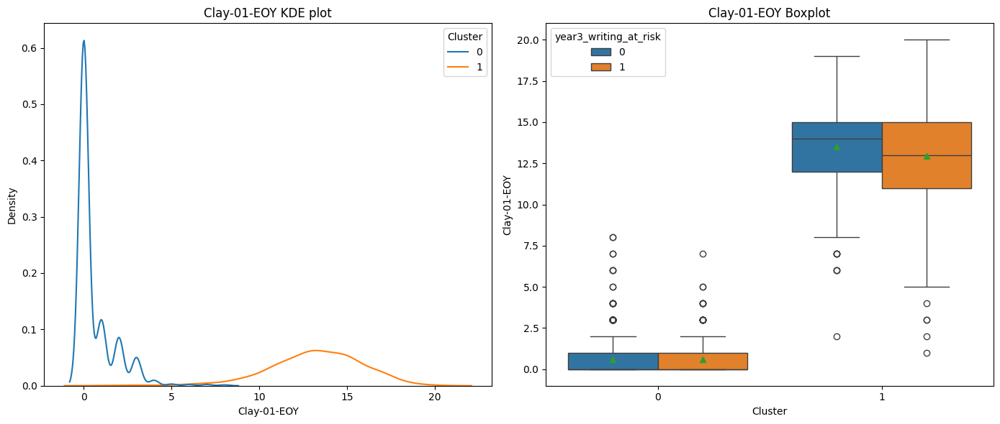

Counting-02 :

          count      mean       std  min  25%  50%  75%  max
Cluster                                                     
0        1198.0  3.093489  1.057072  0.0  2.0  3.0  4.0  6.0
1         801.0  2.488140  0.991298  0.0  2.0  2.0  3.0  5.0




/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tu

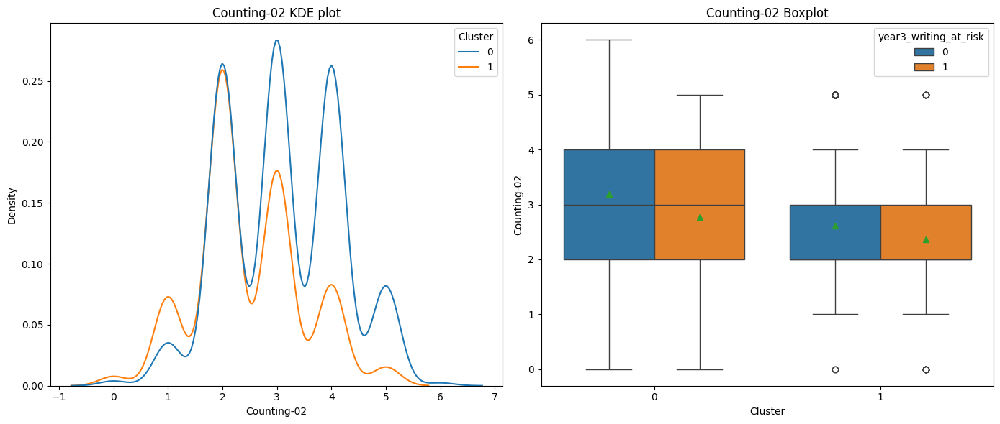

In [ ]:
nums=['year3_writing_at_risk','Clay-01-EOY', 'Counting-02']
for i in nums:
  print(i, ':\n')
  print(records.groupby('Cluster')[i].describe())
  print('\n')

  # Create subplots
  fig, axes = plt.subplots(1, 2, figsize=(14, 6))

  # Plot KDE on the first subplot
  sns.kdeplot(data=records, x=i, hue='Cluster', palette='tab10', ax=axes[0])
  axes[0].set_title(f'{i} KDE plot')

  # Plot Boxplot on the second subplot
  sns.boxplot(data=records, x='Cluster', y=i, hue='year3_writing_at_risk', showmeans=True, ax=axes[1])
  axes[1].set_title(f'{i} Boxplot')

  plt.tight_layout()  # Adjust layout so plots do not overlap
  plt.show()

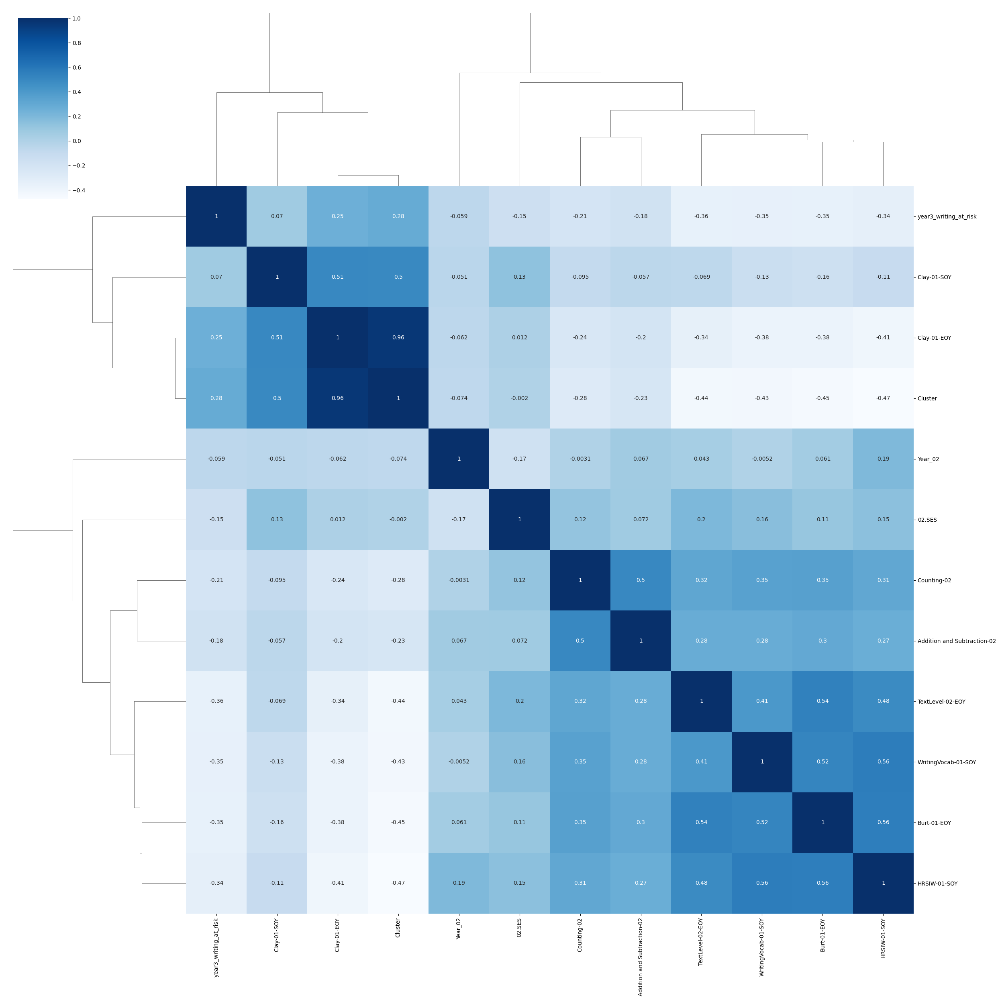

In [ ]:
sns.clustermap(
    data=records [['Year_02', '02.SES', 'Burt-01-EOY', 'Clay-01-SOY', 'Clay-01-EOY',
                       'TextLevel-02-EOY', 'WritingVocab-01-SOY',
                       'HRSIW-01-SOY', 'Counting-02', 'Addition and Subtraction-02',
                  'Cluster', 'year3_writing_at_risk']].corr(),
    cmap="Blues", annot=True, figsize=(25, 25)
)